# Problem Statements
The data given below contains the information about the loan application at the time of applying for the loan. It contains two types of scenarios:

1. The client with payment difficulties: he/she had late payment more than X days on at least one of the first Y instalments of the loan in our sample,

2. All other cases: All other cases when the payment is paid on time.

When a client applies for a loan, there are four types of decisions that could be taken by the client/company):

* Approved: The Company has approved loan Application

* Cancelled: The client cancelled the application sometime during approval. Either the client changed her/his mind about the loan or in some cases due to a higher risk of the client, he received worse pricing which he did not want.

* Refused: The company had rejected the loan (because the client does not meet their requirements etc.).

* Unused offer: Loan has been cancelled by the client but at different stages of the process.

## Buisness Objective

This dataset has 2 files as explained below:

1. 'application_data.csv' contains all the information of the client at the time of application. The data is about whether a client has payment difficulties.

2. 'previous_application.csv' contains information about the client’s previous loan data. It contains the data on whether the previous application had been Approved, Cancelled, Refused or Unused offer.


In [1]:
# Import Important libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

# to ignore warning
import warnings
warnings.filterwarnings("ignore")

In [2]:
# Import Datasets
previous_applications = pd.read_csv("/Users/sachinsen/Documents/Sachin/drive-download-20220913T145550Z-001/previous_application.csv")
current_applications = pd.read_csv("/Users/sachinsen/Documents/Sachin/drive-download-20220913T145550Z-001/application_data.csv")

In [3]:
# Check length of rows and columns of both data set
print("Previous applications : ", previous_applications.shape)
print("Current applications : ", current_applications.shape)

Previous applications :  (1670214, 37)
Current applications :  (307511, 122)


In [4]:
current_applications.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [5]:
# as we are not able to see all the columns so in this can we can apply display max columns 
# we can apply same on rows so that we can see rows as well
pd.set_option('display.max_rows' , None)
pd.set_option('display.max_columns' , None)

# Data Understanding

## Dataset 1 application_data

In [6]:
current_applications.dtypes

SK_ID_CURR                        int64
TARGET                            int64
NAME_CONTRACT_TYPE               object
CODE_GENDER                      object
FLAG_OWN_CAR                     object
FLAG_OWN_REALTY                  object
CNT_CHILDREN                      int64
AMT_INCOME_TOTAL                float64
AMT_CREDIT                      float64
AMT_ANNUITY                     float64
AMT_GOODS_PRICE                 float64
NAME_TYPE_SUITE                  object
NAME_INCOME_TYPE                 object
NAME_EDUCATION_TYPE              object
NAME_FAMILY_STATUS               object
NAME_HOUSING_TYPE                object
REGION_POPULATION_RELATIVE      float64
DAYS_BIRTH                        int64
DAYS_EMPLOYED                     int64
DAYS_REGISTRATION               float64
DAYS_ID_PUBLISH                   int64
OWN_CAR_AGE                     float64
FLAG_MOBIL                        int64
FLAG_EMP_PHONE                    int64
FLAG_WORK_PHONE                   int64


In [7]:
# to understand the numerical values and to compare any numerical  present in datafram are not left
current_applications.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,104582.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307509.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,134133.000000,3.068510e+05,246546.000000,151450.00000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,159080.000000,306490.000000,306490.000000,306490.000000,306490.000000,307510.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.00000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,-4986.120328,-2994.202373,12.061091,0.999997,0.819889,0.199368,0.998133,0.281066,0.056720,2.152665,2.052463,2.031521,12.063419,0.015144,0.050769,0.040659,0.078173,0.230454,0.179555,0.502130,5.143927e-01,0.510853,0.11744,0.088442,0.977735,0.752471,0.044621,0.078942,0.149725,0.226282,0.231894,0.066333,0.100775,0.107399,0.008809,0.028358,0.114231,0.087543,0.977065,0.759637,0.042553,0.074490,0.145193,0.222315,0.228058,0.064958,0.105645,0.105975,0.008076,0.027022,0.117850,0.087955,0.97

### observation by describe columns

1. columns contain negative values as well which i need to check 


## Null values for current applications data

In [8]:
# by isnull function find Null values
current_applications.isnull().sum()

SK_ID_CURR                           0
TARGET                               0
NAME_CONTRACT_TYPE                   0
CODE_GENDER                          0
FLAG_OWN_CAR                         0
FLAG_OWN_REALTY                      0
CNT_CHILDREN                         0
AMT_INCOME_TOTAL                     0
AMT_CREDIT                           0
AMT_ANNUITY                         12
AMT_GOODS_PRICE                    278
NAME_TYPE_SUITE                   1292
NAME_INCOME_TYPE                     0
NAME_EDUCATION_TYPE                  0
NAME_FAMILY_STATUS                   0
NAME_HOUSING_TYPE                    0
REGION_POPULATION_RELATIVE           0
DAYS_BIRTH                           0
DAYS_EMPLOYED                        0
DAYS_REGISTRATION                    0
DAYS_ID_PUBLISH                      0
OWN_CAR_AGE                     202929
FLAG_MOBIL                           0
FLAG_EMP_PHONE                       0
FLAG_WORK_PHONE                      0
FLAG_CONT_MOBILE         

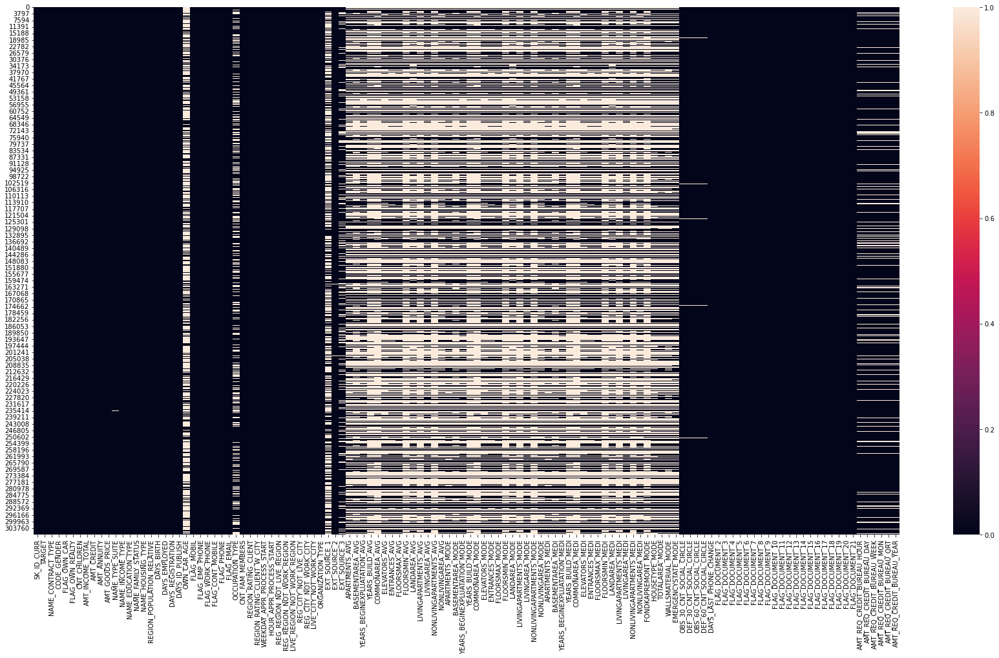

In [9]:
# By heatmap we are goinf to see how many columns are having null value
plt.figure(figsize=(30,15))
sns.heatmap(current_applications.isnull())
plt.show()

### Observation

with heatmap i can get an idea how many columns are empty

In [10]:
## Percentage of Missing values
## heatmap shows there are lot of missing values

percentage_current_data_nullvalues = current_applications.isnull().sum()/current_applications.shape[0]*100
percentage_current_data_nullvalues

SK_ID_CURR                       0.000000
TARGET                           0.000000
NAME_CONTRACT_TYPE               0.000000
CODE_GENDER                      0.000000
FLAG_OWN_CAR                     0.000000
FLAG_OWN_REALTY                  0.000000
CNT_CHILDREN                     0.000000
AMT_INCOME_TOTAL                 0.000000
AMT_CREDIT                       0.000000
AMT_ANNUITY                      0.003902
AMT_GOODS_PRICE                  0.090403
NAME_TYPE_SUITE                  0.420148
NAME_INCOME_TYPE                 0.000000
NAME_EDUCATION_TYPE              0.000000
NAME_FAMILY_STATUS               0.000000
NAME_HOUSING_TYPE                0.000000
REGION_POPULATION_RELATIVE       0.000000
DAYS_BIRTH                       0.000000
DAYS_EMPLOYED                    0.000000
DAYS_REGISTRATION                0.000000
DAYS_ID_PUBLISH                  0.000000
OWN_CAR_AGE                     65.990810
FLAG_MOBIL                       0.000000
FLAG_EMP_PHONE                   0

In [11]:
null_columns = [i for i in current_applications.columns if current_applications[i].isnull().sum()>1]

for j in null_columns:
  print(j, np.round(current_applications[j].isnull().sum()/current_applications.shape[0]*100, 4), "% Missing values")

AMT_ANNUITY 0.0039 % Missing values
AMT_GOODS_PRICE 0.0904 % Missing values
NAME_TYPE_SUITE 0.4201 % Missing values
OWN_CAR_AGE 65.9908 % Missing values
OCCUPATION_TYPE 31.3455 % Missing values
CNT_FAM_MEMBERS 0.0007 % Missing values
EXT_SOURCE_1 56.3811 % Missing values
EXT_SOURCE_2 0.2146 % Missing values
EXT_SOURCE_3 19.8253 % Missing values
APARTMENTS_AVG 50.7497 % Missing values
BASEMENTAREA_AVG 58.516 % Missing values
YEARS_BEGINEXPLUATATION_AVG 48.781 % Missing values
YEARS_BUILD_AVG 66.4978 % Missing values
COMMONAREA_AVG 69.8723 % Missing values
ELEVATORS_AVG 53.296 % Missing values
ENTRANCES_AVG 50.3488 % Missing values
FLOORSMAX_AVG 49.7608 % Missing values
FLOORSMIN_AVG 67.8486 % Missing values
LANDAREA_AVG 59.3767 % Missing values
LIVINGAPARTMENTS_AVG 68.355 % Missing values
LIVINGAREA_AVG 50.1933 % Missing values
NONLIVINGAPARTMENTS_AVG 69.433 % Missing values
NONLIVINGAREA_AVG 55.1792 % Missing values
APARTMENTS_MODE 50.7497 % Missing values
BASEMENTAREA_MODE 58.516 % Mi

In [12]:
## missing value % are more than 50% 
## we can drop these columns
null_columns_current_applications = percentage_current_data_nullvalues[percentage_current_data_nullvalues >40].index
print(null_columns_current_applications)
print('column count : ',null_columns_current_applications.shape)

Index(['OWN_CAR_AGE', 'EXT_SOURCE_1', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG',
       'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG',
       'ELEVATORS_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG', 'FLOORSMIN_AVG',
       'LANDAREA_AVG', 'LIVINGAPARTMENTS_AVG', 'LIVINGAREA_AVG',
       'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_AVG', 'APARTMENTS_MODE',
       'BASEMENTAREA_MODE', 'YEARS_BEGINEXPLUATATION_MODE', 'YEARS_BUILD_MODE',
       'COMMONAREA_MODE', 'ELEVATORS_MODE', 'ENTRANCES_MODE', 'FLOORSMAX_MODE',
       'FLOORSMIN_MODE', 'LANDAREA_MODE', 'LIVINGAPARTMENTS_MODE',
       'LIVINGAREA_MODE', 'NONLIVINGAPARTMENTS_MODE', 'NONLIVINGAREA_MODE',
       'APARTMENTS_MEDI', 'BASEMENTAREA_MEDI', 'YEARS_BEGINEXPLUATATION_MEDI',
       'YEARS_BUILD_MEDI', 'COMMONAREA_MEDI', 'ELEVATORS_MEDI',
       'ENTRANCES_MEDI', 'FLOORSMAX_MEDI', 'FLOORSMIN_MEDI', 'LANDAREA_MEDI',
       'LIVINGAPARTMENTS_MEDI', 'LIVINGAREA_MEDI', 'NONLIVINGAPARTMENTS_MEDI',
       'NONLIVINGAREA_MEDI', 'FO

## Dropping Null values more than 40%

In [13]:
current_applications.drop(null_columns_current_applications, axis=1, inplace=True)

In [14]:
current_applications.shape

(307511, 73)

In [15]:
# find left missing values
afterdropping_current =[i for i in current_applications.columns if current_applications[i].isnull().sum()>1]
afterdropping_current

['AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'NAME_TYPE_SUITE',
 'OCCUPATION_TYPE',
 'CNT_FAM_MEMBERS',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'AMT_REQ_CREDIT_BUREAU_HOUR',
 'AMT_REQ_CREDIT_BUREAU_DAY',
 'AMT_REQ_CREDIT_BUREAU_WEEK',
 'AMT_REQ_CREDIT_BUREAU_MON',
 'AMT_REQ_CREDIT_BUREAU_QRT',
 'AMT_REQ_CREDIT_BUREAU_YEAR']

## Check columns which are having more than 15% null values

In [16]:
## missing value % are more than 15% 

null15= current_applications.isnull().sum()/current_applications.shape[0]*100
null15[null15>15].sort_values()

EXT_SOURCE_3       19.825307
OCCUPATION_TYPE    31.345545
dtype: float64

### Observation
2 columns are having more than 15% of null values

In [17]:
null15columns =null15[null15>15].index
null15columns

Index(['OCCUPATION_TYPE', 'EXT_SOURCE_3'], dtype='object')

In [18]:
for feature in null15columns:
    print(feature ,  current_applications[feature].unique())

OCCUPATION_TYPE ['Laborers' 'Core staff' 'Accountants' 'Managers' nan 'Drivers'
 'Sales staff' 'Cleaning staff' 'Cooking staff' 'Private service staff'
 'Medicine staff' 'Security staff' 'High skill tech staff'
 'Waiters/barmen staff' 'Low-skill Laborers' 'Realty agents' 'Secretaries'
 'IT staff' 'HR staff']
EXT_SOURCE_3 [1.39375780e-01            nan 7.29566691e-01 6.21226338e-01
 4.92060094e-01 5.40654450e-01 7.51723715e-01 3.63945239e-01
 6.52896552e-01 1.76652579e-01 7.70087070e-01 6.78567689e-01
 6.21030378e-02 5.56727426e-01 4.77649155e-01 5.42445144e-01
 3.58951229e-01 6.69056695e-01 5.65607981e-01 4.61482391e-01
 1.90705948e-01 6.59405532e-01 5.24496446e-01 4.10102573e-01
 7.98137231e-01 4.11848556e-01 7.54406173e-01 7.22392890e-01
 6.05836265e-01 3.20163367e-01 3.99675616e-01 6.84827659e-01
 4.75849909e-01 7.28141299e-01 4.66864006e-01 4.79448981e-01
 3.09275356e-01 7.99296783e-01 7.01695774e-01 7.38019620e-01
 7.01088438e-02 1.69428727e-01 5.13693766e-01 7.07699345e-01
 3.392

### Observation-  I have a doubt with EXT_SOURCE_3 because EXT_SOURCE_2 is in dataset after removing null values above 40% before removie the I would check them with each other and remove later

In [19]:
## Data Set left after removing columns41+8 = 49 - (122-49)=73 
current_applications.shape

(307511, 73)

In [20]:
current_applications.isnull().sum()/current_applications.shape[0]*100 


SK_ID_CURR                      0.000000
TARGET                          0.000000
NAME_CONTRACT_TYPE              0.000000
CODE_GENDER                     0.000000
FLAG_OWN_CAR                    0.000000
FLAG_OWN_REALTY                 0.000000
CNT_CHILDREN                    0.000000
AMT_INCOME_TOTAL                0.000000
AMT_CREDIT                      0.000000
AMT_ANNUITY                     0.003902
AMT_GOODS_PRICE                 0.090403
NAME_TYPE_SUITE                 0.420148
NAME_INCOME_TYPE                0.000000
NAME_EDUCATION_TYPE             0.000000
NAME_FAMILY_STATUS              0.000000
NAME_HOUSING_TYPE               0.000000
REGION_POPULATION_RELATIVE      0.000000
DAYS_BIRTH                      0.000000
DAYS_EMPLOYED                   0.000000
DAYS_REGISTRATION               0.000000
DAYS_ID_PUBLISH                 0.000000
FLAG_MOBIL                      0.000000
FLAG_EMP_PHONE                  0.000000
FLAG_WORK_PHONE                 0.000000
FLAG_CONT_MOBILE

# Analyse columns one by one and remove if found not relevant

In [21]:
current_applications.TARGET.dtypes

dtype('int64')

In [22]:
current_applications.TARGET.value_counts()

0    282686
1     24825
Name: TARGET, dtype: int64

### Check Flag columns 

In [23]:
flags_col = [feature for feature in current_applications.columns if 'FLAG' in feature]
flags_col

['FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'FLAG_DOCUMENT_2',
 'FLAG_DOCUMENT_3',
 'FLAG_DOCUMENT_4',
 'FLAG_DOCUMENT_5',
 'FLAG_DOCUMENT_6',
 'FLAG_DOCUMENT_7',
 'FLAG_DOCUMENT_8',
 'FLAG_DOCUMENT_9',
 'FLAG_DOCUMENT_10',
 'FLAG_DOCUMENT_11',
 'FLAG_DOCUMENT_12',
 'FLAG_DOCUMENT_13',
 'FLAG_DOCUMENT_14',
 'FLAG_DOCUMENT_15',
 'FLAG_DOCUMENT_16',
 'FLAG_DOCUMENT_17',
 'FLAG_DOCUMENT_18',
 'FLAG_DOCUMENT_19',
 'FLAG_DOCUMENT_20',
 'FLAG_DOCUMENT_21']

### create datafram with Target columns to check

In [24]:
# flags_col + current_applications[TARGET]

flags_data = current_applications[flags_col+ ['TARGET']]
flags_data.shape

(307511, 29)

In [25]:
flags_data.head()

,FLAG_OWN_CAR,FLAG_OWN_REALTY,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,TARGET
0,N,Y,1,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1,N,N,1,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Y,Y,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,N,Y,1,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,N,Y,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [26]:
current_applications[flags_col+ ['TARGET']].corr()

,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,TARGET
FLAG_MOBIL,1.000000,-0.000845,0.000900,-0.000078,0.001128,0.000442,0.000012,0.002822,0.000016,0.000223,0.000560,0.000025,-0.006059,0.000113,0.000009,0.000113,0.000005,0.000107,0.000098,0.000063,0.000181,0.000029,-0.019919,0.000044,0.000041,0.000033,0.000534
FLAG_EMP_PHONE,-0.000845,1.000000,0.233801,-0.012819,-0.016131,0.062542,0.003047,0.248534,-0.000467,0.019778,-0.597732,0.001605,0.122043,0.023878,0.000463,0.029373,0.001195,0.025878,0.023559,0.014364,0.043008,0.007136,0.040548,0.010049,0.010183,0.008579,0.045982
FLAG_WORK_PHONE,0.000900,0.233801,1.000000,0.021580,0.293105,-0.011520,-0.001993,0.060342,-0.004500,0.036847,-0.138345,0.001902,0.021464,0.008252,0.002737,0.123500,-0.001273,0.001769,-0.002712,0.007689,0.005692,0.001322,0.032049,0.011854,0.001771,0.001541,0.028524
FLAG_CONT_MOBILE,-0.000078,-0.012819,0.021580,1.000000,0.006257,-0.005356,0.000281,0.006235,0.000390,0.005357,0.009981,-0.004841,-0.022400,-0.008180,0.000206,0.002710,0.000110,-0.064800,-0.072839,-0.013667,-0.030625,-0.013136,-0.043068,-0.005123,0.000974,-0.015677,0.000370
FLAG_PHONE,0.001128,-0.016131,0.293105,0.006257,1.000000,0.014657,-0.000728,-0.008020,0.003990,0.075455,0.009836,0.013276,0.004778,0.012923,0.004598,0.003231,-0.001595,0.006997,0.010321,0.008001,0.010354,0.004410,0.004055,0.009660,0.000692,0.000020,-0.023806
FLAG_EMAIL,0.000442,0.062542,-0.011520,-0.005356,0.014657,1.000000,0.002730,0.012015,0.002467,0.000734,-0.042660,0.001678,0.030474,0.009490,0.001777,-0.003656,-0.000625,-0.003436,0.001502,-0.003276,-0.012644,-0.001422,-0.008110,-0.002525,-0.001778,-0.000647,-0.001758
FLAG_DOCUMENT_2,0.000012,0.003047,-0.001993,0.000281,-0.000728,0.002730,1.000000,-0.010174,-0.000059,-0.000805,-0.002020,-0.000090,-0.001935,-0.000407,-0.000031,-0.000407,-0.000017,-0.000387,-0.000353,-0.000226,-0.000651,-0.000106,-0.000589,-0.000159,-0.000146,-0.000119,0.005417
FLAG_DOCUMENT_3,0.002822,0.248534,0.060342,0.006235,-0.008020,0.012015,-0.010174,1.000000,-0.014110,-0.193850,-0.486238,-0.021677,-0.465730,-0.097859,-0.007466,-0.093242,-0.001180,-0.020274,0.002099,0.000592,0.033418,0.002536,0.007976,0.009423,0.007396,-0.025510,0.044346
FLAG_DOCUMENT_4,0.000016,-0.000467,-0.004500,0.000390,0.003990,0.002467,-0.000059,-0.014110,1.000000,-0.001117,-0.002802,-0.000125,-0.002684,-0.000564,-0.000043,-0.000565,-0.000023,-0.000536,-0.000489,-0.000314,-0.000903,-0.000147,-0.000816,-0.000220,-0.000203,-0.000165,-0.002672
FLAG_DOCUMENT_5,0.000223,0.019778,0.036847,0.005357,0.075455,0.000734,-0.000805,-0.193850,-0.001117,1.000000,-0.038495,-0.001716,-0.036871,-0.007747,-0.000591,-0.007764,-0.000316,-0.007368,-0.006723,-0.004311,-0.012137,-0.002023,-0.010622,-0.003023,-0.002791,0.000645,-0.000316


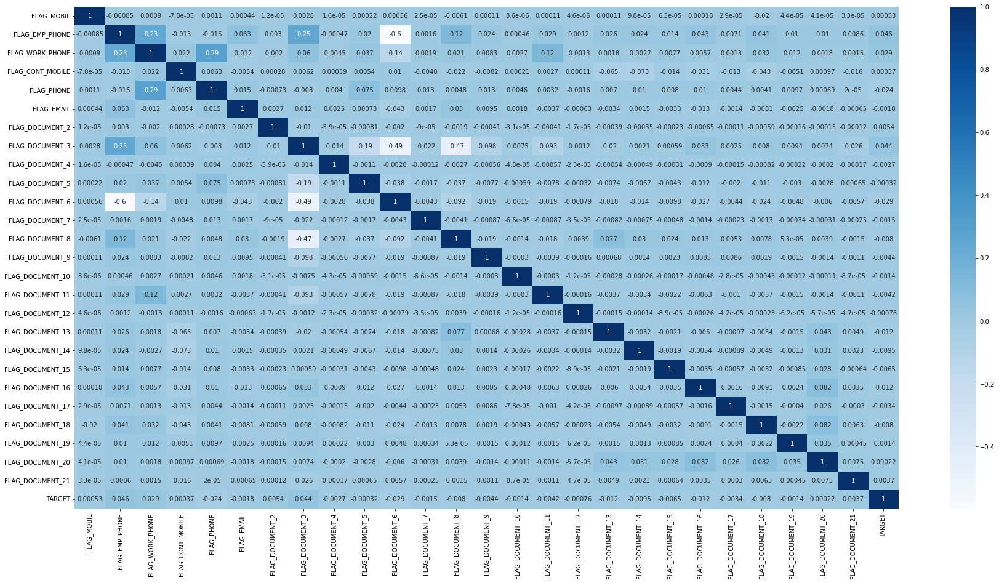

In [27]:
plt.figure(figsize=(30,15))
sns.heatmap(flags_data.corr(), cmap= "Blues", annot=True )
plt.show()

In [28]:
flags_data['TARGET']=flags_data['TARGET'].replace({1:'Defaulter',0:'Repayer'})

In [29]:
#0    282686  , 1     24825
flags_data['TARGET'].value_counts()

Repayer      282686
Defaulter     24825
Name: TARGET, dtype: int64

### Observation
1. Repayers are 2,82,686
2. Defaulters are 24,825

In [30]:
## For count plot convert numeric values into categorical value in respect of TARGET
for feature in flags_data:
    if feature != 'TARGET':
        flags_data[feature]= flags_data[feature].replace({1:'Y', 0:'N'})

In [31]:
flags_data.head(10)

,FLAG_OWN_CAR,FLAG_OWN_REALTY,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,TARGET
0,N,Y,Y,Y,N,Y,Y,N,N,Y,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,Defaulter
1,N,N,Y,Y,N,Y,Y,N,N,Y,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,Repayer
2,Y,Y,Y,Y,Y,Y,Y,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,Repayer
3,N,Y,Y,Y,N,Y,N,N,N,Y,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,Repayer
4,N,Y,Y,Y,N,Y,N,N,N,N,N,N,N,N,Y,N,N,N,N,N,N,N,N,N,N,N,N,N,Repayer
5,N,Y,Y,Y,Y,Y,Y,N,N,Y,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,Repayer
6,Y,Y,Y,Y,N,Y,Y,N,N,N,N,N,N,N,Y,N,N,N,N,N,Y,N,N,N,N,N,N,N,Repayer
7,Y,Y,Y,Y,Y,Y,N,N,N,Y,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,Repayer
8,N,Y,Y,N,N,Y,N,N,N,Y,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,Repayer
9,N,Y,Y,Y,N,Y,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,Repayer


In [32]:
flags_data.shape

(307511, 29)

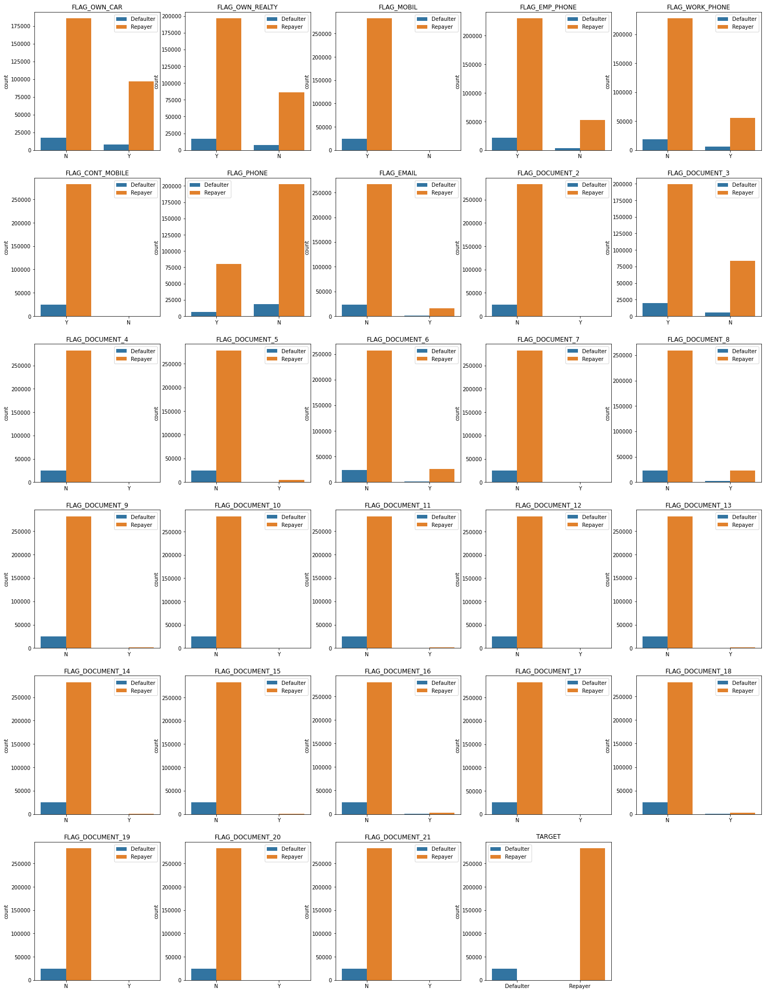

In [33]:
plt.figure(figsize=(25,40)) # Subplot size
for i,feature in enumerate(flags_data):# to select one by one digit
    plt.subplot(7,5, i+1) 
    sns.countplot(flags_data[feature], hue=flags_data['TARGET'])
    plt.title(feature)
    plt.xlabel(" ")
    plt.legend()
    

### Onservation 
'FLAG_OWN_CAR','FLAG_OWN_REALTY','FLAG_DOCUMENT_3' are having relation with target so we have to. keep these columns and delete rest others

In [34]:
## After seeing Countplot remove columns name which are can't afford to loose
flag_drop=flags_data.drop(['FLAG_OWN_CAR','FLAG_OWN_REALTY','FLAG_DOCUMENT_3','TARGET'],axis=1)
# keeping these columns make sense with data rest are documents columns
flag_drop.columns

Index(['FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE',
       'FLAG_PHONE', 'FLAG_EMAIL', 'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_4',
       'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_7',
       'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10',
       'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13',
       'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16',
       'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19',
       'FLAG_DOCUMENT_20', 'FLAG_DOCUMENT_21'],
      dtype='object')

In [35]:
len(flag_drop.columns)

25

In [36]:
## flag_drop.columns from main current application Dataset
current_applications.drop(flag_drop.columns, axis=1, inplace=True)


In [37]:
current_applications.shape

(307511, 48)

### check ['EXT_SOURCE_3','EXT_SOURCE_2'] 

In [38]:
check1 = ['EXT_SOURCE_3','EXT_SOURCE_2']

In [39]:
current_applications.EXT_SOURCE_2.dtypes

dtype('float64')

In [40]:
current_applications[check1].corr()

,EXT_SOURCE_3,EXT_SOURCE_2
EXT_SOURCE_3,1.000000,0.109167
EXT_SOURCE_2,0.109167,1.000000


### Now lets check ['EXT_SOURCE_3','EXT_SOURCE_2'] with Target Variables

In [41]:
current_applications[['EXT_SOURCE_3','EXT_SOURCE_2',"TARGET"]].corr()

,EXT_SOURCE_3,EXT_SOURCE_2,TARGET
EXT_SOURCE_3,1.000000,0.109167,-0.178919
EXT_SOURCE_2,0.109167,1.000000,-0.160472
TARGET,-0.178919,-0.160472,1.000000


<AxesSubplot:>

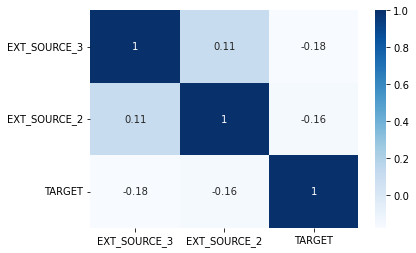

In [42]:
## See correlation with Heatmap

sns.heatmap(current_applications[['EXT_SOURCE_3','EXT_SOURCE_2','TARGET']].corr(), cmap='Blues', annot=True)

### Observation
* there is no relation 'EXT_SOURCE_3','EXT_SOURCE_2 with Target columns

### Drop EXT_SOURCE_3 , EXT_SOURCE_2 from current application dataset

In [43]:
current_applications.drop(check1, axis=1, inplace=True)

In [44]:
# after removing EXT_SOURCE_3 , EXT_SOURCE_2 
current_applications.shape

(307511, 46)

### Handling Missing Values

In [45]:
(current_applications.isnull().sum()/current_applications.shape[0]*100).sort_values(ascending=False)

OCCUPATION_TYPE                31.345545
AMT_REQ_CREDIT_BUREAU_YEAR     13.501631
AMT_REQ_CREDIT_BUREAU_QRT      13.501631
AMT_REQ_CREDIT_BUREAU_MON      13.501631
AMT_REQ_CREDIT_BUREAU_WEEK     13.501631
AMT_REQ_CREDIT_BUREAU_DAY      13.501631
AMT_REQ_CREDIT_BUREAU_HOUR     13.501631
NAME_TYPE_SUITE                 0.420148
OBS_30_CNT_SOCIAL_CIRCLE        0.332021
DEF_30_CNT_SOCIAL_CIRCLE        0.332021
OBS_60_CNT_SOCIAL_CIRCLE        0.332021
DEF_60_CNT_SOCIAL_CIRCLE        0.332021
AMT_GOODS_PRICE                 0.090403
AMT_ANNUITY                     0.003902
CNT_FAM_MEMBERS                 0.000650
DAYS_LAST_PHONE_CHANGE          0.000325
HOUR_APPR_PROCESS_START         0.000000
ORGANIZATION_TYPE               0.000000
LIVE_CITY_NOT_WORK_CITY         0.000000
REG_CITY_NOT_WORK_CITY          0.000000
REG_CITY_NOT_LIVE_CITY          0.000000
LIVE_REGION_NOT_WORK_REGION     0.000000
FLAG_DOCUMENT_3                 0.000000
REG_REGION_NOT_WORK_REGION      0.000000
REG_REGION_NOT_L

In [46]:
## Occupation_Type

current_applications.OCCUPATION_TYPE.isnull().sum()

96391

In [47]:
current_applications.OCCUPATION_TYPE.value_counts()

Laborers                 55186
Sales staff              32102
Core staff               27570
Managers                 21371
Drivers                  18603
High skill tech staff    11380
Accountants               9813
Medicine staff            8537
Security staff            6721
Cooking staff             5946
Cleaning staff            4653
Private service staff     2652
Low-skill Laborers        2093
Waiters/barmen staff      1348
Secretaries               1305
Realty agents              751
HR staff                   563
IT staff                   526
Name: OCCUPATION_TYPE, dtype: int64

### suggestion
In OCCUPATION_TYPE we can't put anything on the bases of Mode or Median so here i am replacing NaN with Unknown

In [48]:
## In OCCUPATION_TYPE we can't put anything on the bases of Mode or Median so here i am replacing NaN with Unknown
current_applications.OCCUPATION_TYPE.fillna('Unknown', inplace=True)

In [49]:
current_applications.OCCUPATION_TYPE.value_counts()

Unknown                  96391
Laborers                 55186
Sales staff              32102
Core staff               27570
Managers                 21371
Drivers                  18603
High skill tech staff    11380
Accountants               9813
Medicine staff            8537
Security staff            6721
Cooking staff             5946
Cleaning staff            4653
Private service staff     2652
Low-skill Laborers        2093
Waiters/barmen staff      1348
Secretaries               1305
Realty agents              751
HR staff                   563
IT staff                   526
Name: OCCUPATION_TYPE, dtype: int64

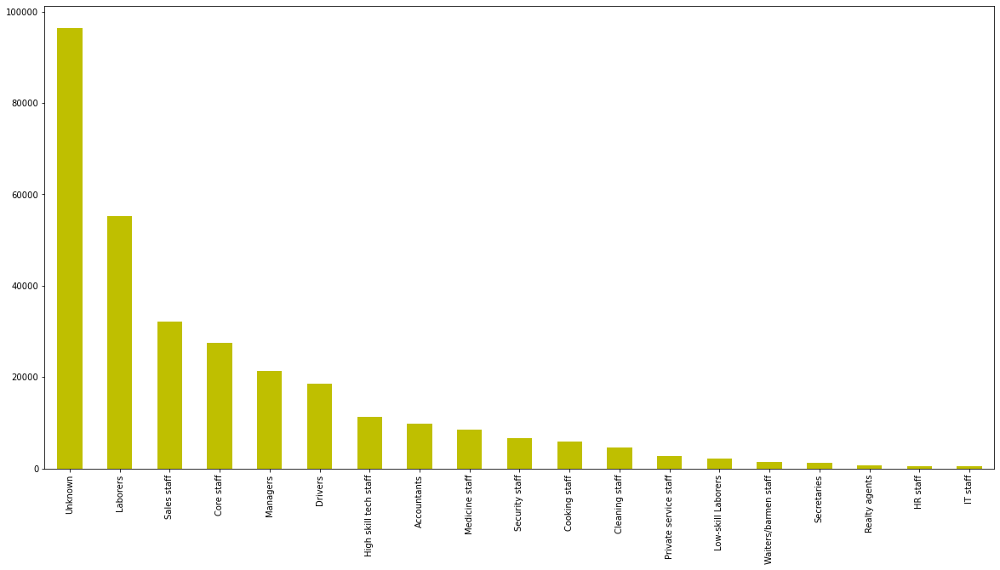

In [50]:
plt.figure(figsize=(20,10))
current_applications.OCCUPATION_TYPE.value_counts().plot.bar(color='y')
plt.show()

### Observation
In OCCUPATION_TYPE , unknown occupation people are more

In [51]:
(current_applications.isnull().sum()/current_applications.shape[0]*100).sort_values(ascending=False).index

Index(['AMT_REQ_CREDIT_BUREAU_YEAR', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'NAME_TYPE_SUITE', 'OBS_30_CNT_SOCIAL_CIRCLE',
       'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE',
       'DEF_60_CNT_SOCIAL_CIRCLE', 'AMT_GOODS_PRICE', 'AMT_ANNUITY',
       'CNT_FAM_MEMBERS', 'DAYS_LAST_PHONE_CHANGE',
       'WEEKDAY_APPR_PROCESS_START', 'FLAG_DOCUMENT_3', 'ORGANIZATION_TYPE',
       'LIVE_CITY_NOT_WORK_CITY', 'REG_CITY_NOT_WORK_CITY',
       'REG_CITY_NOT_LIVE_CITY', 'LIVE_REGION_NOT_WORK_REGION',
       'REG_REGION_NOT_WORK_REGION', 'REG_REGION_NOT_LIVE_REGION',
       'HOUR_APPR_PROCESS_START', 'SK_ID_CURR', 'REGION_RATING_CLIENT_W_CITY',
       'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR',
       'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',

In [52]:
## ['AMT_REQ_CREDIT_BUREAU_YEAR', 'AMT_REQ_CREDIT_BUREAU_QRT','AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_WEEK','AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_HOUR'
current_applications[['AMT_REQ_CREDIT_BUREAU_YEAR', 'AMT_REQ_CREDIT_BUREAU_QRT','AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_WEEK',
                     'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_HOUR']].describe()

,AMT_REQ_CREDIT_BUREAU_YEAR,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_HOUR
count,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,1.899974,0.265474,0.267395,0.034362,0.007000,0.006402
std,1.869295,0.794056,0.916002,0.204685,0.110757,0.083849
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,25.000000,261.000000,27.000000,8.000000,9.000000,4.000000


## Use median for all above columns
current_applications.fillna(current_applications[['AMT_REQ_CREDIT_BUREAU_YEAR', 'AMT_REQ_CREDIT_BUREAU_QRT','AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_WEEK',
                     'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_HOUR']].median(),inplace=True)

### Suggestion

Use Median to Fill na values 

In [53]:
current_applications[['AMT_REQ_CREDIT_BUREAU_YEAR', 'AMT_REQ_CREDIT_BUREAU_QRT','AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_WEEK',
                     'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_HOUR']].isnull().sum()

AMT_REQ_CREDIT_BUREAU_YEAR    41519
AMT_REQ_CREDIT_BUREAU_QRT     41519
AMT_REQ_CREDIT_BUREAU_MON     41519
AMT_REQ_CREDIT_BUREAU_WEEK    41519
AMT_REQ_CREDIT_BUREAU_DAY     41519
AMT_REQ_CREDIT_BUREAU_HOUR    41519
dtype: int64

## After filling all major null columns

In [54]:
np.round(current_applications.isnull().sum()/current_applications.shape[0]*100 ,2).sort_values(ascending=False).head(10)

AMT_REQ_CREDIT_BUREAU_YEAR    13.50
AMT_REQ_CREDIT_BUREAU_QRT     13.50
AMT_REQ_CREDIT_BUREAU_MON     13.50
AMT_REQ_CREDIT_BUREAU_WEEK    13.50
AMT_REQ_CREDIT_BUREAU_DAY     13.50
AMT_REQ_CREDIT_BUREAU_HOUR    13.50
NAME_TYPE_SUITE                0.42
OBS_30_CNT_SOCIAL_CIRCLE       0.33
DEF_30_CNT_SOCIAL_CIRCLE       0.33
OBS_60_CNT_SOCIAL_CIRCLE       0.33
dtype: float64

In [55]:
current_applications[['AMT_INCOME_TOTAL','AMT_CREDIT','AMT_GOODS_PRICE','AMT_ANNUITY']].describe()

,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_GOODS_PRICE,AMT_ANNUITY
count,3.075110e+05,3.075110e+05,3.072330e+05,307499.000000
mean,1.687979e+05,5.990260e+05,5.383962e+05,27108.573909
std,2.371231e+05,4.024908e+05,3.694465e+05,14493.737315
min,2.565000e+04,4.500000e+04,4.050000e+04,1615.500000
25%,1.125000e+05,2.700000e+05,2.385000e+05,16524.000000
50%,1.471500e+05,5.135310e+05,4.500000e+05,24903.000000
75%,2.025000e+05,8.086500e+05,6.795000e+05,34596.000000
max,1.170000e+08,4.050000e+06,4.050000e+06,258025.500000


In [56]:
Days_columns =[feature for feature in current_applications.columns if 'DAY' in feature]
Days_columns

['DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'WEEKDAY_APPR_PROCESS_START',
 'DAYS_LAST_PHONE_CHANGE',
 'AMT_REQ_CREDIT_BUREAU_DAY']

In [57]:
current_applications[Days_columns].describe()

,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_DAY
count,307511.000000,307511.000000,307511.000000,307511.000000,307510.000000,265992.000000
mean,-16036.995067,63815.045904,-4986.120328,-2994.202373,-962.858788,0.007000
std,4363.988632,141275.766519,3522.886321,1509.450419,826.808487,0.110757
min,-25229.000000,-17912.000000,-24672.000000,-7197.000000,-4292.000000,0.000000
25%,-19682.000000,-2760.000000,-7479.500000,-4299.000000,-1570.000000,0.000000
50%,-15750.000000,-1213.000000,-4504.000000,-3254.000000,-757.000000,0.000000
75%,-12413.000000,-289.000000,-2010.000000,-1720.000000,-274.000000,0.000000
max,-7489.000000,365243.000000,0.000000,0.000000,0.000000,9.000000


In [58]:
# drop 'AMT_REQ_CREDIT_BUREAU_DAY' , 'WEEKDAY_APPR_PROCESS_START', 'WEEKDAY_APPR_PROCESS_START' from Days_columns as the are a;lready positive
# convert negative columns into Positive values
negative_columns = ['DAYS_BIRTH','DAYS_EMPLOYED','DAYS_REGISTRATION','DAYS_ID_PUBLISH','DAYS_LAST_PHONE_CHANGE']

current_applications[negative_columns]= abs(current_applications[negative_columns])


In [59]:
current_applications[Days_columns].describe()

,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_DAY
count,307511.000000,307511.000000,307511.000000,307511.000000,307510.000000,265992.000000
mean,16036.995067,67724.742149,4986.120328,2994.202373,962.858788,0.007000
std,4363.988632,139443.751806,3522.886321,1509.450419,826.808487,0.110757
min,7489.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,12413.000000,933.000000,2010.000000,1720.000000,274.000000,0.000000
50%,15750.000000,2219.000000,4504.000000,3254.000000,757.000000,0.000000
75%,19682.000000,5707.000000,7479.500000,4299.000000,1570.000000,0.000000
max,25229.000000,365243.000000,24672.000000,7197.000000,4292.000000,9.000000


In [60]:
### Days_Birth is notable to understand properly so we can change Days into Years by dividing 365

current_applications['AGE']= current_applications.DAYS_BIRTH/365
current_applications['AGE'].value_counts()

37.668493    43
36.934247    42
49.994521    41
27.452055    41
43.208219    40
28.197260    40
39.087671    39
36.336986    39
31.956164    39
39.438356    39
38.057534    38
36.931507    38
42.643836    38
37.353425    38
41.210959    38
37.775342    38
40.523288    38
37.216438    38
27.769863    37
40.520548    37
27.690411    37
40.794521    37
27.923288    37
30.432877    37
44.539726    37
54.997260    37
40.457534    37
45.726027    37
41.227397    37
36.210959    37
35.084932    37
39.112329    37
42.638356    37
42.328767    37
39.413699    36
28.819178    36
31.572603    36
38.093151    36
40.893151    36
38.731507    36
37.378082    36
36.358904    36
37.550685    36
41.978082    36
40.482192    36
37.556164    36
41.120548    35
30.506849    35
35.002740    35
30.865753    35
38.684932    35
46.109589    35
38.627397    35
43.564384    35
44.342466    35
34.745205    35
41.295890    35
39.408219    35
31.747945    35
30.076712    35
27.638356    35
30.402740    35
40.61643

In [61]:
len(current_applications['AGE'].unique())
# current_applications['AGE'].plot.bar()
# we are unable to create plot with this data because there is lot of unique values in it

17460

<AxesSubplot:xlabel='AGE'>

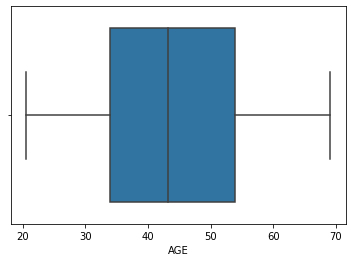

In [62]:
# for this we have to create group in this by pd.cut but before that we need to check the boxplot
# to identify the range and to check that there is any outlier or not
sns.boxplot(current_applications.AGE)

In [63]:
current_applications['AGE_GROUP']=pd.cut(current_applications.AGE , bins = [0,20,25,30,35,40,45,50,55,60,100],  labels=['0-20','20-25','25-30','30-35','35-40','40-45','45-50','50-55',
                                                                               '55-60','60 above'])

In [64]:
current_applications['AGE_GROUP'].value_counts()

35-40       42868
40-45       41406
30-35       39440
60 above    35579
45-50       35135
50-55       34942
55-60       33120
25-30       32862
20-25       12159
0-20            0
Name: AGE_GROUP, dtype: int64

In [65]:
current_applications[['AGE','AGE_GROUP']].head()

,AGE,AGE_GROUP
0,25.920548,25-30
1,45.931507,45-50
2,52.180822,50-55
3,52.068493,50-55
4,54.608219,50-55


In [66]:
current_applications['EMPLOYED_YEARS']= current_applications.DAYS_EMPLOYED/365
current_applications['EMPLOYED_YEARS'].sort_values(ascending=False)

127705    1000.665753
115938    1000.665753
115800    1000.665753
115794    1000.665753
115793    1000.665753
115791    1000.665753
115787    1000.665753
115784    1000.665753
115781    1000.665753
115779    1000.665753
115776    1000.665753
115761    1000.665753
115759    1000.665753
283776    1000.665753
283780    1000.665753
115709    1000.665753
115706    1000.665753
115700    1000.665753
115690    1000.665753
115683    1000.665753
115664    1000.665753
115807    1000.665753
115824    1000.665753
115830    1000.665753
283754    1000.665753
115931    1000.665753
115921    1000.665753
283747    1000.665753
115917    1000.665753
115915    1000.665753
115909    1000.665753
115907    1000.665753
115902    1000.665753
115887    1000.665753
115839    1000.665753
283755    1000.665753
115882    1000.665753
115880    1000.665753
115876    1000.665753
115874    1000.665753
115871    1000.665753
115868    1000.665753
283759    1000.665753
115663    1000.665753
115659    1000.665753
115658    

In [67]:
len(current_applications['EMPLOYED_YEARS'].unique())

12574

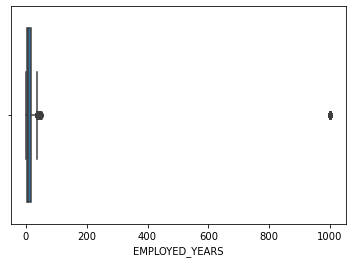

In [68]:
sns.boxplot(current_applications['EMPLOYED_YEARS'])
plt.show()

In [69]:

## after 32 there is a jump of 1000 so we are making bins till 30
current_applications['EMPLOYED_FOR_YEARS']=pd.cut(current_applications.AGE , bins = [0,5,10,15,20,25,30,100],  labels=['0-5','5-10','10-15','15-20','20-25','25-30','30 Above'])
    
current_applications['EMPLOYED_FOR_YEARS'].value_counts()                                                                                                                

30 Above    262490
25-30        32862
20-25        12159
0-5              0
5-10             0
10-15            0
15-20            0
Name: EMPLOYED_FOR_YEARS, dtype: int64

In [70]:
current_applications['EMPLOYED_FOR_YEARS'].value_counts(normalize=True)*100

30 Above    85.359548
25-30       10.686447
20-25        3.954005
0-5          0.000000
5-10         0.000000
10-15        0.000000
15-20        0.000000
Name: EMPLOYED_FOR_YEARS, dtype: float64

In [71]:
current_applications.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_3,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AGE,EMPLOYED_YEARS
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307509.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,306490.000000,306490.000000,306490.000000,306490.000000,307510.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,307511.000000,307511.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,16036.995067,67724.742149,4986.120328,2994.202373,2.152665,2.052463,2.031521,12.063419,0.015144,0.050769,0.040659,0.078173,0.230454,0.179555,1.422245,0.143421,1.405292,0.100049,962.858788,0.710023,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974,43.936973,185.547239
std,102790.175348,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,4363.988632,139443.751806,3522.886321,1509.450419,0.910682,0.509034,0.502737,3.265832,0.122126,0.219526,0.197499,0.268444,0.421124,0.383817,2.400989,0.446698,2.379803,0.362291,826.808487,0.453752,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295,11.956133,382.037676
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,7489.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,20.517808,0.000000
25%,189145.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,12413.000000,933.000000,2010.000000,1720.000000,2.000000,2.000000,2.000000,10.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,274.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,34.008219,2.556164
50%,278202.000000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,15750.000000,2219.000000,4504.000000,3254.000000,2.000000,2.000000,2.000000,12.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,757.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,43.150685,6.079452
75%,367142.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,19682.000000,5707.000000,7479.500000,4299.000000,3.000000,2.000000,2.000000,14.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,2.000000,0.000000,1570.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,53.923288,15.635616
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,25229.000000,365243.000000,24672.000000,7197.000000,20.000000,3.000000,3.000000,23.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,348.000000,34.000000,344.000000,24.000000,4292.000000,1.000000,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000,69.120548,1000.665753


#### AMT_INCOME_TOTAL ,AMT_CREDIT, AMT_GOODS_PRICE are very really high numbers
##### All there are consist same values so binning would be same

In [72]:
## convert them into bins by pd.cut so that we can ready them interms of Lakhs
## Instead of creating new columns we can overright the old columns

current_applications['AMT_INCOME_TOTAL'] =current_applications['AMT_INCOME_TOTAL']/100000
current_applications['AMT_INCOME_TOTAL'].value_counts()

1.350000       35750
1.125000       31019
1.575000       26556
1.800000       24719
0.900000       22483
2.250000       20698
2.025000       16341
0.675000       11147
2.700000       10827
0.810000        6001
3.150000        5862
2.475000        5344
1.260000        4668
3.600000        4115
1.215000        3848
0.990000        3633
2.925000        3418
1.035000        3330
0.765000        3146
1.440000        3123
1.710000        2647
4.500000        2435
1.170000        2390
0.540000        2319
0.720000        2187
1.665000        2053
0.450000        2043
1.080000        1946
3.375000        1790
0.945000        1747
1.620000        1702
1.890000        1691
4.050000        1660
0.855000        1514
1.485000        1486
2.160000        1406
1.305000        1256
0.585000        1182
0.630000        1145
1.935000        1061
1.530000        1012
2.115000         985
3.825000         966
1.395000         834
1.755000         800
5.400000         758
0.495000         738
2.340000     

In [73]:
### create in bins
current_applications['TOTAL_AMT_INCOME'] = pd.cut(current_applications['AMT_INCOME_TOTAL'], bins =[0,1,2,3,4,5,6,7,8,9,10,100],
                                                 labels=['0-1L','1L-2L', '2L-3L','3L-4L','4L-5L','5L-6L','6L-7L','7L-8L','8L-9L','9L-10L','10L Above'])
current_applications['TOTAL_AMT_INCOME'].value_counts()

1L-2L        155898
2L-3L         65176
0-1L          63698
3L-4L         14676
4L-5L          5361
5L-6L          1095
6L-7L           869
8L-9L           298
10L Above       247
7L-8L           162
9L-10L           28
Name: TOTAL_AMT_INCOME, dtype: int64

In [74]:
current_applications['AMT_CREDIT'] =current_applications['AMT_CREDIT']/100000
current_applications['AMT_CREDIT'].value_counts()

4.500000     9709
6.750000     8877
2.250000     8162
1.800000     7342
2.700000     7241
9.000000     6246
2.547000     4500
5.450400     4437
8.086500     4152
1.350000     3660
7.551900     3524
11.250000    3493
5.212800     3175
2.844000     3096
10.782000    2856
4.545000     2649
12.883500    2613
2.695500     2463
2.025000     2339
7.819200     2328
13.500000    2321
2.398500     2084
3.150000     2072
2.475000     2057
6.400800     2041
10.069200    1883
5.400000     1821
3.600000     1743
5.084955     1717
5.925600     1688
4.975200     1665
4.050000     1661
8.353800     1600
3.375000     1588
6.795000     1555
9.423000     1431
3.141000     1394
1.528200     1366
15.460200    1279
4.950000     1268
1.575000     1203
5.850000     1200
7.284600     1065
5.264910     1012
5.444910     1009
3.438000      939
12.230100     930
3.127680      929
2.472750      920
18.000000     900
8.140410      897
6.300000      895
4.904955      842
1.018800      841
2.636865      827
7.602255  

In [75]:
### create in bins
current_applications['TOTAL_AMT_CREDIT'] = pd.cut(current_applications['AMT_CREDIT'], bins =[0,1,2,3,4,5,6,7,8,9,10,100],
                                                 labels=['0-1L','1L-2L', '2L-3L','3L-4L','4L-5L','5L-6L','6L-7L','7L-8L','8L-9L','9L-10L','10L Above'])
current_applications['TOTAL_AMT_CREDIT'].value_counts()

2L-3L        54813
10L Above    49985
5L-6L        34232
4L-5L        32038
1L-2L        30140
3L-4L        26338
6L-7L        24049
8L-9L        21792
7L-8L        19193
9L-10L        8927
0-1L          6004
Name: TOTAL_AMT_CREDIT, dtype: int64

In [76]:
current_applications['AMT_GOODS_PRICE'] =current_applications['AMT_GOODS_PRICE']/100000
current_applications['AMT_GOODS_PRICE'].value_counts()

4.500000     26022
2.250000     25282
6.750000     24962
9.000000     15416
2.700000     11428
1.800000     10123
4.545000      9157
11.250000     9050
1.350000      8206
3.150000      5225
13.500000     5037
6.795000      4824
2.385000      4696
3.600000      4553
2.475000      4318
4.635000      3873
5.400000      3763
4.950000      3463
2.025000      3222
0.900000      3169
4.050000      2954
4.725000      2828
1.575000      2704
5.850000      2647
3.375000      2501
2.295000      2438
1.125000      2170
6.300000      2164
18.000000     2146
7.200000      1922
15.750000     1875
6.885000      1824
2.925000      1708
1.485000      1674
4.770000      1611
8.100000      1568
0.675000      1505
6.975000      1408
3.825000      1396
7.650000      1396
9.045000      1375
2.835000      1372
2.520000      1368
2.340000      1279
0.450000      1169
9.450000      1161
8.550000      1113
11.295000     1109
9.135000      1065
3.285000      1059
4.590000      1023
1.935000      1007
1.035000    

In [77]:
### create in bins
current_applications['TOTAL_AMT_GOODS_PRICE'] = pd.cut(current_applications['AMT_GOODS_PRICE'], bins =[0,1,2,3,4,5,6,7,8,9,10,100],
                                                 labels=['0-1L','1L-2L', '2L-3L','3L-4L','4L-5L','5L-6L','6L-7L','7L-8L','8L-9L','9L-10L','10L Above'])
current_applications['TOTAL_AMT_GOODS_PRICE'].value_counts()

2L-3L        62761
4L-5L        56973
6L-7L        40024
10L Above    34119
1L-2L        32956
8L-9L        21484
3L-4L        21219
5L-6L        13117
0-1L          8709
7L-8L         8110
9L-10L        7761
Name: TOTAL_AMT_GOODS_PRICE, dtype: int64

## Outliers

In [78]:
numerical_col = current_applications.select_dtypes(include=['int64','float64']).columns
numerical_col

Index(['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'CNT_FAM_MEMBERS',
       'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY',
       'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION',
       'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION',
       'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY',
       'LIVE_CITY_NOT_WORK_CITY', 'OBS_30_CNT_SOCIAL_CIRCLE',
       'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE',
       'DEF_60_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE', 'FLAG_DOCUMENT_3',
       'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY',
       'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON',
       'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR', 'AGE',
       'EMPLOYED_YEARS'],
      dtype='object')

In [79]:
len(numerical_col)

36

<AxesSubplot:>

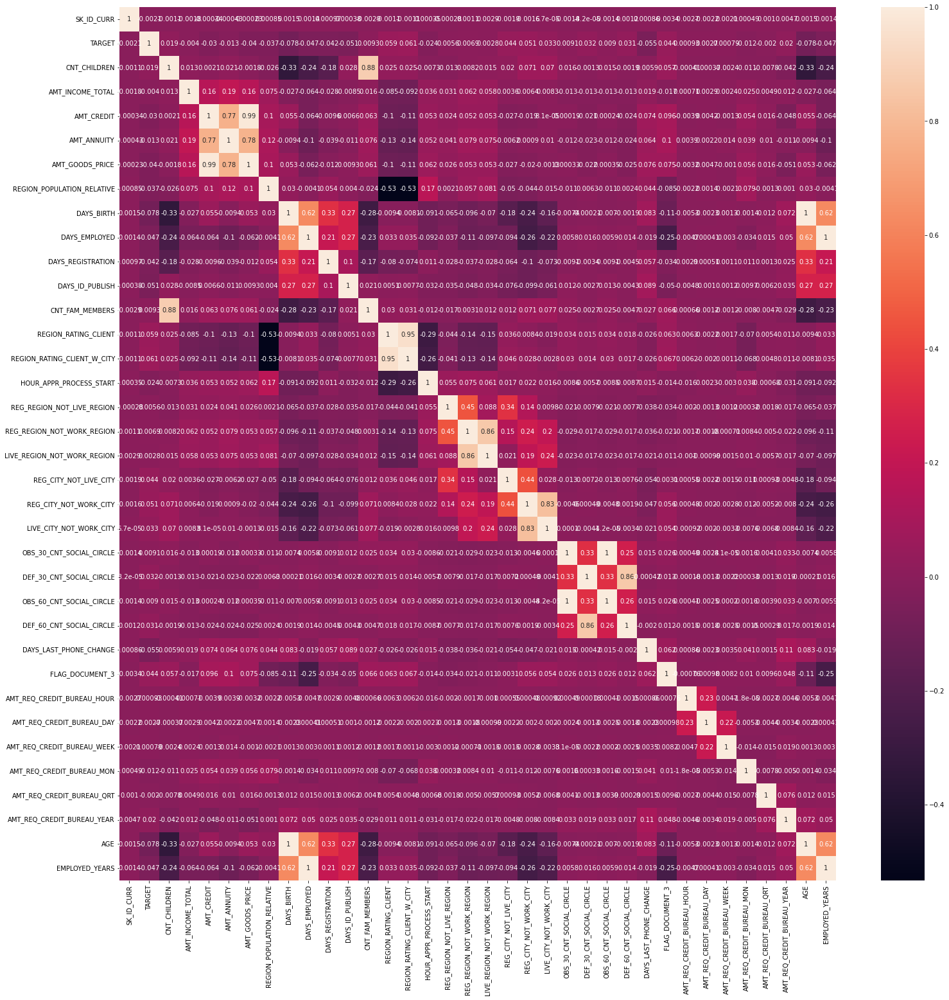

In [80]:
plt.figure(figsize=(25,25))
sns.heatmap(current_applications[numerical_col].corr(), annot=True)

In [81]:
boxplot_col= ["CNT_CHILDREN","AMT_INCOME_TOTAL", "AMT_CREDIT", "AMT_ANNUITY", "AMT_GOODS_PRICE",
               "DAYS_BIRTH", "DAYS_EMPLOYED", "DAYS_REGISTRATION",'AGE','EMPLOYED_YEARS']

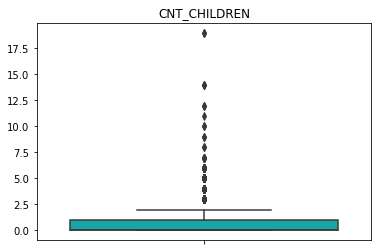

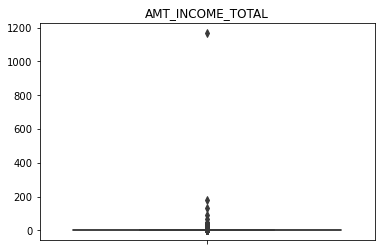

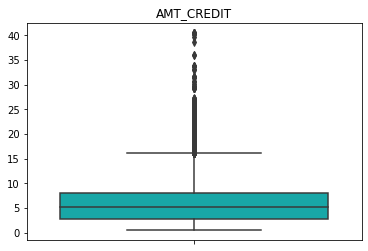

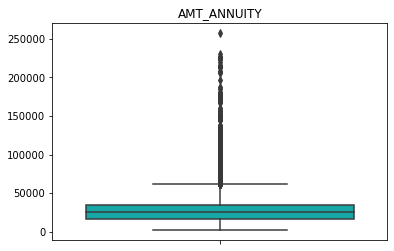

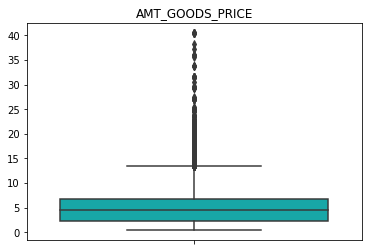

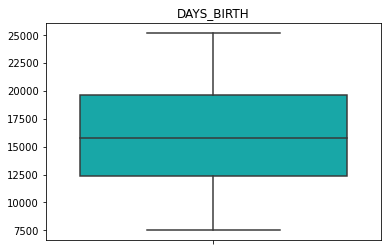

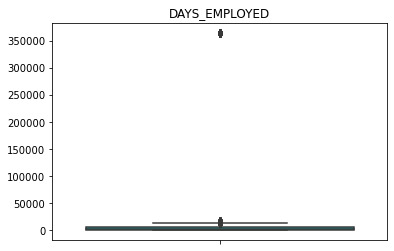

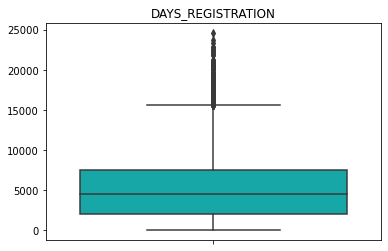

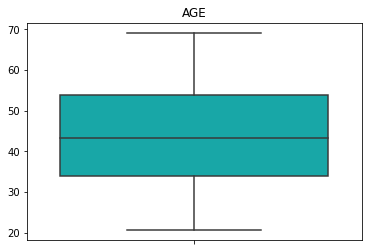

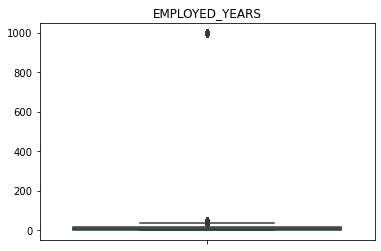

In [82]:
##Boxplot 
#plt.figure(figsize=[15,25])
for j,i in enumerate(boxplot_col):
    sns.boxplot(y=current_applications[i], orient='h', color='c')
    plt.title(i)
    plt.xlabel("")
    plt.ylabel("")
    plt.show()

#### Observation after outlier

"CNT_CHILDREN","AMT_CREDIT", "AMT_ANNUITY", "AMT_GOODS_PRICE", "DAYS_REGISTRATION"- Having some outliers - 

"DAYS_EMPLOYED",'EMPLOYED_YEARS' ,"AMT_INCOME_TOTAL"- having major outliers 

"AGE", DAYS_BIRTH - Having no outliers

In [83]:
col = current_applications.columns
col

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
       'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH',
       'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY', 'WEEKDAY_APPR_PROCESS_START',
       'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION',
       'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION',
       'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY',
       'LIVE_CITY_NOT_WORK_CITY', 'ORGANIZATION_TYPE',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE',
       'DAYS_LAST_PHONE_CHANGE', 'FLAG_DOCUMENT_3',
       'AMT

In [84]:
for feature in col:
    print(feature ," Unique values are " , len(current_applications[feature].unique()))

SK_ID_CURR  Unique values are  307511
TARGET  Unique values are  2
NAME_CONTRACT_TYPE  Unique values are  2
CODE_GENDER  Unique values are  3
FLAG_OWN_CAR  Unique values are  2
FLAG_OWN_REALTY  Unique values are  2
CNT_CHILDREN  Unique values are  15
AMT_INCOME_TOTAL  Unique values are  2548
AMT_CREDIT  Unique values are  5603
AMT_ANNUITY  Unique values are  13673
AMT_GOODS_PRICE  Unique values are  1003
NAME_TYPE_SUITE  Unique values are  8
NAME_INCOME_TYPE  Unique values are  8
NAME_EDUCATION_TYPE  Unique values are  5
NAME_FAMILY_STATUS  Unique values are  6
NAME_HOUSING_TYPE  Unique values are  6
REGION_POPULATION_RELATIVE  Unique values are  81
DAYS_BIRTH  Unique values are  17460
DAYS_EMPLOYED  Unique values are  12574
DAYS_REGISTRATION  Unique values are  15688
DAYS_ID_PUBLISH  Unique values are  6168
OCCUPATION_TYPE  Unique values are  19
CNT_FAM_MEMBERS  Unique values are  18
REGION_RATING_CLIENT  Unique values are  3
REGION_RATING_CLIENT_W_CITY  Unique values are  3
WEEKDAY_A

# DATASET 2 - Previous Data

## Data Cleaning for Data set 2

In [85]:
previous_applications.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [86]:
previous_applications.shape

(1670214, 37)

In [87]:
previous_applications.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 12  RATE_DOWN_PAYMENT            774370 non-nu

In [88]:
previous_applications.describe()

,SK_ID_PREV,SK_ID_CURR,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
count,1.670214e+06,1.670214e+06,1.297979e+06,1.670214e+06,1.670213e+06,7.743700e+05,1.284699e+06,1.670214e+06,1.670214e+06,774370.000000,5951.000000,5951.000000,1.670214e+06,1.670214e+06,1.297984e+06,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000
mean,1.923089e+06,2.783572e+05,1.595512e+04,1.752339e+05,1.961140e+05,6.697402e+03,2.278473e+05,1.248418e+01,9.964675e-01,0.079637,0.188357,0.773503,-8.806797e+02,3.139511e+02,1.605408e+01,342209.855039,13826.269337,33767.774054,76582.403064,81992.343838,0.332570
std,5.325980e+05,1.028148e+05,1.478214e+04,2.927798e+05,3.185746e+05,2.092150e+04,3.153966e+05,3.334028e+00,5.932963e-02,0.107823,0.087671,0.100879,7.790997e+02,7.127443e+03,1.456729e+01,88916.115834,72444.869708,106857.034789,149647.415123,153303.516729,0.471134
min,1.000001e+06,1.000010e+05,0.000000e+00,0.000000e+00,0.000000e+00,-9.000000e-01,0.000000e+00,0.000000e+00,0.000000e+00,-0.000015,0.034781,0.373150,-2.922000e+03,-1.000000e+00,0.000000e+00,-2922.000000,-2892.000000,-2801.000000,-2889.000000,-2874.000000,0.000000
25%,1.461857e+06,1.893290e+05,6.321780e+03,1.872000e+04,2.416050e+04,0.000000e+00,5.084100e+04,1.000000e+01,1.000000e+00,0.000000,0.160716,0.715645,-1.300000e+03,-1.000000e+00,6.000000e+00,365243.000000,-1628.000000,-1242.000000,-1314.000000,-1270.000000,0.000000
50%,1.923110e+06,2.787145e+05,1.125000e+04,7.104600e+04,8.054100e+04,1.638000e+03,1.123200e+05,1.200000e+01,1.000000e+00,0.051605,0.189122,0.835095,-5.810000e+02,3.000000e+00,1.200000e+01,365243.000000,-831.000000,-361.000000,-537.000000,-499.000000,0.000000
75%,2.384280e+06,3.675140e+05,2.065842e+04,1.803600e+05,2.164185e+05,7.740000e+03,2.340000e+05,1.500000e+01,1.000000e+00,0.108909,0.193330,0.852537,-2.800000e+02,8.200000e+01,2.400000e+01,365243.000000,-411.000000,129.000000,-74.000000,-44.000000,1.000000
max,2.845382e+06,4.562550e+05,4.180581e+05,6.905160e+06,6.905160e+06,3.060045e+06,6.905160e+06,2.300000e+01,1.000000e+00,1.000000,1.000000,1.000000,-1.000000e+00,4.000000e+06,8.400000e+01,365243.000000,365243.000000,365243.000000,365243.000000,365243.000000,1.000000


### Calculate Missing values

In [89]:
## Null values

previous_applications.isnull().sum()

SK_ID_PREV                           0
SK_ID_CURR                           0
NAME_CONTRACT_TYPE                   0
AMT_ANNUITY                     372235
AMT_APPLICATION                      0
AMT_CREDIT                           1
AMT_DOWN_PAYMENT                895844
AMT_GOODS_PRICE                 385515
WEEKDAY_APPR_PROCESS_START           0
HOUR_APPR_PROCESS_START              0
FLAG_LAST_APPL_PER_CONTRACT          0
NFLAG_LAST_APPL_IN_DAY               0
RATE_DOWN_PAYMENT               895844
RATE_INTEREST_PRIMARY          1664263
RATE_INTEREST_PRIVILEGED       1664263
NAME_CASH_LOAN_PURPOSE               0
NAME_CONTRACT_STATUS                 0
DAYS_DECISION                        0
NAME_PAYMENT_TYPE                    0
CODE_REJECT_REASON                   0
NAME_TYPE_SUITE                 820405
NAME_CLIENT_TYPE                     0
NAME_GOODS_CATEGORY                  0
NAME_PORTFOLIO                       0
NAME_PRODUCT_TYPE                    0
CHANNEL_TYPE             

In [90]:
## percentage of null values

previous_applications_null = previous_applications.isnull().sum()/previous_applications.shape[0]*100
previous_applications_null.sort_values(ascending = False)

RATE_INTEREST_PRIVILEGED       99.643698
RATE_INTEREST_PRIMARY          99.643698
AMT_DOWN_PAYMENT               53.636480
RATE_DOWN_PAYMENT              53.636480
NAME_TYPE_SUITE                49.119754
NFLAG_INSURED_ON_APPROVAL      40.298129
DAYS_TERMINATION               40.298129
DAYS_LAST_DUE                  40.298129
DAYS_LAST_DUE_1ST_VERSION      40.298129
DAYS_FIRST_DUE                 40.298129
DAYS_FIRST_DRAWING             40.298129
AMT_GOODS_PRICE                23.081773
AMT_ANNUITY                    22.286665
CNT_PAYMENT                    22.286366
PRODUCT_COMBINATION             0.020716
AMT_CREDIT                      0.000060
NAME_YIELD_GROUP                0.000000
NAME_PORTFOLIO                  0.000000
NAME_SELLER_INDUSTRY            0.000000
SELLERPLACE_AREA                0.000000
CHANNEL_TYPE                    0.000000
NAME_PRODUCT_TYPE               0.000000
SK_ID_PREV                      0.000000
NAME_GOODS_CATEGORY             0.000000
NAME_CLIENT_TYPE

### Drop columns above 50%

In [91]:
null_col_50 = previous_applications_null[previous_applications_null>50].index
null_col_50

Index(['AMT_DOWN_PAYMENT', 'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED'],
      dtype='object')

In [92]:
## Remove 4 columns because they are having above 50% null values
previous_applications.drop(null_col_50, axis=1 ,inplace=True)

In [93]:
previous_applications.shape

(1670214, 33)

In [94]:
null_col15 = previous_applications.isnull().sum()/previous_applications.shape[0]*100
null_col15

SK_ID_PREV                      0.000000
SK_ID_CURR                      0.000000
NAME_CONTRACT_TYPE              0.000000
AMT_ANNUITY                    22.286665
AMT_APPLICATION                 0.000000
AMT_CREDIT                      0.000060
AMT_GOODS_PRICE                23.081773
WEEKDAY_APPR_PROCESS_START      0.000000
HOUR_APPR_PROCESS_START         0.000000
FLAG_LAST_APPL_PER_CONTRACT     0.000000
NFLAG_LAST_APPL_IN_DAY          0.000000
NAME_CASH_LOAN_PURPOSE          0.000000
NAME_CONTRACT_STATUS            0.000000
DAYS_DECISION                   0.000000
NAME_PAYMENT_TYPE               0.000000
CODE_REJECT_REASON              0.000000
NAME_TYPE_SUITE                49.119754
NAME_CLIENT_TYPE                0.000000
NAME_GOODS_CATEGORY             0.000000
NAME_PORTFOLIO                  0.000000
NAME_PRODUCT_TYPE               0.000000
CHANNEL_TYPE                    0.000000
SELLERPLACE_AREA                0.000000
NAME_SELLER_INDUSTRY            0.000000
CNT_PAYMENT     

### Observation

NAME_TYPE_SUITE is not deleted because it's a important column for future analysis

In [95]:
null_col15[null_col15>15]

AMT_ANNUITY                  22.286665
AMT_GOODS_PRICE              23.081773
NAME_TYPE_SUITE              49.119754
CNT_PAYMENT                  22.286366
DAYS_FIRST_DRAWING           40.298129
DAYS_FIRST_DUE               40.298129
DAYS_LAST_DUE_1ST_VERSION    40.298129
DAYS_LAST_DUE                40.298129
DAYS_TERMINATION             40.298129
NFLAG_INSURED_ON_APPROVAL    40.298129
dtype: float64

In [96]:
previous_applications.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,17145.0,SATURDAY,15,Y,1,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,607500.0,THURSDAY,11,Y,1,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,112500.0,TUESDAY,11,Y,1,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,450000.0,MONDAY,7,Y,1,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,337500.0,THURSDAY,9,Y,1,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [97]:
previous_applications.describe()

,SK_ID_PREV,SK_ID_CURR,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
count,1.670214e+06,1.670214e+06,1.297979e+06,1.670214e+06,1.670213e+06,1.284699e+06,1.670214e+06,1.670214e+06,1.670214e+06,1.670214e+06,1.297984e+06,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000
mean,1.923089e+06,2.783572e+05,1.595512e+04,1.752339e+05,1.961140e+05,2.278473e+05,1.248418e+01,9.964675e-01,-8.806797e+02,3.139511e+02,1.605408e+01,342209.855039,13826.269337,33767.774054,76582.403064,81992.343838,0.332570
std,5.325980e+05,1.028148e+05,1.478214e+04,2.927798e+05,3.185746e+05,3.153966e+05,3.334028e+00,5.932963e-02,7.790997e+02,7.127443e+03,1.456729e+01,88916.115834,72444.869708,106857.034789,149647.415123,153303.516729,0.471134
min,1.000001e+06,1.000010e+05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,-2.922000e+03,-1.000000e+00,0.000000e+00,-2922.000000,-2892.000000,-2801.000000,-2889.000000,-2874.000000,0.000000
25%,1.461857e+06,1.893290e+05,6.321780e+03,1.872000e+04,2.416050e+04,5.084100e+04,1.000000e+01,1.000000e+00,-1.300000e+03,-1.000000e+00,6.000000e+00,365243.000000,-1628.000000,-1242.000000,-1314.000000,-1270.000000,0.000000
50%,1.923110e+06,2.787145e+05,1.125000e+04,7.104600e+04,8.054100e+04,1.123200e+05,1.200000e+01,1.000000e+00,-5.810000e+02,3.000000e+00,1.200000e+01,365243.000000,-831.000000,-361.000000,-537.000000,-499.000000,0.000000
75%,2.384280e+06,3.675140e+05,2.065842e+04,1.803600e+05,2.164185e+05,2.340000e+05,1.500000e+01,1.000000e+00,-2.800000e+02,8.200000e+01,2.400000e+01,365243.000000,-411.000000,129.000000,-74.000000,-44.000000,1.000000
max,2.845382e+06,4.562550e+05,4.180581e+05,6.905160e+06,6.905160e+06,6.905160e+06,2.300000e+01,1.000000e+00,-1.000000e+00,4.000000e+06,8.400000e+01,365243.000000,365243.000000,365243.000000,365243.000000,365243.000000,1.000000


In [98]:
previous_applications.NAME_TYPE_SUITE.value_counts()

Unaccompanied      508970
Family             213263
Spouse, partner     67069
Children            31566
Other_B             17624
Other_A              9077
Group of people      2240
Name: NAME_TYPE_SUITE, dtype: int64

### Suggestion/Observation

due to categorical behavour use 'unknown' to fill na 

In [99]:
### Fill majaor percentage of Null values


previous_applications.NAME_TYPE_SUITE = previous_applications.NAME_TYPE_SUITE.fillna('Unknown_relation')

In [100]:
previous_applications.NAME_TYPE_SUITE.value_counts()

Unknown_relation    820405
Unaccompanied       508970
Family              213263
Spouse, partner      67069
Children             31566
Other_B              17624
Other_A               9077
Group of people       2240
Name: NAME_TYPE_SUITE, dtype: int64

In [101]:
## converting negative values with positive
negative_col= ['DAYS_DECISION','DAYS_FIRST_DRAWING','DAYS_FIRST_DUE','DAYS_LAST_DUE_1ST_VERSION','DAYS_LAST_DUE','DAYS_TERMINATION']

In [102]:
previous_applications[negative_col] = abs(previous_applications[negative_col])
previous_applications[negative_col].describe()

,DAYS_DECISION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION
count,1.670214e+06,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000
mean,8.806797e+02,342340.056543,15949.224065,35163.363265,78152.730207,83505.775017
std,7.790997e+02,88413.495220,72007.270877,106405.950190,148833.342466,152484.418802
min,1.000000e+00,2.000000,2.000000,0.000000,2.000000,2.000000
25%,2.800000e+02,365243.000000,475.000000,257.000000,455.000000,447.000000
50%,5.810000e+02,365243.000000,921.000000,741.000000,1155.000000,1171.000000
75%,1.300000e+03,365243.000000,1825.000000,1735.000000,2418.000000,2501.000000
max,2.922000e+03,365243.000000,365243.000000,365243.000000,365243.000000,365243.000000


In [103]:
null_col15[null_col15>15]

AMT_ANNUITY                  22.286665
AMT_GOODS_PRICE              23.081773
NAME_TYPE_SUITE              49.119754
CNT_PAYMENT                  22.286366
DAYS_FIRST_DRAWING           40.298129
DAYS_FIRST_DUE               40.298129
DAYS_LAST_DUE_1ST_VERSION    40.298129
DAYS_LAST_DUE                40.298129
DAYS_TERMINATION             40.298129
NFLAG_INSURED_ON_APPROVAL    40.298129
dtype: float64

In [104]:
## Percentage is equal we can fill with 0 or let them NaN
check1= ['DAYS_FIRST_DUE', 'DAYS_TERMINATION', 'DAYS_FIRST_DRAWING', 'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE']

for i in check1:
    print(i , len(previous_applications[i].unique()))

DAYS_FIRST_DUE 2893
DAYS_TERMINATION 2831
DAYS_FIRST_DRAWING 2839
DAYS_LAST_DUE_1ST_VERSION 2804
DAYS_LAST_DUE 2874


#### observation
A missing value exists in the columns 'DAYS_FIRST_DUE', 'DAYS_TERMINATION', 'DAYS_FIRST_DRAWING', 'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE'. These columns count days, so they keep null values as well.

#### Null value tretment of AMT_ANNUITY and AMT_GOODS_PRICE

In [105]:
## Null values of AMT_ANNUITY
print("AMT_ANNUITY NULL Values:" ,previous_applications['AMT_ANNUITY'].isnull().sum())

AMT_ANNUITY NULL Values: 372235


<AxesSubplot:xlabel='AMT_ANNUITY', ylabel='Density'>

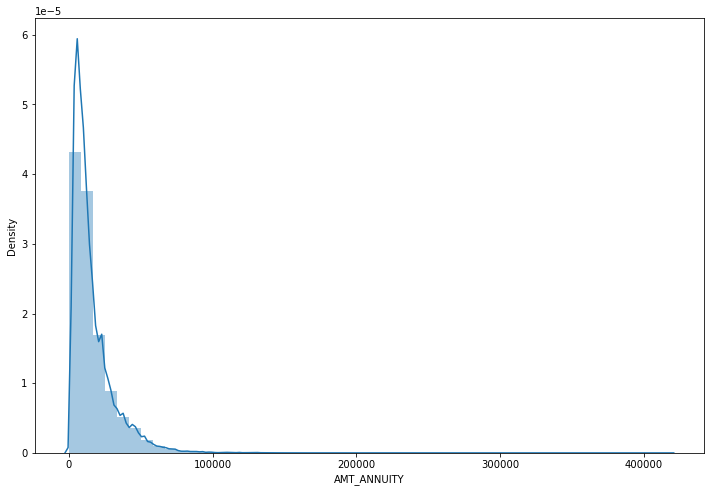

In [106]:
plt.figure(figsize=(12,8))
sns.distplot(previous_applications['AMT_ANNUITY'])

In [107]:
print(previous_applications['AMT_ANNUITY'].median())
print(previous_applications['AMT_ANNUITY'].mean())
print(previous_applications['AMT_ANNUITY'].mode())

11250.0
15955.120659450406
0    2250.0
Name: AMT_ANNUITY, dtype: float64


In [108]:
## fill null values with median
previous_applications['AMT_ANNUITY'].fillna(previous_applications['AMT_ANNUITY'].median(),inplace=True)

In [109]:
previous_applications['AMT_ANNUITY'].isnull().sum()

0

In [110]:
## Null values of AMT_GOODS_PRICE
print("AMT_GOODS_PRICE Values:" ,previous_applications['AMT_GOODS_PRICE'].isnull().sum())

AMT_GOODS_PRICE Values: 385515


<AxesSubplot:xlabel='AMT_GOODS_PRICE', ylabel='Density'>

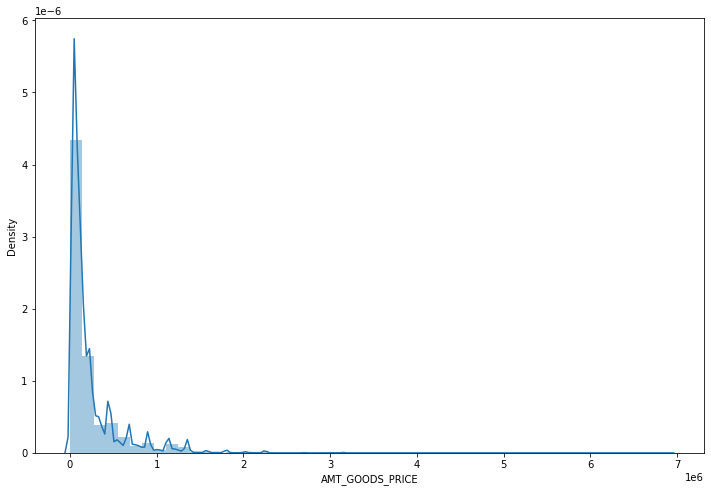

In [111]:
plt.figure(figsize=(12,8))
sns.distplot(previous_applications.AMT_GOODS_PRICE)

In [112]:
#### observation there are so many spike

print(previous_applications['AMT_GOODS_PRICE'].median())
print(previous_applications['AMT_GOODS_PRICE'].mean())
print(previous_applications['AMT_GOODS_PRICE'].mode())

112320.0
227847.27928334344
0    45000.0
Name: AMT_GOODS_PRICE, dtype: float64


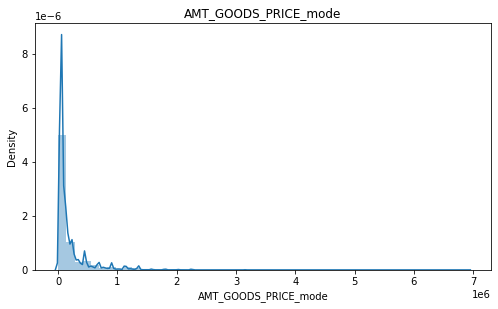

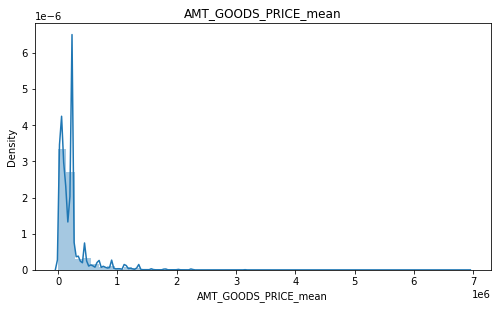

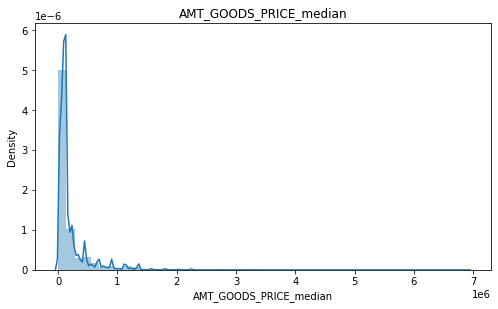

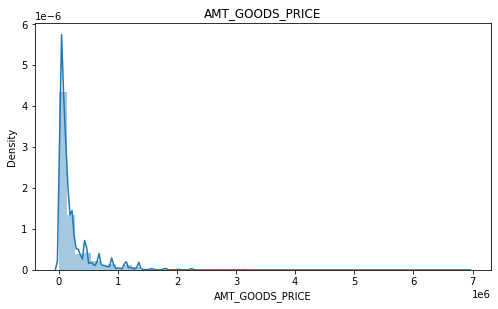

In [113]:
### There is huge difference in mean, median and mode

##we should plot bot three method and see what to be the fillna method

data = previous_applications.copy()

data['AMT_GOODS_PRICE_mode']= data['AMT_GOODS_PRICE'].fillna(data['AMT_GOODS_PRICE'].mode()[0])
data['AMT_GOODS_PRICE_mean']= data['AMT_GOODS_PRICE'].fillna(data['AMT_GOODS_PRICE'].mean())
data['AMT_GOODS_PRICE_median']= data['AMT_GOODS_PRICE'].fillna(data['AMT_GOODS_PRICE'].median())

to_check = ['AMT_GOODS_PRICE_mode','AMT_GOODS_PRICE_mean','AMT_GOODS_PRICE_median','AMT_GOODS_PRICE']

#plt.figure(figsize=(18,10))
for i, feature in enumerate(to_check):
    plt.figure(figsize=(18,10))
    plt.subplot(2,2,i+1)
    sns.distplot(data[feature])
    plt.title(feature)
    plt.show()

#### Observation
We can use median to fill values

In [114]:
data.head()



,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL,AMT_GOODS_PRICE_mode,AMT_GOODS_PRICE_mean,AMT_GOODS_PRICE_median
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,17145.0,SATURDAY,15,Y,1,XAP,Approved,73,Cash through the bank,XAP,Unknown_relation,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,42.0,300.0,42.0,37.0,0.0,17145.0,17145.0,17145.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,607500.0,THURSDAY,11,Y,1,XNA,Approved,164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,134.0,916.0,365243.0,365243.0,1.0,607500.0,607500.0,607500.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,112500.0,TUESDAY,11,Y,1,XNA,Approved,301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,271.0,59.0,365243.0,365243.0,1.0,112500.0,112500.0,112500.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,450000.0,MONDAY,7,Y,1,XNA,Approved,512,Cash through the bank,XAP,Unknown_relation,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,482.0,152.0,182.0,177.0,1.0,450000.0,450000.0,450000.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,337500.0,THURSDAY,9,Y,1,Repairs,Refused,781,Cash through the bank,HC,Unknown_relation,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN,337500.0,337500.0,337500.0


In [115]:
##median is performing very well so we go with median

previous_applications.AMT_GOODS_PRICE.fillna(previous_applications.AMT_GOODS_PRICE.median(), inplace=True)
previous_applications.AMT_GOODS_PRICE.isnull().sum()

0

In [116]:
data = previous_applications.copy()

In [117]:
CNT_Contract = data.groupby(by='CNT_PAYMENT').NAME_CONTRACT_STATUS.value_counts()
CNT_Contract

CNT_PAYMENT  NAME_CONTRACT_STATUS
0.0          Approved                 97771
             Refused                  46739
             Canceled                   473
             Unused offer                 2
3.0          Approved                  1029
             Refused                     71
4.0          Approved                 24911
             Refused                   1994
             Unused offer                18
             Canceled                     1
5.0          Approved                  3628
             Refused                    325
             Canceled                     4
6.0          Approved                173591
             Refused                  16604
             Canceled                   215
             Unused offer                51
7.0          Approved                  1284
             Refused                    150
8.0          Approved                 27631
             Refused                   2708
             Canceled                     

### Hint
Not replacing NAN values with mean or median but replacing them will zero

In [118]:
## we have zero=0 as in filled we can impute zero in place of NAN values in CNT_PAYMENT

previous_applications['CNT_PAYMENT'].fillna(0, inplace=True)


In [119]:
previous_applications['CNT_PAYMENT'].isnull().sum()

0

In [120]:
previous_applications.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,17145.0,SATURDAY,15,Y,1,XAP,Approved,73,Cash through the bank,XAP,Unknown_relation,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,42.0,300.0,42.0,37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,607500.0,THURSDAY,11,Y,1,XNA,Approved,164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,112500.0,TUESDAY,11,Y,1,XNA,Approved,301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,450000.0,MONDAY,7,Y,1,XNA,Approved,512,Cash through the bank,XAP,Unknown_relation,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,482.0,152.0,182.0,177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,337500.0,THURSDAY,9,Y,1,Repairs,Refused,781,Cash through the bank,HC,Unknown_relation,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [121]:
previous_applications.NAME_CONTRACT_STATUS.value_counts()

Approved        1036781
Canceled         316319
Refused          290678
Unused offer      26436
Name: NAME_CONTRACT_STATUS, dtype: int64

## Outliers

In [122]:
previous_applications.describe()

,SK_ID_PREV,SK_ID_CURR,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
count,1.670214e+06,1.670214e+06,1.670214e+06,1.670214e+06,1.670213e+06,1.670214e+06,1.670214e+06,1.670214e+06,1.670214e+06,1.670214e+06,1.670214e+06,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000
mean,1.923089e+06,2.783572e+05,1.490651e+04,1.752339e+05,1.961140e+05,2.011815e+05,1.248418e+01,9.964675e-01,8.806797e+02,3.139511e+02,1.247621e+01,342340.056543,15949.224065,35163.363265,78152.730207,83505.775017,0.332570
std,5.325980e+05,1.028148e+05,1.317751e+04,2.927798e+05,3.185746e+05,2.808629e+05,3.334028e+00,5.932963e-02,7.790997e+02,7.127443e+03,1.447588e+01,88413.495220,72007.270877,106405.950190,148833.342466,152484.418802,0.471134
min,1.000001e+06,1.000010e+05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,-1.000000e+00,0.000000e+00,2.000000,2.000000,0.000000,2.000000,2.000000,0.000000
25%,1.461857e+06,1.893290e+05,7.547096e+03,1.872000e+04,2.416050e+04,6.750000e+04,1.000000e+01,1.000000e+00,2.800000e+02,-1.000000e+00,0.000000e+00,365243.000000,475.000000,257.000000,455.000000,447.000000,0.000000
50%,1.923110e+06,2.787145e+05,1.125000e+04,7.104600e+04,8.054100e+04,1.123200e+05,1.200000e+01,1.000000e+00,5.810000e+02,3.000000e+00,1.000000e+01,365243.000000,921.000000,741.000000,1155.000000,1171.000000,0.000000
75%,2.384280e+06,3.675140e+05,1.682403e+04,1.803600e+05,2.164185e+05,1.804050e+05,1.500000e+01,1.000000e+00,1.300000e+03,8.200000e+01,1.600000e+01,365243.000000,1825.000000,1735.000000,2418.000000,2501.000000,1.000000
max,2.845382e+06,4.562550e+05,4.180581e+05,6.905160e+06,6.905160e+06,6.905160e+06,2.300000e+01,1.000000e+00,2.922000e+03,4.000000e+06,8.400000e+01,365243.000000,365243.000000,365243.000000,365243.000000,365243.000000,1.000000


### Observation 
easiest way to find outliers is see the difference of max and 75% percentile with each other 

In [123]:
#### Observation - easiest way to find outliers is see the difference of max and 75% percentile with each other 

['AMT_APPLICATION','AMT_CREDIT','AMT_GOODS_PRICE','OUR_APPR_PROCESS_START','SELLERPLACE_AREA','DAYS_FIRST_DUE','DAYS_LAST_DUE_1ST_VERSION',
'DAYS_TERMINATION','DAYS_DECISION','CNT_PAYMENT']

['AMT_APPLICATION',
 'AMT_CREDIT',
 'AMT_GOODS_PRICE',
 'OUR_APPR_PROCESS_START',
 'SELLERPLACE_AREA',
 'DAYS_FIRST_DUE',
 'DAYS_LAST_DUE_1ST_VERSION',
 'DAYS_TERMINATION',
 'DAYS_DECISION',
 'CNT_PAYMENT']

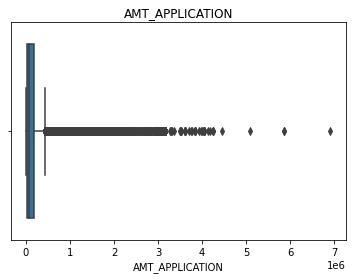

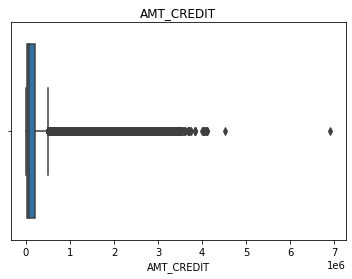

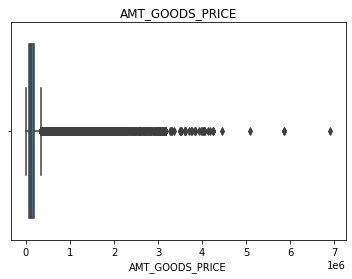

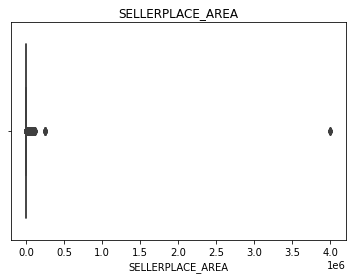

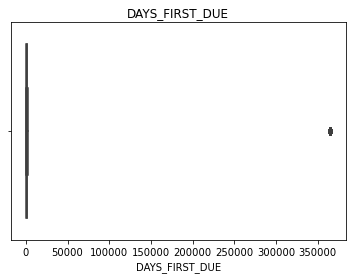

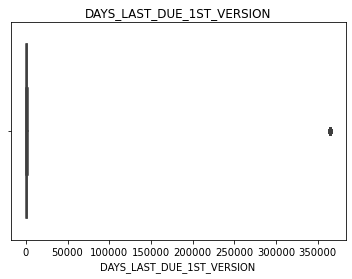

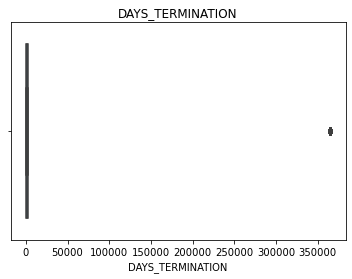

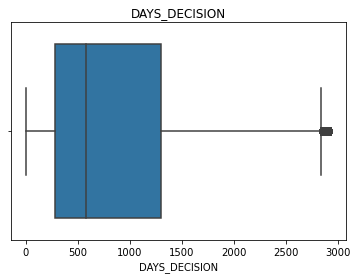

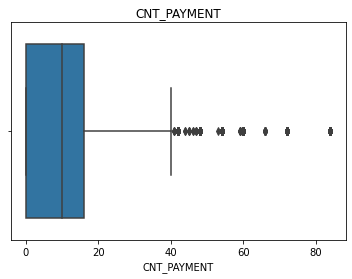

In [124]:
outliers = ['AMT_APPLICATION','AMT_CREDIT','AMT_GOODS_PRICE','SELLERPLACE_AREA','DAYS_FIRST_DUE','DAYS_LAST_DUE_1ST_VERSION',
'DAYS_TERMINATION','DAYS_DECISION','CNT_PAYMENT']

for i,features in enumerate (outliers):
    #plt.subplot(4,2,i+1)
    #plt.figure(figsize=(12,8))
    sns.boxplot(previous_applications[features])
    plt.title(features)
    plt.show()

### Observation - 
CNT_PAYMENT,AMT_APPLICATION - Few Outliers

DAYS_DECISION - No outliers

AMT_ANNUITY, AMT_APPLICATION, AMT_CREDIT, AMT_GOODS_PRICE, SELLERPLACE_AREA, DAYS_FIRST_DUE,
DAYS_FIRST_DUE_1ST_VERSION,DAYS_TERMINATION - Major Outliers

In [125]:
previous_applications.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,17145.0,SATURDAY,15,Y,1,XAP,Approved,73,Cash through the bank,XAP,Unknown_relation,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,42.0,300.0,42.0,37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,607500.0,THURSDAY,11,Y,1,XNA,Approved,164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,112500.0,TUESDAY,11,Y,1,XNA,Approved,301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,450000.0,MONDAY,7,Y,1,XNA,Approved,512,Cash through the bank,XAP,Unknown_relation,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,482.0,152.0,182.0,177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,337500.0,THURSDAY,9,Y,1,Repairs,Refused,781,Cash through the bank,HC,Unknown_relation,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [126]:
previous_applications.isnull().sum()

SK_ID_PREV                          0
SK_ID_CURR                          0
NAME_CONTRACT_TYPE                  0
AMT_ANNUITY                         0
AMT_APPLICATION                     0
AMT_CREDIT                          1
AMT_GOODS_PRICE                     0
WEEKDAY_APPR_PROCESS_START          0
HOUR_APPR_PROCESS_START             0
FLAG_LAST_APPL_PER_CONTRACT         0
NFLAG_LAST_APPL_IN_DAY              0
NAME_CASH_LOAN_PURPOSE              0
NAME_CONTRACT_STATUS                0
DAYS_DECISION                       0
NAME_PAYMENT_TYPE                   0
CODE_REJECT_REASON                  0
NAME_TYPE_SUITE                     0
NAME_CLIENT_TYPE                    0
NAME_GOODS_CATEGORY                 0
NAME_PORTFOLIO                      0
NAME_PRODUCT_TYPE                   0
CHANNEL_TYPE                        0
SELLERPLACE_AREA                    0
NAME_SELLER_INDUSTRY                0
CNT_PAYMENT                         0
NAME_YIELD_GROUP                    0
PRODUCT_COMB

In [127]:
## PRODUCT_COMBINATION

previous_applications.PRODUCT_COMBINATION.value_counts()

Cash                              285990
POS household with interest       263622
POS mobile with interest          220670
Cash X-Sell: middle               143883
Cash X-Sell: low                  130248
Card Street                       112582
POS industry with interest         98833
POS household without interest     82908
Card X-Sell                        80582
Cash Street: high                  59639
Cash X-Sell: high                  59301
Cash Street: middle                34658
Cash Street: low                   33834
POS mobile without interest        24082
POS other with interest            23879
POS industry without interest      12602
POS others without interest         2555
Name: PRODUCT_COMBINATION, dtype: int64

In [128]:
previous_applications.PRODUCT_COMBINATION.mode()[0]

'Cash'

## Suggestion 
fill na with Mode

previous_applications.PRODUCT_COMBINATION.fillna(previous_applications.PRODUCT_COMBINATION.mode()[0],inplace=True)

In [129]:
previous_applications.PRODUCT_COMBINATION.isnull().sum()

346

## Plots and Analysis

In [130]:
current_applications.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_3,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AGE,AGE_GROUP,EMPLOYED_YEARS,EMPLOYED_FOR_YEARS,TOTAL_AMT_INCOME,TOTAL_AMT_CREDIT,TOTAL_AMT_GOODS_PRICE
0,100002,1,Cash loans,M,N,Y,0,2.025,4.065975,24700.5,3.510,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,9461,637,3648.0,2120,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,2.0,2.0,2.0,2.0,1134.0,1,0.0,0.0,0.0,0.0,0.0,1.0,25.920548,25-30,1.745205,25-30,2L-3L,4L-5L,3L-4L
1,100003,0,Cash loans,F,N,N,0,2.700,12.935025,35698.5,11.295,Family,State servant,Higher education,Married,House / apartment,0.003541,16765,1188,1186.0,291,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,1.0,0.0,1.0,0.0,828.0,1,0.0,0.0,0.0,0.0,0.0,0.0,45.931507,45-50,3.254795,30 Above,2L-3L,10L Above,10L Above
2,100004,0,Revolving loans,M,Y,Y,0,0.675,1.350000,6750.0,1.350,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,19046,225,4260.0,2531,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.0,0.0,0.0,0.0,815.0,0,0.0,0.0,0.0,0.0,0.0,0.0,52.180822,50-55,0.616438,30 Above,0-1L,1L-2L,1L-2L
3,100006,0,Cash loans,F,N,Y,0,1.350,3.126825,29686.5,2.970,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,19005,3039,9833.0,2437,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,2.0,0.0,2.0,0.0,617.0,1,NaN,NaN,NaN,NaN,NaN,NaN,52.068493,50-55,8.326027,30 Above,1L-2L,3L-4L,2L-3L
4,100007,0,Cash loans,M,N,Y,0,1.215,5.130000,21865.5,5.130,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,19932,3038,4311.0,3458,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.0,0.0,0.0,0.0,1106.0,0,0.0,0.0,0.0,0.0,0.0,0.0,54.608219,50-55,8.323288,30 Above,1L-2L,5L-6L,5L-6L


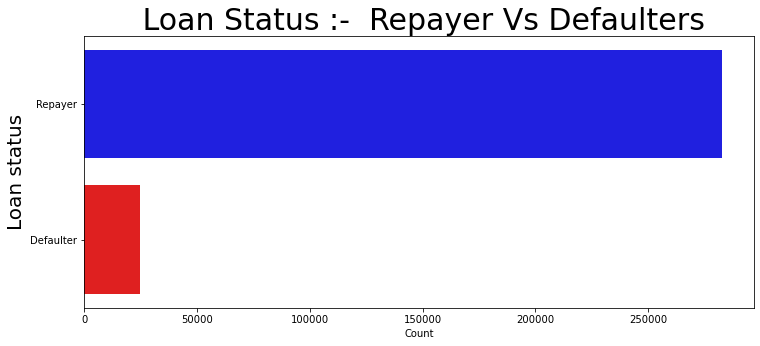

In [131]:
plt.figure(figsize=(12,5))
sns.barplot(x=current_applications.TARGET.value_counts(), y= ['Repayer','Defaulter'], palette=['b','r'])
plt.ylabel('Loan status', fontdict={'fontsize':20})
plt.xlabel('Count')
plt.title (" Loan Status :-  Repayer Vs Defaulters", fontdict={'fontsize':30})
plt.show()


In [132]:
## current_applications

current_applications.TARGET.value_counts()

0    282686
1     24825
Name: TARGET, dtype: int64

In [133]:
## Loan status in Percentage
np.round(current_applications.TARGET.value_counts()/current_applications.TARGET.shape[0]*100,2)

0    91.93
1     8.07
Name: TARGET, dtype: float64

In [134]:
print ("Imbalance percentage :", np.round(current_applications.TARGET.value_counts()[0]/current_applications.TARGET.shape[0]*100,2)/np.round(current_applications.TARGET.value_counts()[1]/current_applications.TARGET.shape[0]*100,2))

Imbalance percentage : 11.391573729863692


#### Observation
11% implace with dataset

### Code_Gender

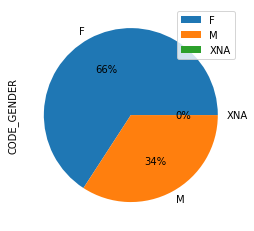

In [135]:
## CODE_GENDER
current_applications['CODE_GENDER'].value_counts().plot.pie(autopct='%1.0f%%')
plt.legend()
plt.show()

In [136]:
current_cat_val = current_applications.select_dtypes(include=['O']).columns
current_cat_val

Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
       'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE'],
      dtype='object')

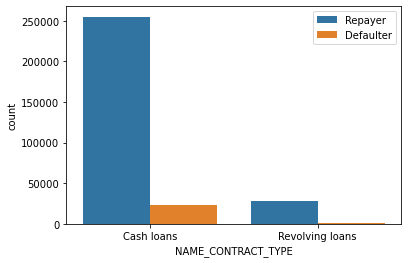

In [137]:
sns.countplot(data= current_applications, x='NAME_CONTRACT_TYPE' , hue = 'TARGET')
plt.legend({"Repayer":0,"Defaulter":1})
plt.show()

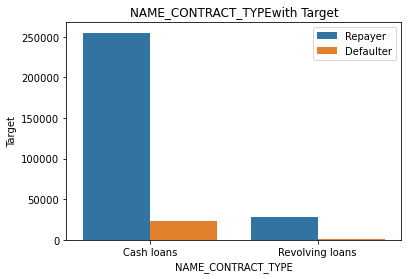

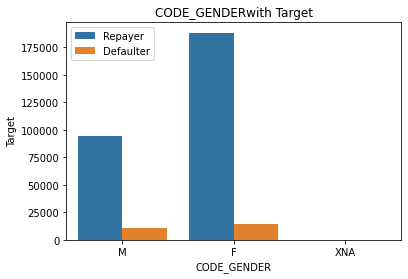

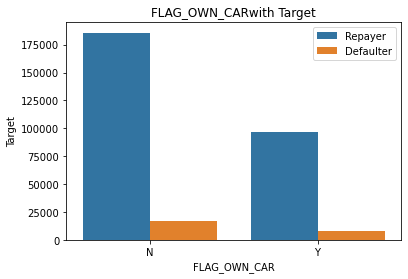

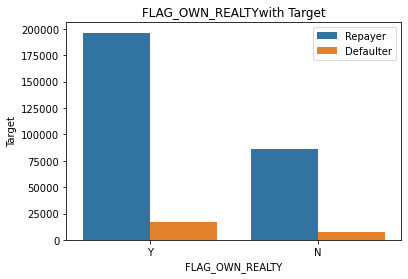

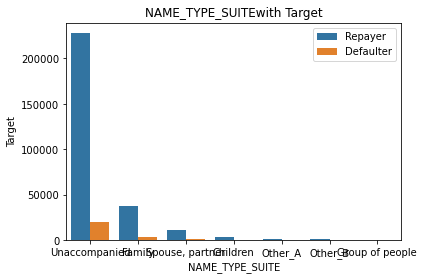

...

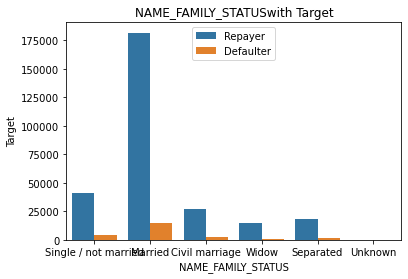

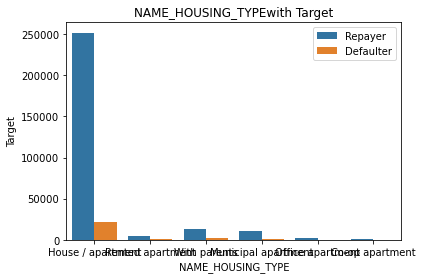

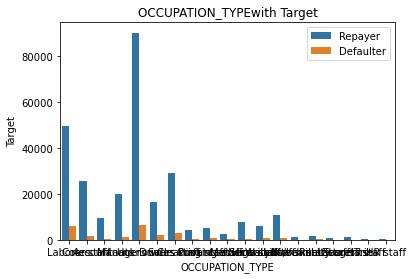

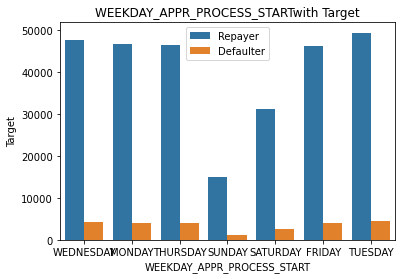

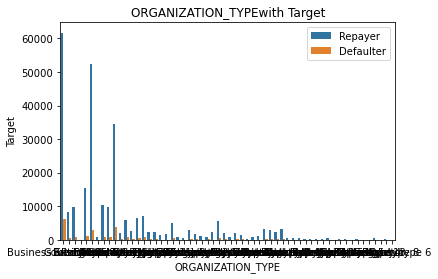

In [138]:
#plt.figure(figsize=(20,15))
for i,feature in enumerate(current_cat_val):
    #plt.subplot(4,3,i+1)
    sns.countplot(data= current_applications, x=feature , hue = 'TARGET')
    plt.xlabel(feature)
    plt.ylabel('Target')
    plt.legend({"Repayer":0,'Defaulter':1})
    plt.title(feature +'with Target')
    plt.show()

### MY_chart_Function

#### Splitting Data

In [139]:
new_df = current_applications.copy()
repayer_df= new_df[new_df['TARGET']==0]
repayer_df.shape

(282686, 53)

In [140]:
new_df = current_applications.copy()
defaulter_df= new_df[new_df['TARGET']==1]
defaulter_df.shape

(24825, 53)

In [141]:
sns.set(style= 'white')

In [142]:
def my_chart_countplot2(feature,y,fig):
    #plt.figure(figsize=fig)
               
    #sns.countplot(data= current_applications, x=feature , hue = y)
    #plt.xlabel(feature, fontdict={'fontsize':15})
    #plt.ylabel('Count', fontdict={'fontsize':15})
    #plt.legend({"Repayer":0,'Defaulter':1})
    #plt.title(feature +' with Target',fontdict={'fontsize':20})
    #plt.show()
    
    
    plt.figure(figsize=fig)
    plt.subplot(1,2,1)
    sns.countplot(data= current_applications, x=feature , hue = y)
    plt.xlabel(feature, fontdict={'fontsize':15})
    plt.ylabel('Count', fontdict={'fontsize':15})
    plt.yscale('log')
    plt.legend({"Repayer":0,'Defaulter':1})
    plt.title(feature +' with Target',fontdict={'fontsize':18})
    plt.xticks(rotation=45, ha='right')

    plt.subplot(1,2,2)
    sns.barplot(current_applications[feature],current_applications[y], color='r')
    plt.xlabel(feature, fontdict={'fontsize':15})
    plt.ylabel('Percent', fontdict={'fontsize':15})
    # plt.legend({"Repayer":0,'Defaulter':1})
    plt.title(feature +'  Defeaulter % with Target',fontdict={'fontsize':18})
    plt.xticks(rotation=45, ha='right')
    

    plt.show()
    
    

In [143]:
def univar(feature,y1,fig):
    
    new_df = current_applications.copy()
    repayer_df= new_df[new_df['TARGET']==0]
    defaulter_df= new_df[new_df['TARGET']==1]
    
    plt.figure(figsize=fig)
    plt.subplot(1,2,1)
    
    repayer_df[feature].value_counts().plot.bar(color='b')
    plt.xlabel(feature, fontdict={'fontsize':15})
    plt.ylabel('Count', fontdict={'fontsize':15})
    #plt.yscale('log')
    plt.legend({"Repayer":0})
    plt.title('Repayer '+ feature +' with Target',fontdict={'fontsize':18})
    plt.xticks(rotation=45, ha='right')
    
    plt.subplot(1,2,2)
    
    defaulter_df[feature].value_counts().plot.bar(color='r')
    #sns.countplot(data= defaulter_df, x=feature , hue = y1)
    plt.xlabel(feature, fontdict={'fontsize':15})
    plt.ylabel('Count', fontdict={'fontsize':15})
    #plt.yscale('log')
    plt.legend({"Defaulter":1})
    plt.title('Defaulters '+ feature +' with Target',fontdict={'fontsize':18})
    plt.xticks(rotation=45, ha='right')
    plt.show()
    
    df = current_applications.copy()
    temp_df1 = df.groupby(feature)[y1].value_counts(normalize=True)
    temp_df1 = temp_df1.mul(100)
    
    return temp_df1

In [144]:
def univar1(feature,y1,fig):
    
    new_df = current_applications.copy()
    repayer_df= new_df[new_df['TARGET']==0]
    defaulter_df= new_df[new_df['TARGET']==1]
    
    plt.figure(figsize=fig)
    plt.subplot(1,2,1)
    
    repayer_df[feature].value_counts().plot.bar(color='b')
    plt.xlabel(feature, fontdict={'fontsize':15})
    plt.ylabel('Count', fontdict={'fontsize':15})
    #plt.yscale('log')
    plt.legend({"Repayer":0})
    plt.title('Repayer '+ feature +' with Target',fontdict={'fontsize':18})
    plt.xticks(rotation=45, ha='right')
    
    plt.subplot(1,2,2)
    
    defaulter_df[feature].value_counts().plot.bar(color='r')
    #sns.countplot(data= defaulter_df, x=feature , hue = y1)
    plt.xlabel(feature, fontdict={'fontsize':15})
    plt.ylabel('Count', fontdict={'fontsize':15})
    #plt.yscale('log')
    plt.legend({"Defaulter":1})
    plt.title('Defaulters '+ feature +' with Target',fontdict={'fontsize':18})
    plt.xticks(rotation=45, ha='right')
    plt.show()
    

In [145]:
def my_chart_countplot3(feature,y,fig):
    #plt.figure(figsize=fig)
               
    #sns.countplot(data= current_applications, x=feature , hue = y)
    #plt.xlabel(feature, fontdict={'fontsize':15})
    #plt.ylabel('Count', fontdict={'fontsize':15})
    #plt.legend({"Repayer":0,'Defaulter':1})
    #plt.title(feature +' with Target',fontdict={'fontsize':20})
    #plt.show()
    
    plt.figure(figsize=fig)
    plt.subplot(1,2,1)
    sns.countplot(data= current_applications, x=feature , hue = y)
    plt.xlabel(feature, fontdict={'fontsize':15})
    plt.ylabel('Count', fontdict={'fontsize':15})
    plt.yscale('log')
    plt.legend({"Repayer":0,'Defaulter':1})
    plt.title(feature +' with Target',fontdict={'fontsize':18})
    plt.xticks(rotation=45, ha='right')

    plt.subplot(1,2,2)
    sns.barplot(current_applications[feature],current_applications[y], color='r')
    plt.xlabel(feature, fontdict={'fontsize':15})
    plt.ylabel('Percent', fontdict={'fontsize':15})
    # plt.legend({"Repayer":0,'Defaulter':1})
    plt.title(feature +'  Defeaulter % with Target',fontdict={'fontsize':18})
    plt.xticks(rotation=45, ha='right')

    plt.show()
    
    

In [146]:
['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
       'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE']

['NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 'ORGANIZATION_TYPE']

## Univariate Analysis Plot

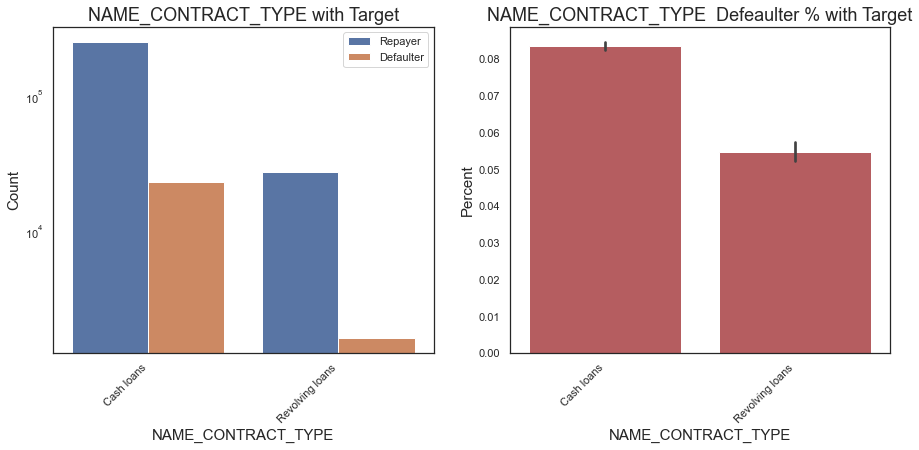

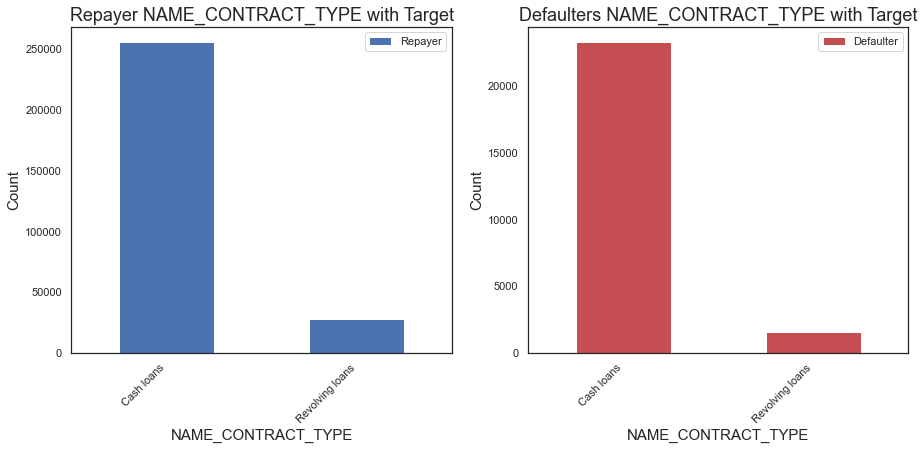

NAME_CONTRACT_TYPE  TARGET
Cash loans          0         91.654087
                    1          8.345913
Revolving loans     0         94.521671
                    1          5.478329
Name: TARGET, dtype: float64

In [147]:
# NAME_Contract_TYPE VS TARGET

my_chart_countplot2('NAME_CONTRACT_TYPE', 'TARGET',(15,6))

univar('NAME_CONTRACT_TYPE', 'TARGET',(15,6))

### Observation 
CAsh Loans are having more repayers

Defaulter percentage in cash loan and Revolving loan is 8.3% and 5.5%

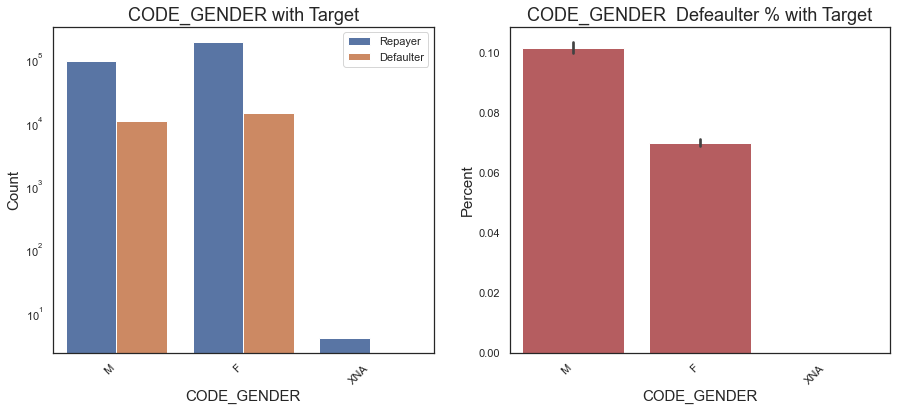

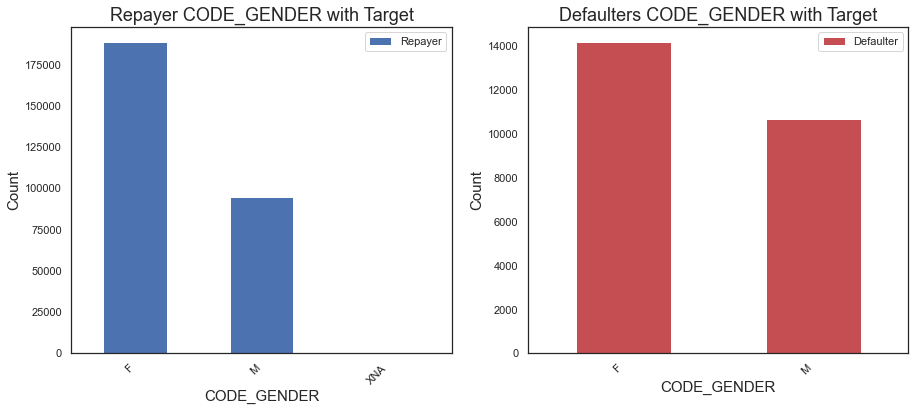

CODE_GENDER  TARGET
F            0          93.000672
             1           6.999328
M            0          89.858080
             1          10.141920
XNA          0         100.000000
Name: TARGET, dtype: float64

In [148]:
my_chart_countplot2('CODE_GENDER','TARGET',(15,6))
univar('CODE_GENDER','TARGET',(15,6))



### observation


1. Males are more defaulters than Females in terms of percentage that is not a good sign
2. Defaulter - males are 10% and females are 6% from applications
3. females are more good Repayers

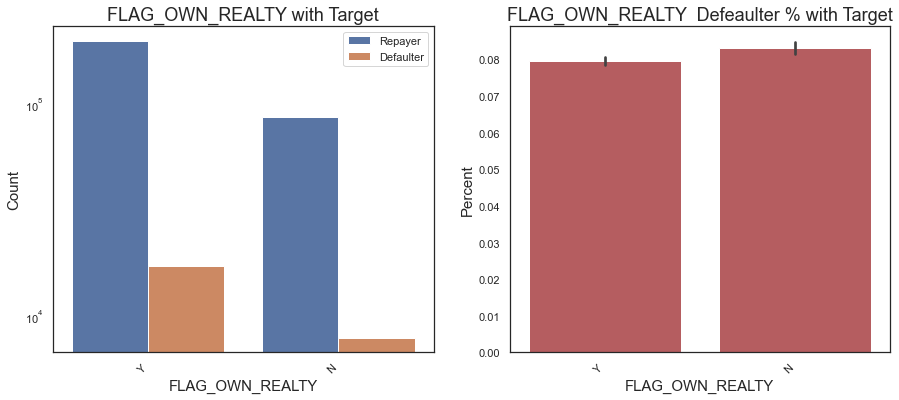

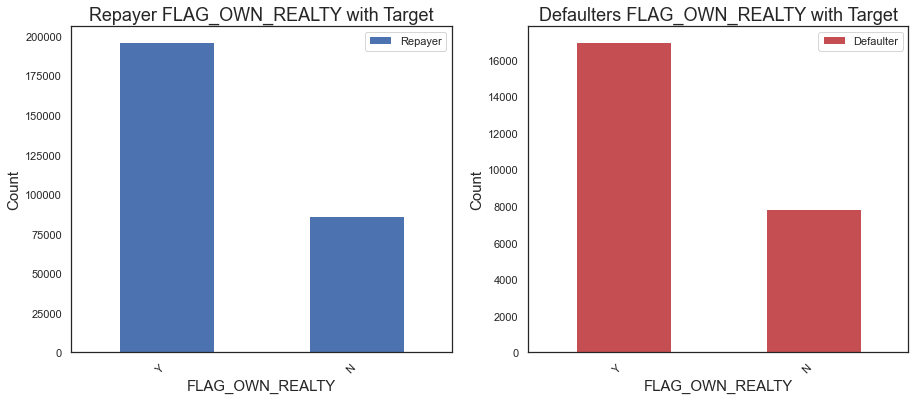

FLAG_OWN_REALTY  TARGET
N                0         91.675071
                 1          8.324929
Y                0         92.038423
                 1          7.961577
Name: TARGET, dtype: float64

In [149]:
my_chart_countplot2("FLAG_OWN_REALTY","TARGET",(15,6))
univar("FLAG_OWN_REALTY","TARGET",(15,6))


### Observation

1. People who own Property are double to repay loan then who don't own
2. people are owning property are also a defaulters as well
3. Defaulter percentage is almost same in both people who own property and people who don't
4. instead of count of application we should focus on percentage of defaulter in groups

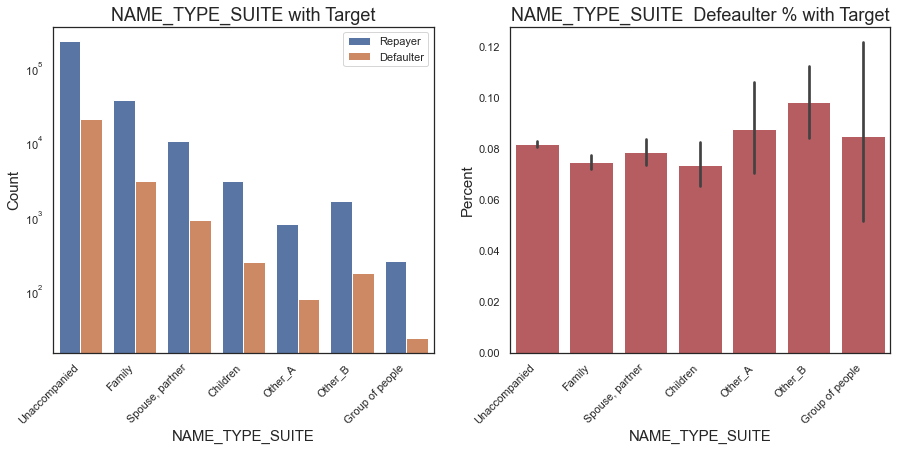

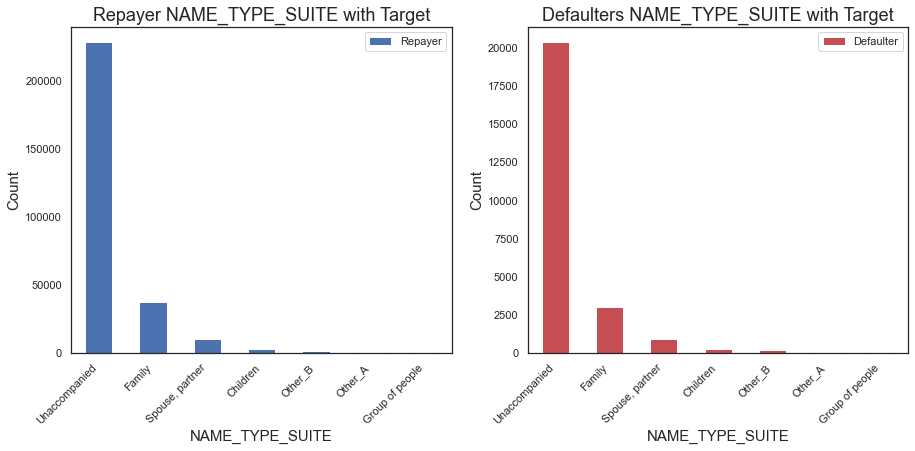

NAME_TYPE_SUITE  TARGET
Children         0         92.623202
                 1          7.376798
Family           0         92.505417
                 1          7.494583
Group of people  0         91.512915
                 1          8.487085
Other_A          0         91.224018
                 1          8.775982
Other_B          0         90.169492
                 1          9.830508
Spouse, partner  0         92.128408
                 1          7.871592
Unaccompanied    0         91.816953
                 1          8.183047
Name: TARGET, dtype: float64

In [150]:
my_chart_countplot2('NAME_TYPE_SUITE','TARGET',(15,6))
univar('NAME_TYPE_SUITE','TARGET',(15,6))

### Observation

1. Unaccompanied are more repayers
2. Unaccompanied are having more defaulters as well

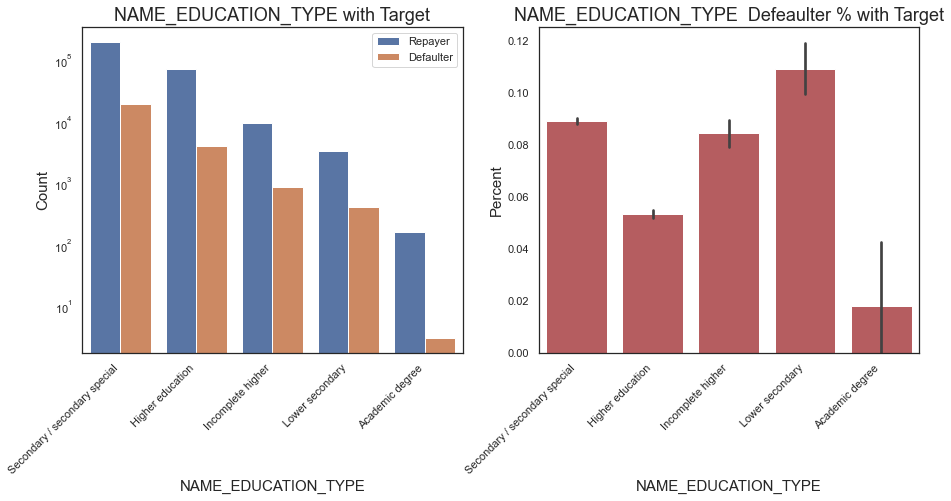

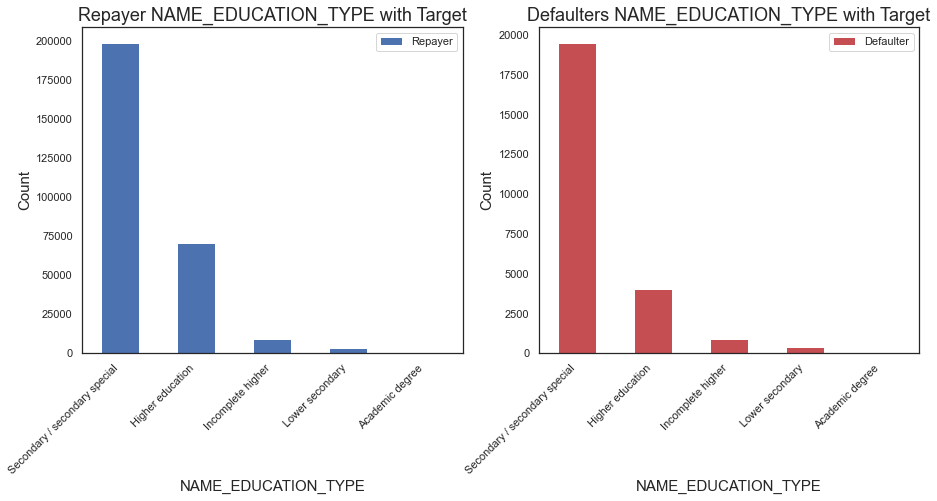

NAME_EDUCATION_TYPE            TARGET
Academic degree                0         98.170732
                               1          1.829268
Higher education               0         94.644885
                               1          5.355115
Incomplete higher              0         91.515034
                               1          8.484966
Lower secondary                0         89.072327
                               1         10.927673
Secondary / secondary special  0         91.060071
                               1          8.939929
Name: TARGET, dtype: float64

In [151]:
my_chart_countplot2('NAME_EDUCATION_TYPE','TARGET',(15,6))
univar('NAME_EDUCATION_TYPE','TARGET',(15,6))

## observation 
1. lower secondary educated peoples are more defaulters interms of percentage with application repayes vs application defaults
2. secondary specials are good repayers

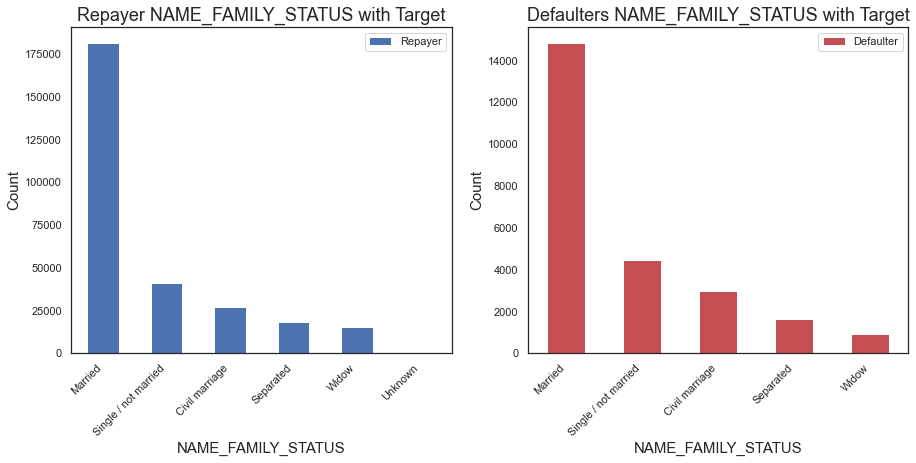

NAME_FAMILY_STATUS    TARGET
Civil marriage        0          90.055416
                      1           9.944584
Married               0          92.440132
                      1           7.559868
Separated             0          91.805766
                      1           8.194234
Single / not married  0          90.192325
                      1           9.807675
Unknown               0         100.000000
Widow                 0          94.175783
                      1           5.824217
Name: TARGET, dtype: float64

In [152]:

univar('NAME_FAMILY_STATUS','TARGET',(15,6))

## observations

1. married people are more. likely repayers
2. civil marriage people are more likely defaulters
3. married applicants are high Defaulters in volume


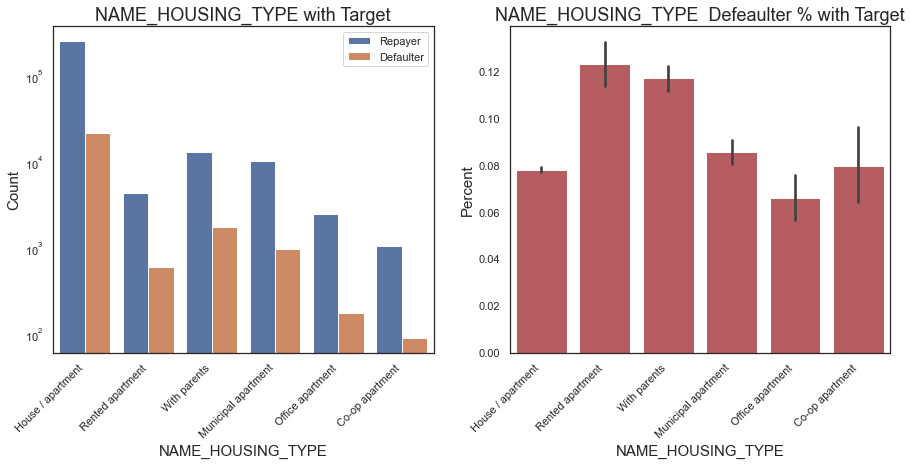

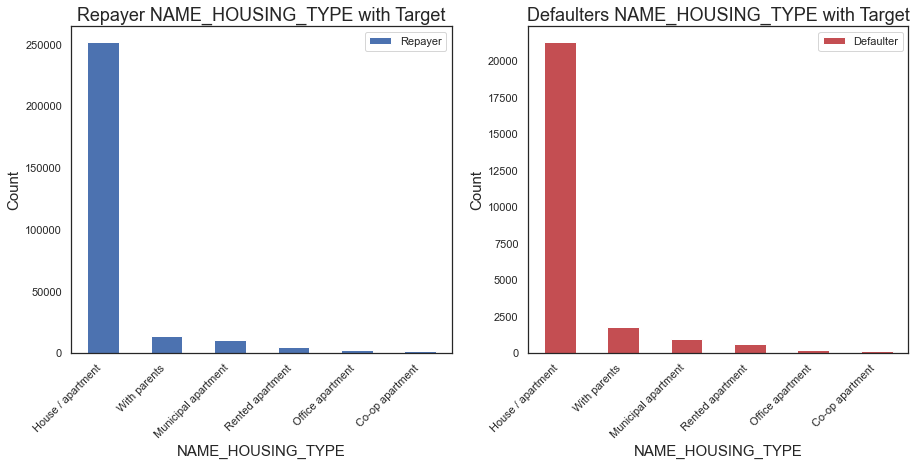

NAME_HOUSING_TYPE    TARGET
Co-op apartment      0         92.067736
                     1          7.932264
House / apartment    0         92.204289
                     1          7.795711
Municipal apartment  0         91.460252
                     1          8.539748
Office apartment     0         93.427589
                     1          6.572411
Rented apartment     0         87.686949
                     1         12.313051
With parents         0         88.301887
                     1         11.698113
Name: TARGET, dtype: float64

In [153]:
my_chart_countplot2('NAME_HOUSING_TYPE','TARGET',(15,6))
univar('NAME_HOUSING_TYPE','TARGET',(15,6))


#### Observation
1. with percentage Rented Apartment and with Parents application holders are more Defaultersm
2. Application volume wise - House/Apparment people are defaulters

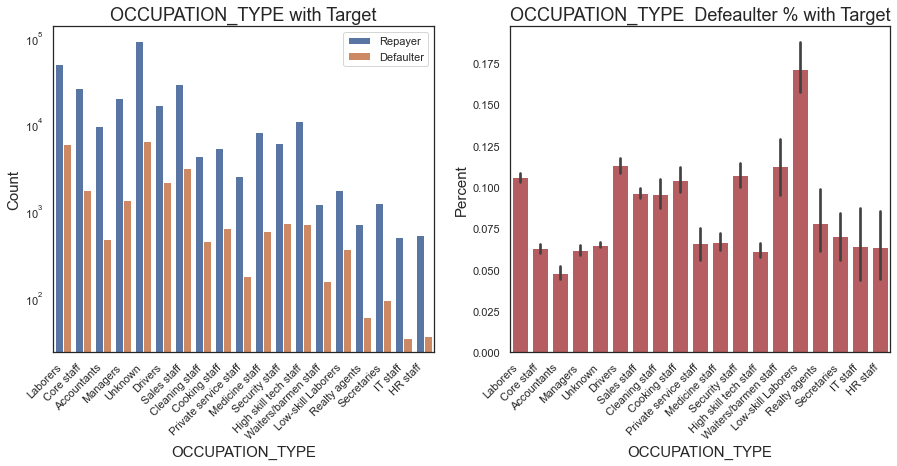

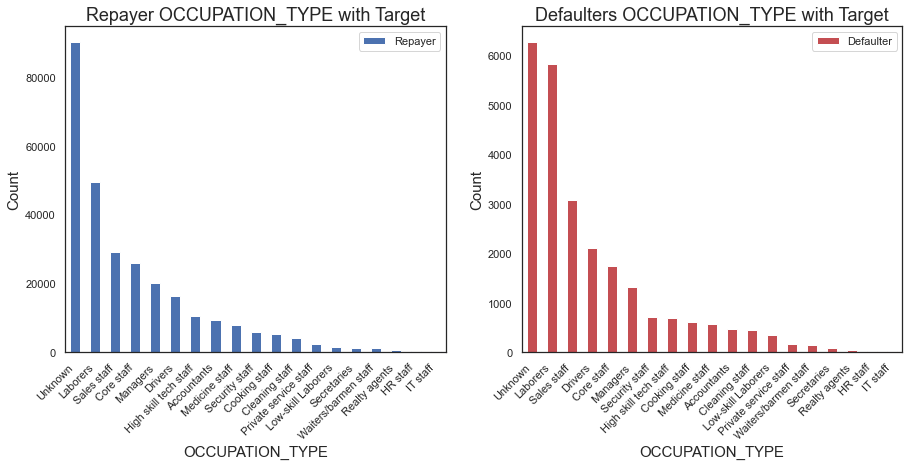

OCCUPATION_TYPE        TARGET
Accountants            0         95.169673
                       1          4.830327
Cleaning staff         0         90.393295
                       1          9.606705
Cooking staff          0         89.556004
                       1         10.443996
Core staff             0         93.696046
                       1          6.303954
Drivers                0         88.673870
                       1         11.326130
HR staff               0         93.605684
                       1          6.394316
High skill tech staff  0         93.840070
                       1          6.159930
IT staff               0         93.536122
                       1          6.463878
Laborers               0         89.421230
                       1         10.578770
Low-skill Laborers     0         82.847587
                       1         17.152413
Managers               0         93.785972
                       1          6.214028
Medicine staff         0

In [154]:
my_chart_countplot2('OCCUPATION_TYPE','TARGET',(15,6))
univar('OCCUPATION_TYPE','TARGET',(15,6))

## observation 
1. low skill labours  and Unknown skill holderes are more defaulters
2. unknown are good repayers as well

In [155]:
current_applications.dtypes

SK_ID_CURR                        int64
TARGET                            int64
NAME_CONTRACT_TYPE               object
CODE_GENDER                      object
FLAG_OWN_CAR                     object
FLAG_OWN_REALTY                  object
CNT_CHILDREN                      int64
AMT_INCOME_TOTAL                float64
AMT_CREDIT                      float64
AMT_ANNUITY                     float64
AMT_GOODS_PRICE                 float64
NAME_TYPE_SUITE                  object
NAME_INCOME_TYPE                 object
NAME_EDUCATION_TYPE              object
NAME_FAMILY_STATUS               object
NAME_HOUSING_TYPE                object
REGION_POPULATION_RELATIVE      float64
DAYS_BIRTH                        int64
DAYS_EMPLOYED                     int64
DAYS_REGISTRATION               float64
DAYS_ID_PUBLISH                   int64
OCCUPATION_TYPE                  object
CNT_FAM_MEMBERS                 float64
REGION_RATING_CLIENT              int64
REGION_RATING_CLIENT_W_CITY       int64


In [156]:
numerical_col= current_applications.select_dtypes(include=['int64','float64']).columns
numerical_col

Index(['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'CNT_FAM_MEMBERS',
       'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY',
       'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION',
       'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION',
       'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY',
       'LIVE_CITY_NOT_WORK_CITY', 'OBS_30_CNT_SOCIAL_CIRCLE',
       'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE',
       'DEF_60_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE', 'FLAG_DOCUMENT_3',
       'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY',
       'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON',
       'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR', 'AGE',
       'EMPLOYED_YEARS'],
      dtype='object')

In [157]:
for i in numerical_col:
    print(i,":",len(current_applications[i].unique()))

SK_ID_CURR : 307511
TARGET : 2
CNT_CHILDREN : 15
AMT_INCOME_TOTAL : 2548
AMT_CREDIT : 5603
AMT_ANNUITY : 13673
AMT_GOODS_PRICE : 1003
REGION_POPULATION_RELATIVE : 81
DAYS_BIRTH : 17460
DAYS_EMPLOYED : 12574
DAYS_REGISTRATION : 15688
DAYS_ID_PUBLISH : 6168
CNT_FAM_MEMBERS : 18
REGION_RATING_CLIENT : 3
REGION_RATING_CLIENT_W_CITY : 3
HOUR_APPR_PROCESS_START : 24
REG_REGION_NOT_LIVE_REGION : 2
REG_REGION_NOT_WORK_REGION : 2
LIVE_REGION_NOT_WORK_REGION : 2
REG_CITY_NOT_LIVE_CITY : 2
REG_CITY_NOT_WORK_CITY : 2
LIVE_CITY_NOT_WORK_CITY : 2
OBS_30_CNT_SOCIAL_CIRCLE : 34
DEF_30_CNT_SOCIAL_CIRCLE : 11
OBS_60_CNT_SOCIAL_CIRCLE : 34
DEF_60_CNT_SOCIAL_CIRCLE : 10
DAYS_LAST_PHONE_CHANGE : 3774
FLAG_DOCUMENT_3 : 2
AMT_REQ_CREDIT_BUREAU_HOUR : 6
AMT_REQ_CREDIT_BUREAU_DAY : 10
AMT_REQ_CREDIT_BUREAU_WEEK : 10
AMT_REQ_CREDIT_BUREAU_MON : 25
AMT_REQ_CREDIT_BUREAU_QRT : 12
AMT_REQ_CREDIT_BUREAU_YEAR : 26
AGE : 17460
EMPLOYED_YEARS : 12574


In [158]:
discrite_col = [feature for feature in numerical_col if len(current_applications[feature].unique())<10]
print(len(discrite_col))

11


In [159]:
discrite_col

['TARGET',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'FLAG_DOCUMENT_3',
 'AMT_REQ_CREDIT_BUREAU_HOUR']

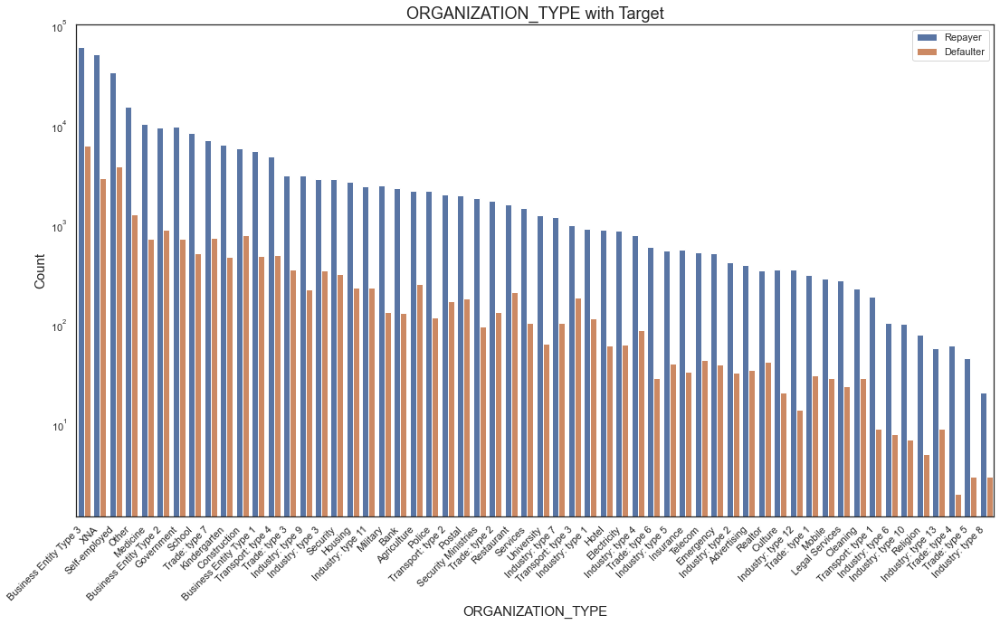

In [160]:
plt.figure(figsize=(40,10))
plt.subplot(1,2,1)
sns.countplot(data= current_applications, x='ORGANIZATION_TYPE' , hue = 'TARGET', order=current_applications.ORGANIZATION_TYPE.value_counts().index)
plt.xlabel("ORGANIZATION_TYPE", fontdict={'fontsize':15})    
plt.ylabel('Count', fontdict={'fontsize':15})
plt.yscale('log')
plt.legend({"Repayer":0,'Defaulter':1})
plt.title(feature +' with Target',fontdict={'fontsize':18})
plt.xticks(rotation=45, ha='right')
plt.show()

## Numerical Columns with TARGET

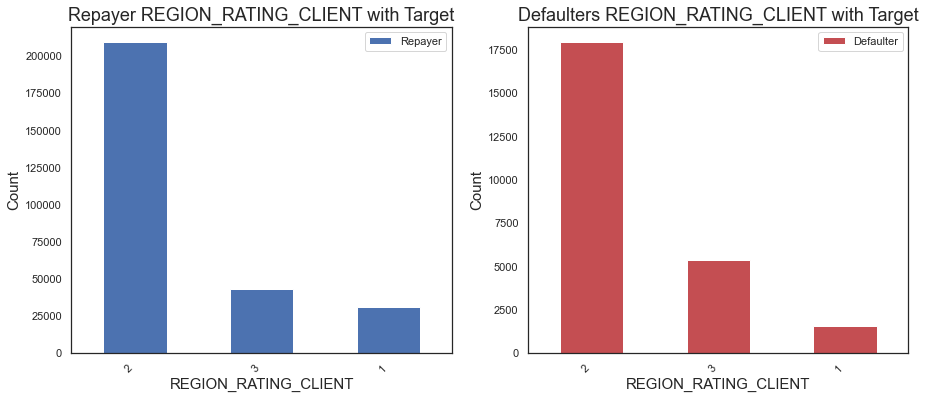

REGION_RATING_CLIENT  TARGET
1                     0         95.179675
                      1          4.820325
2                     0         92.110898
                      1          7.889102
3                     0         88.897165
                      1         11.102835
Name: TARGET, dtype: float64

In [161]:

univar('REGION_RATING_CLIENT','TARGET',(15,6))


### Observation
Region 3 rating clients are more defaulters and Region2 clients are more Repayers

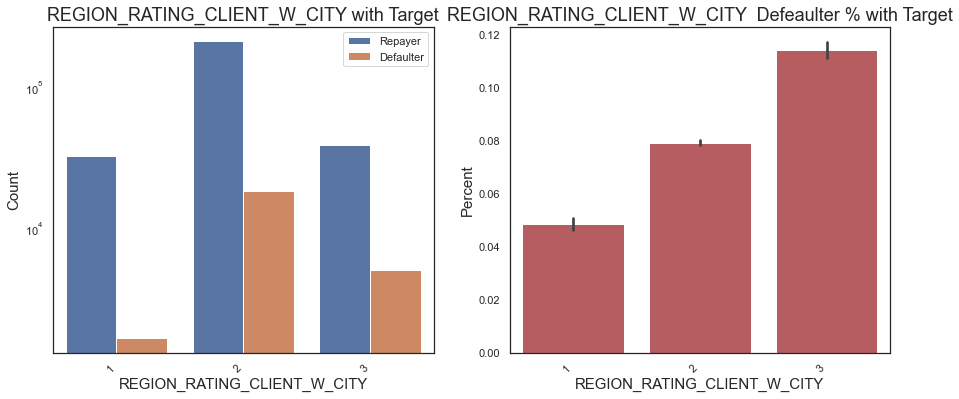

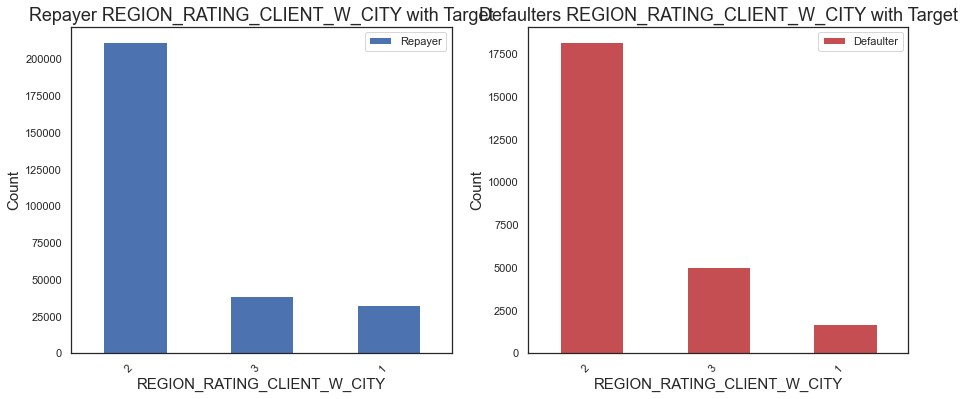

REGION_RATING_CLIENT_W_CITY  TARGET
1                            0         95.159072
                             1          4.840928
2                            0         92.082237
                             1          7.917763
3                            0         88.597811
                             1         11.402189
Name: TARGET, dtype: float64

In [162]:
my_chart_countplot2('REGION_RATING_CLIENT_W_CITY','TARGET',(15,6))
univar('REGION_RATING_CLIENT_W_CITY','TARGET',(15,6))


### Observation
1. REGION_RATING_CLIENT_W_CITY 2 is having most repayers
2. REGION_RATING_CLIENT_W_CITY 1 having less defaulters

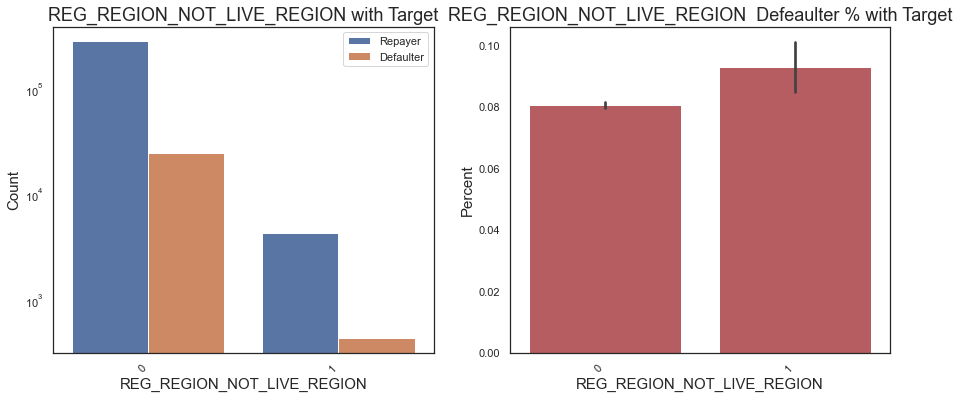

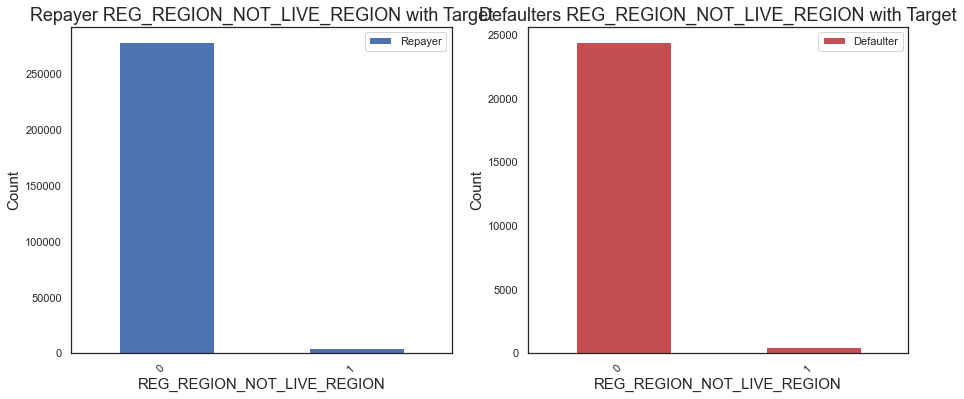

REG_REGION_NOT_LIVE_REGION  TARGET
0                           0         91.945954
                            1          8.054046
1                           0         90.702169
                            1          9.297831
Name: TARGET, dtype: float64

In [163]:
my_chart_countplot2('REG_REGION_NOT_LIVE_REGION','TARGET',(15,6))
univar('REG_REGION_NOT_LIVE_REGION','TARGET',(15,6))


## Observation
1. those whos address are matching with permanent addresses are good repayers
2. those whose addresses are not match are defaulters 
3. 8% of clients are whose addresses are matching but still are defaulters
4. 9% of clients whose address is not matching and defaulters as well

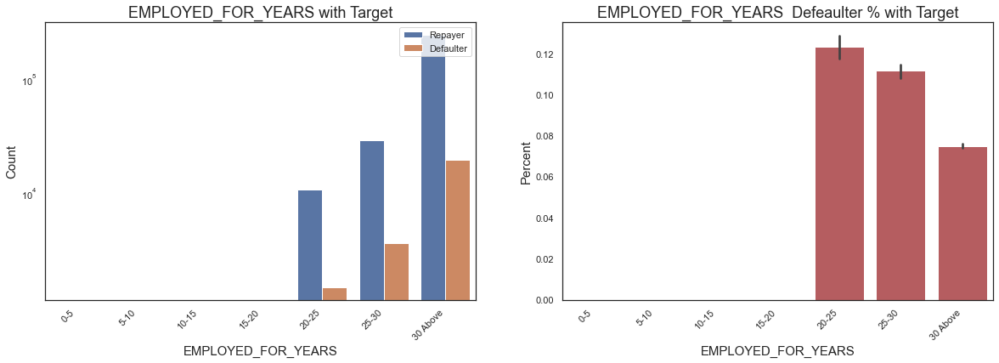

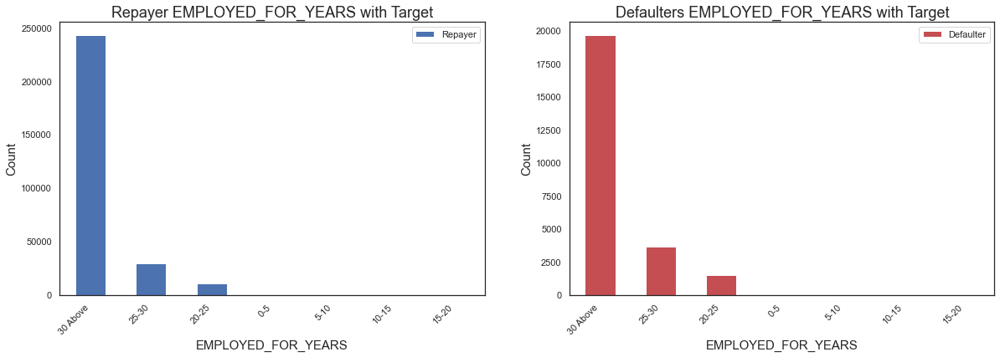

In [164]:
my_chart_countplot3('EMPLOYED_FOR_YEARS','TARGET',(20,6))

univar1('EMPLOYED_FOR_YEARS','TARGET',(20,6))



### Observation
1. People who are employed for 30 years are more good repayers
2. who are working between 20- 30 years of experience are more defaulters
3. 30 above are have more defaulters


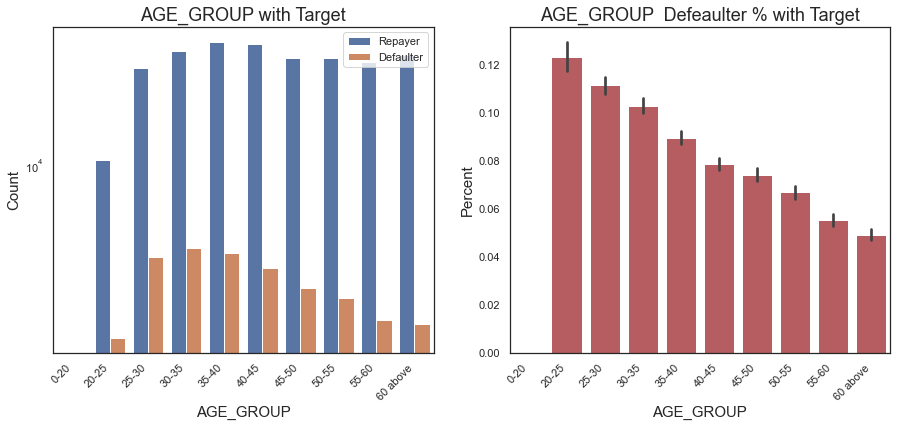

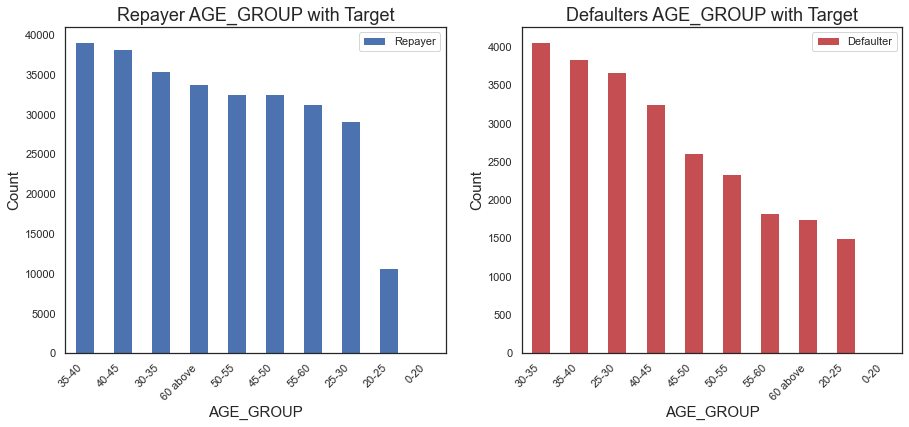

In [165]:
my_chart_countplot3('AGE_GROUP','TARGET',(15,6))
univar1('AGE_GROUP','TARGET',(15,6))


### Observation
1. 35 to 40 years of age applicants are good repayers
2. 35 to 40 years of age applicants are defaulters in terms of volume
3. 20-25 years of age applicants are more defaulters

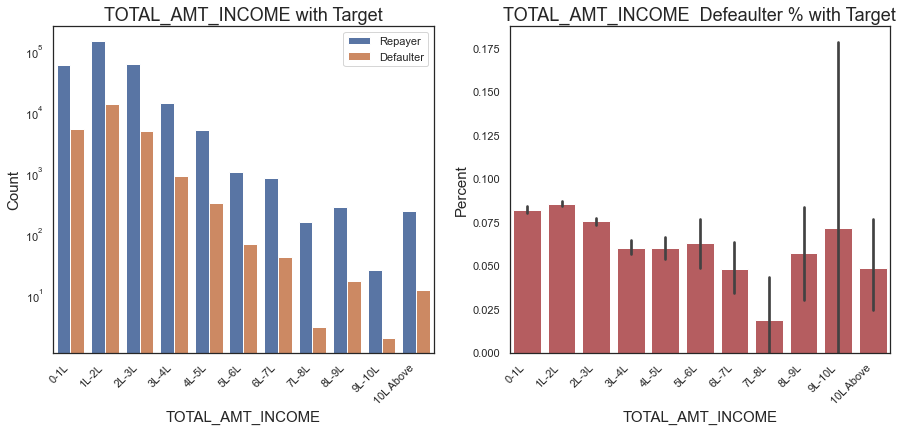

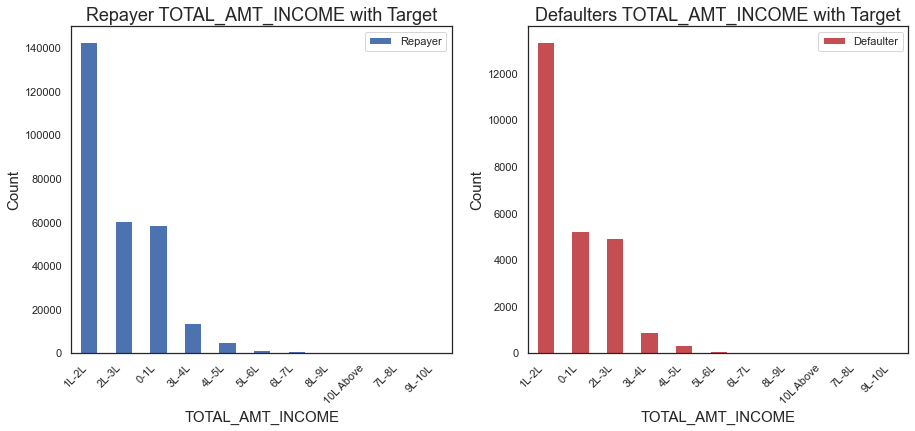

In [166]:
my_chart_countplot3('TOTAL_AMT_INCOME','TARGET',(15,6))
univar1('TOTAL_AMT_INCOME','TARGET',(15,6))




### Observation
1. 1-2Lakh income people are taking more loans and are good repayers
2. But at the same time there are high defaulters too

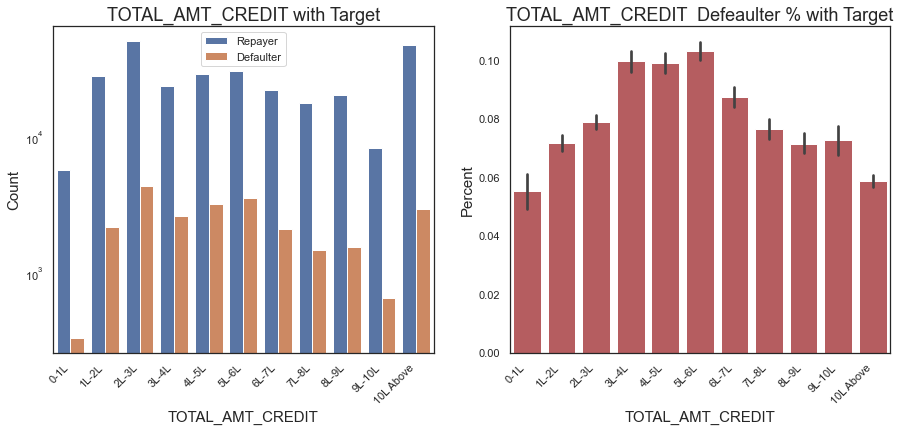

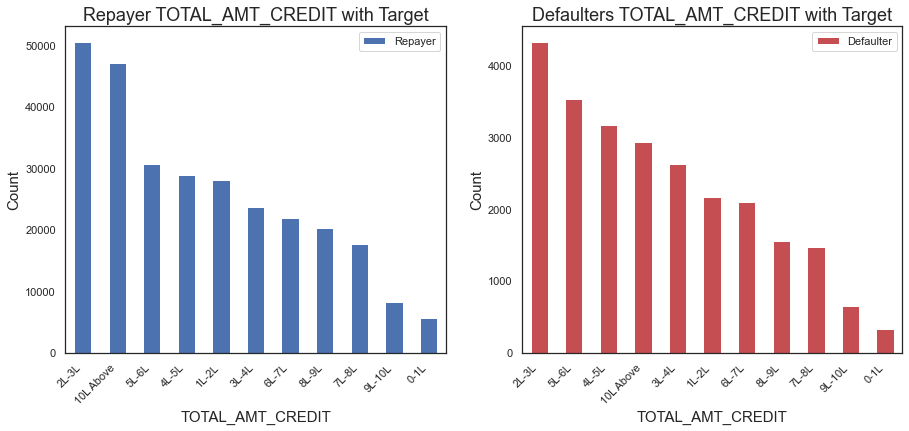

In [167]:
my_chart_countplot2('TOTAL_AMT_CREDIT','TARGET',(15,6))
univar1('TOTAL_AMT_CREDIT','TARGET',(15,6))


### Observation
1. 2-3lakhs and 10 lakhs above credit are having more repayers
2. 2L- 3L are having more defaulters as well
3. but by percentage regarding how people applied and got the loan by particular section are 4-5L and 5-6L are having defaulters

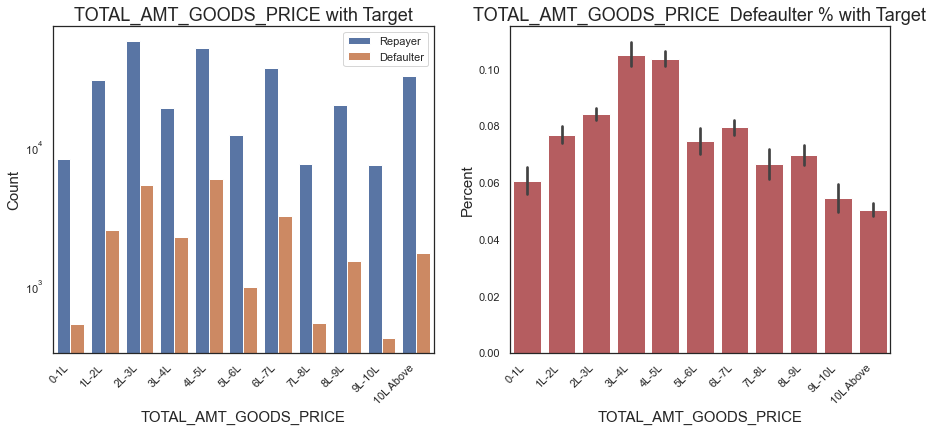

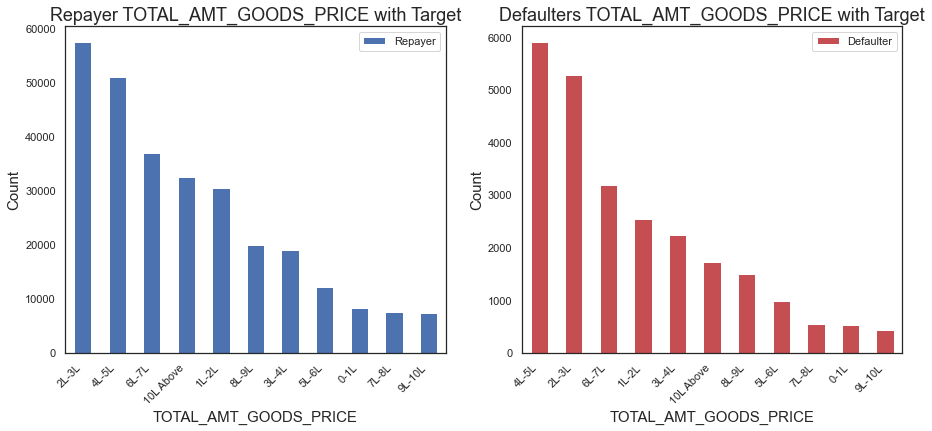

In [168]:
my_chart_countplot2('TOTAL_AMT_GOODS_PRICE','TARGET',(15,6))
univar1('TOTAL_AMT_GOODS_PRICE','TARGET',(15,6))


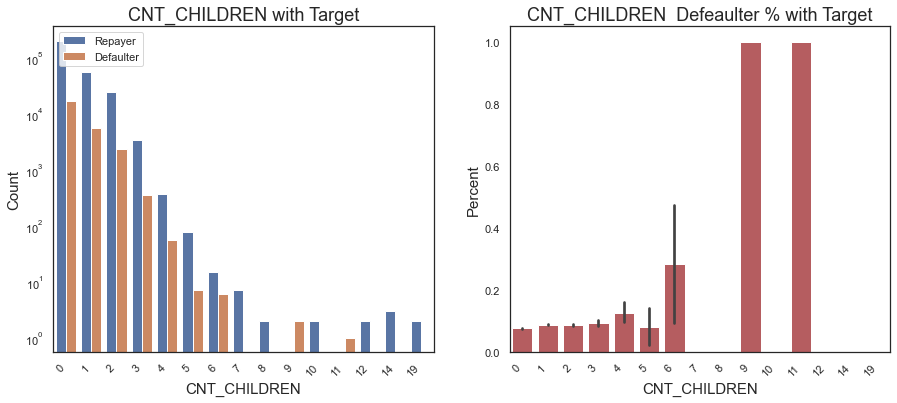

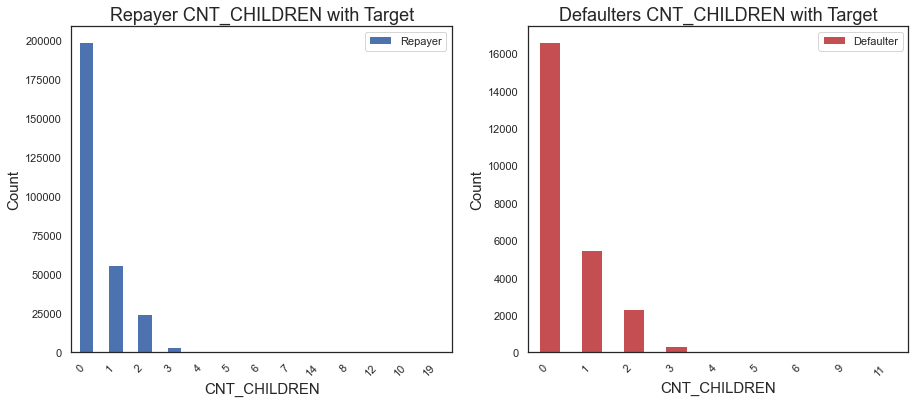

In [169]:
my_chart_countplot2('CNT_CHILDREN','TARGET',(15,6))
univar1('CNT_CHILDREN','TARGET',(15,6))


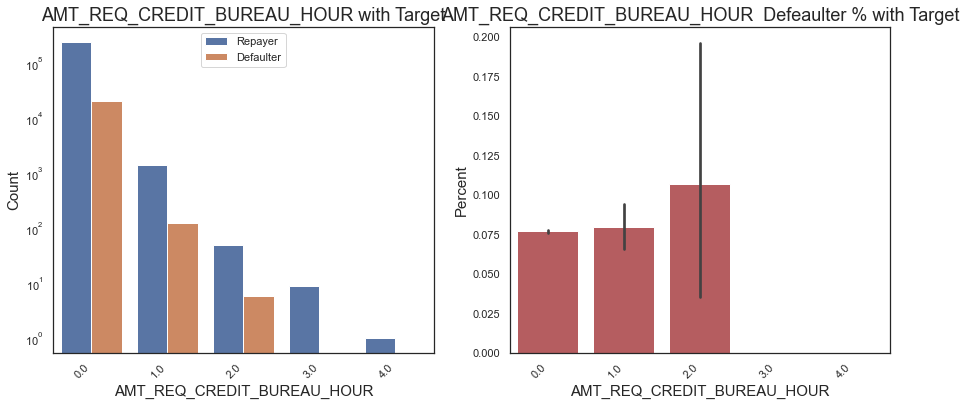

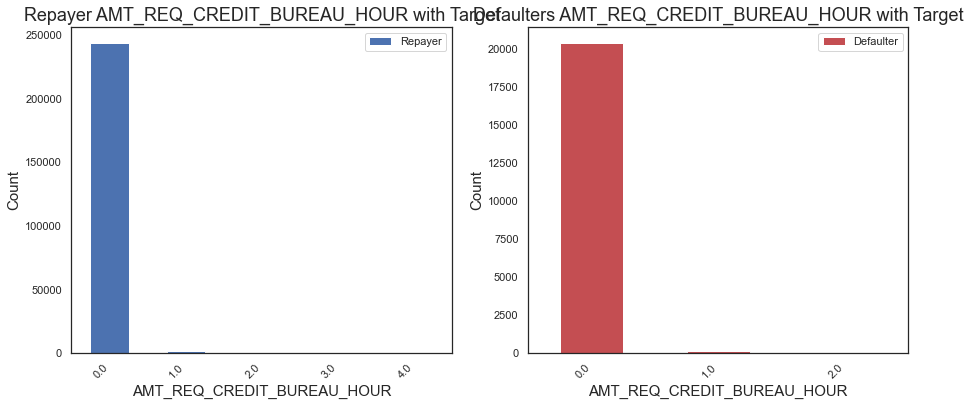

In [170]:
my_chart_countplot2('AMT_REQ_CREDIT_BUREAU_HOUR','TARGET',(15,6))
univar1('AMT_REQ_CREDIT_BUREAU_HOUR','TARGET',(15,6))


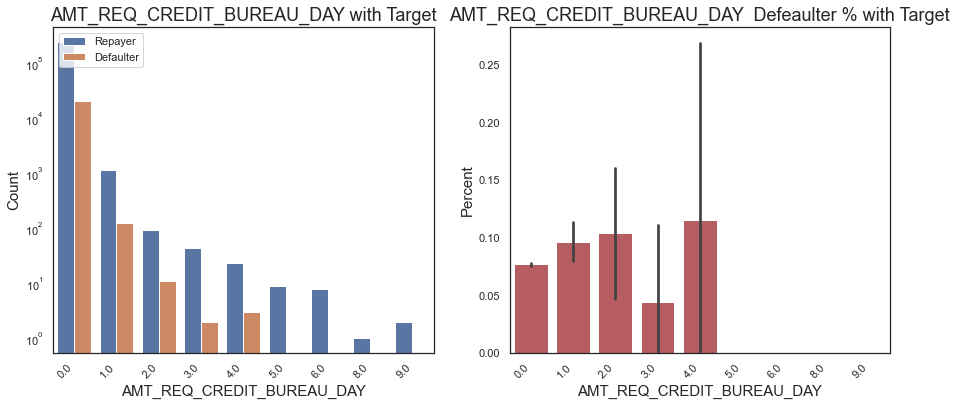

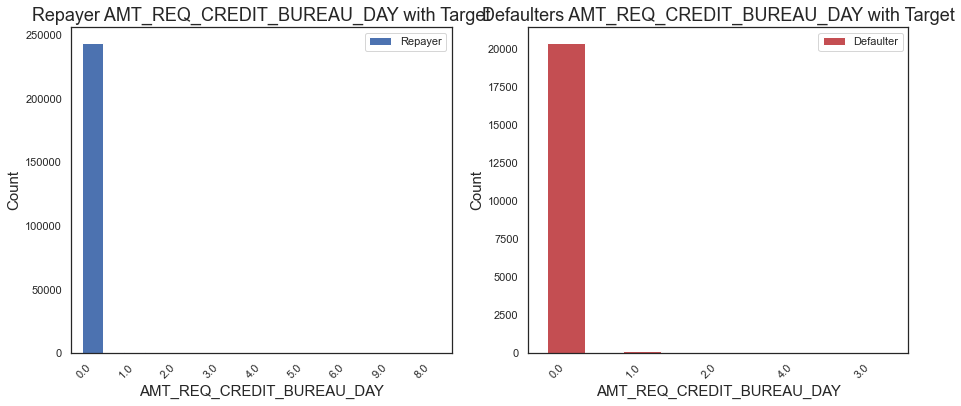

In [171]:
my_chart_countplot2('AMT_REQ_CREDIT_BUREAU_DAY','TARGET',(15,6))
univar1('AMT_REQ_CREDIT_BUREAU_DAY','TARGET',(15,6))

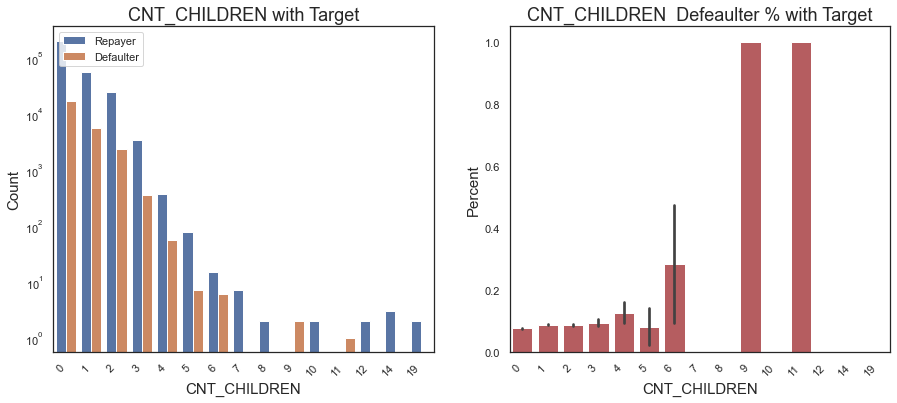

In [172]:
my_chart_countplot2('CNT_CHILDREN','TARGET',(15,6))

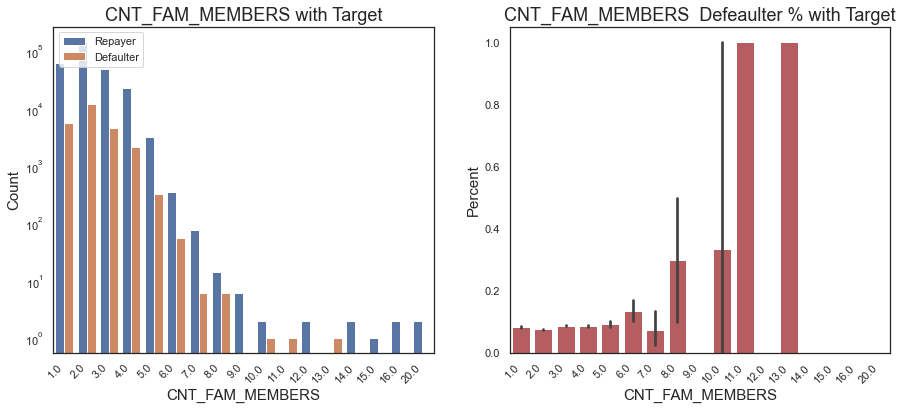

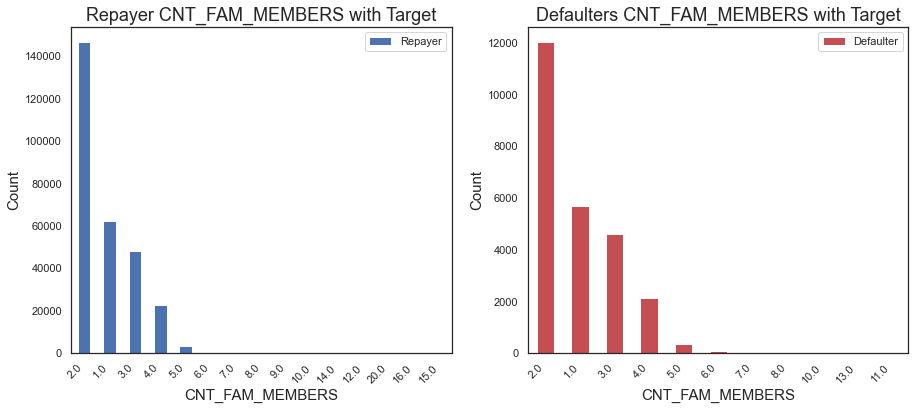

In [173]:
my_chart_countplot2('CNT_FAM_MEMBERS','TARGET',(15,6))
univar1('CNT_FAM_MEMBERS','TARGET',(15,6))


In [174]:
current_applications.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_3,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AGE,AGE_GROUP,EMPLOYED_YEARS,EMPLOYED_FOR_YEARS,TOTAL_AMT_INCOME,TOTAL_AMT_CREDIT,TOTAL_AMT_GOODS_PRICE
0,100002,1,Cash loans,M,N,Y,0,2.025,4.065975,24700.5,3.510,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,9461,637,3648.0,2120,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,2.0,2.0,2.0,2.0,1134.0,1,0.0,0.0,0.0,0.0,0.0,1.0,25.920548,25-30,1.745205,25-30,2L-3L,4L-5L,3L-4L
1,100003,0,Cash loans,F,N,N,0,2.700,12.935025,35698.5,11.295,Family,State servant,Higher education,Married,House / apartment,0.003541,16765,1188,1186.0,291,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,1.0,0.0,1.0,0.0,828.0,1,0.0,0.0,0.0,0.0,0.0,0.0,45.931507,45-50,3.254795,30 Above,2L-3L,10L Above,10L Above
2,100004,0,Revolving loans,M,Y,Y,0,0.675,1.350000,6750.0,1.350,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,19046,225,4260.0,2531,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.0,0.0,0.0,0.0,815.0,0,0.0,0.0,0.0,0.0,0.0,0.0,52.180822,50-55,0.616438,30 Above,0-1L,1L-2L,1L-2L
3,100006,0,Cash loans,F,N,Y,0,1.350,3.126825,29686.5,2.970,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,19005,3039,9833.0,2437,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,2.0,0.0,2.0,0.0,617.0,1,NaN,NaN,NaN,NaN,NaN,NaN,52.068493,50-55,8.326027,30 Above,1L-2L,3L-4L,2L-3L
4,100007,0,Cash loans,M,N,Y,0,1.215,5.130000,21865.5,5.130,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,19932,3038,4311.0,3458,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.0,0.0,0.0,0.0,1106.0,0,0.0,0.0,0.0,0.0,0.0,0.0,54.608219,50-55,8.323288,30 Above,1L-2L,5L-6L,5L-6L


In [175]:
previous_applications.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,17145.0,SATURDAY,15,Y,1,XAP,Approved,73,Cash through the bank,XAP,Unknown_relation,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,42.0,300.0,42.0,37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,607500.0,THURSDAY,11,Y,1,XNA,Approved,164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,112500.0,TUESDAY,11,Y,1,XNA,Approved,301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,450000.0,MONDAY,7,Y,1,XNA,Approved,512,Cash through the bank,XAP,Unknown_relation,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,482.0,152.0,182.0,177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,337500.0,THURSDAY,9,Y,1,Repairs,Refused,781,Cash through the bank,HC,Unknown_relation,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


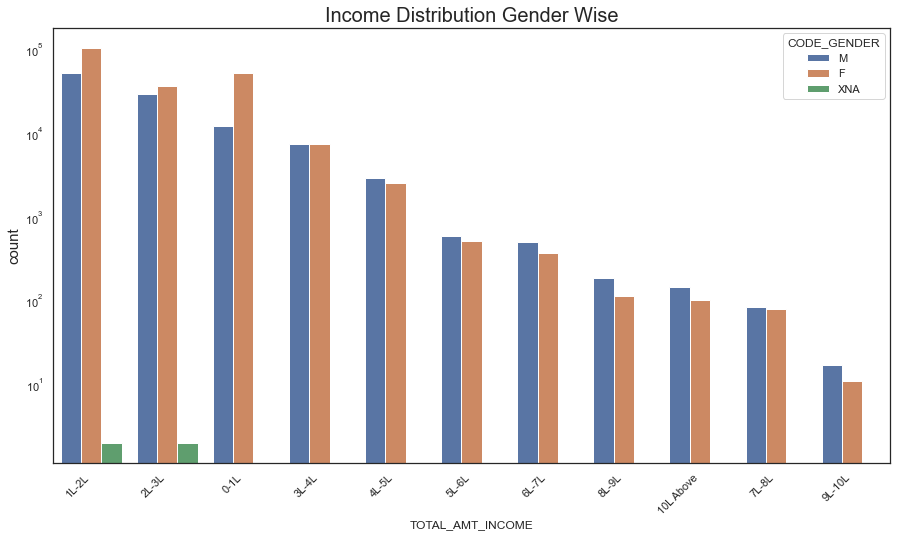

In [176]:
plt.figure(figsize=(15,8))
sns.countplot(data=current_applications,x='TOTAL_AMT_INCOME',hue='CODE_GENDER', order=current_applications.TOTAL_AMT_INCOME.value_counts().index)
plt.yscale('log')
plt.ylabel('count',fontsize=15)
plt.title("Income Distribution Gender Wise", fontsize=20)
plt.xticks(rotation=45, ha='right')
plt.show()

### Observation
1. 1L-2L, 2L-3L, 0-1L females are earning more than males
2. 4-5L, 6L-7L, 8L-9L males are earning more than females

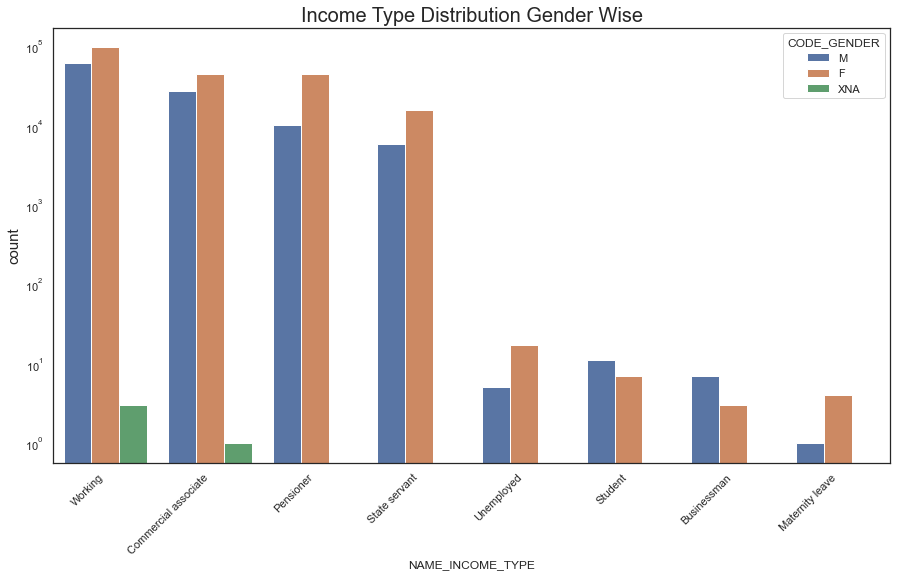

In [177]:
plt.figure(figsize=(15,8))
sns.countplot(data=current_applications,x='NAME_INCOME_TYPE',hue='CODE_GENDER', order=current_applications.NAME_INCOME_TYPE.value_counts().index)
plt.yscale('log')
plt.ylabel('count',fontsize=15)
plt.title("Income Type Distribution Gender Wise", fontsize=20)
plt.xticks(rotation=45, ha='right')
plt.show()

### Observation
1. Working class and commercial females are more who apply for loans

## Bivariate Analysis

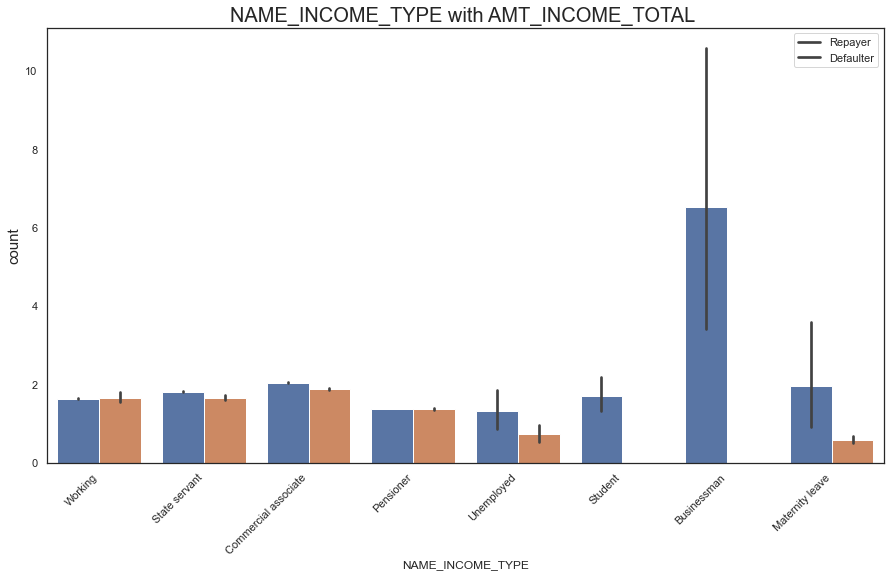

In [178]:
plt.figure(figsize=(15,8))
sns.barplot(data=current_applications,x='NAME_INCOME_TYPE',y='AMT_INCOME_TOTAL',hue='TARGET')
#plt.yscale('log')
plt.ylabel('count',fontsize=15)
plt.title("NAME_INCOME_TYPE with AMT_INCOME_TOTAL ", fontsize=20)
plt.xticks(rotation=45, ha='right')
plt.legend({'Repayer':0,'Defaulter':1})
plt.show()

### Observation
1. Business man are great Repairs

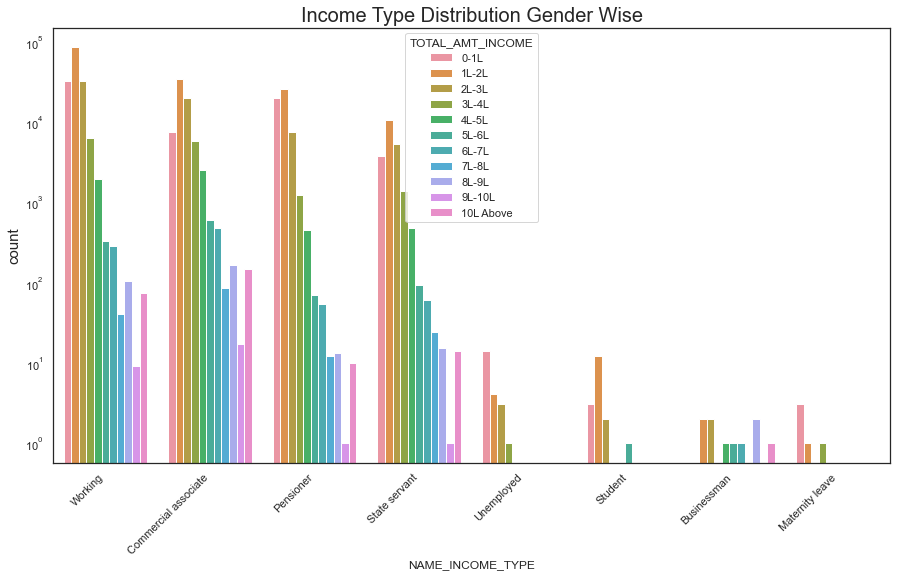

In [179]:
plt.figure(figsize=(15,8))
sns.countplot(data=current_applications,x='NAME_INCOME_TYPE',hue='TOTAL_AMT_INCOME', order=current_applications.NAME_INCOME_TYPE.value_counts().index)
plt.yscale('log')
plt.ylabel('count',fontsize=15)
plt.title("Income Type Distribution Gender Wise", fontsize=20)
plt.xticks(rotation=45, ha='right')
plt.show()

### Observations
1. Working, Commercial associate, Pensioner and State servant are having more income potentials

## Multivariate
### Correlation between columns

In [180]:
current_applications.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
       'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH',
       'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY', 'WEEKDAY_APPR_PROCESS_START',
       'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION',
       'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION',
       'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY',
       'LIVE_CITY_NOT_WORK_CITY', 'ORGANIZATION_TYPE',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE',
       'DAYS_LAST_PHONE_CHANGE', 'FLAG_DOCUMENT_3',
       'AMT

In [181]:
# take out columns from Name_COntract_Type to AMT_REQ_CREDIT_BUREAU_YEAR because after that rest columns are made by us
# split them with the help of target as given in problem statement number 2 
# find correlation between them

newdf1= ['NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
       'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH',
       'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY', 'WEEKDAY_APPR_PROCESS_START',
       'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION',
       'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION',
       'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY',
       'LIVE_CITY_NOT_WORK_CITY', 'ORGANIZATION_TYPE',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE',
       'DAYS_LAST_PHONE_CHANGE', 'FLAG_DOCUMENT_3',
       'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY',
       'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON',
       'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR']
len(newdf1)

44

In [182]:
repayer_df= current_applications.loc[current_applications.TARGET==0,newdf1]
repayer_df.shape

(282686, 44)

In [183]:
defaulter_df= current_applications.loc[current_applications.TARGET==1,newdf1]
defaulter_df.shape

(24825, 44)

### Repayers

In [184]:
corr_df_repayer = repayer_df.corr()
corr_df_repayer= corr_df_repayer.where(np.triu(np.ones(corr_df_repayer.shape), k=1).astype(np.bool))
corr_df_repayer= corr_df_repayer.unstack().reset_index()
corr_df_repayer.columns= ['Var1','Var2','Correlation']
corr_df_repayer.dropna(subset=['Correlation'],inplace=True)
corr_df_repayer['Correlation']= np.round(corr_df_repayer['Correlation'],2)
corr_df_repayer['Correlation']= abs(corr_df_repayer['Correlation'])
corr_df_repayer= corr_df_repayer.sort_values(by= ['Correlation'],ascending=False).head(10)
corr_df_repayer

,Var1,Var2,Correlation
724,OBS_60_CNT_SOCIAL_CIRCLE,OBS_30_CNT_SOCIAL_CIRCLE,1.00
130,AMT_GOODS_PRICE,AMT_CREDIT,0.99
395,REGION_RATING_CLIENT_W_CITY,REGION_RATING_CLIENT,0.95
320,CNT_FAM_MEMBERS,CNT_CHILDREN,0.88
757,DEF_60_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,0.86
527,LIVE_REGION_NOT_WORK_REGION,REG_REGION_NOT_WORK_REGION,0.86
626,LIVE_CITY_NOT_WORK_CITY,REG_CITY_NOT_WORK_CITY,0.83
131,AMT_GOODS_PRICE,AMT_ANNUITY,0.78
98,AMT_ANNUITY,AMT_CREDIT,0.77
230,DAYS_EMPLOYED,DAYS_BIRTH,0.63


In [185]:
repayer_corr1= repayer_df[['OBS_60_CNT_SOCIAL_CIRCLE','OBS_30_CNT_SOCIAL_CIRCLE','AMT_GOODS_PRICE','AMT_CREDIT','REGION_RATING_CLIENT_W_CITY'
           ,'REGION_RATING_CLIENT','CNT_FAM_MEMBERS','CNT_CHILDREN','DEF_60_CNT_SOCIAL_CIRCLE','DEF_30_CNT_SOCIAL_CIRCLE',
           'LIVE_REGION_NOT_WORK_REGION','REG_REGION_NOT_WORK_REGION','LIVE_CITY_NOT_WORK_CITY','REG_CITY_NOT_WORK_CITY',
           'AMT_GOODS_PRICE','AMT_ANNUITY','AMT_CREDIT','DAYS_EMPLOYED','DAYS_BIRTH']].head()

In [186]:
repayer_corr=repayer_df[['CNT_CHILDREN','AMT_INCOME_TOTAL','AMT_CREDIT','AMT_ANNUITY','REGION_POPULATION_RELATIVE','DAYS_BIRTH',
                'DAYS_EMPLOYED','DAYS_REGISTRATION','DAYS_ID_PUBLISH','HOUR_APPR_PROCESS_START','LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY']]
repayer_corr.head()

,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,HOUR_APPR_PROCESS_START,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY
1,0,2.700,12.935025,35698.5,0.003541,16765,1188,1186.0,291,11,0,0,0,0
2,0,0.675,1.350000,6750.0,0.010032,19046,225,4260.0,2531,9,0,0,0,0
3,0,1.350,3.126825,29686.5,0.008019,19005,3039,9833.0,2437,17,0,0,0,0
4,0,1.215,5.130000,21865.5,0.028663,19932,3038,4311.0,3458,11,0,0,1,1
5,0,0.990,4.904955,27517.5,0.035792,16941,1588,4970.0,477,16,0,0,0,0


In [187]:
repayer_0=repayer_corr.corr(method='spearman')
repayer_0

,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,HOUR_APPR_PROCESS_START,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY
CNT_CHILDREN,1.000000,0.038308,0.002315,0.024767,-0.025551,-0.375639,-0.205693,-0.180517,0.019986,0.001725,0.021523,0.027788,0.076212,0.071585
AMT_INCOME_TOTAL,0.038308,1.000000,0.416017,0.485699,0.097772,-0.093515,-0.095898,-0.076387,-0.035931,0.102384,0.148976,0.020368,0.040087,0.040321
AMT_CREDIT,0.002315,0.416017,1.000000,0.831900,0.053570,0.057151,0.017986,-0.009416,0.001982,0.051370,0.047740,-0.026649,-0.012662,0.006972
AMT_ANNUITY,0.024767,0.485699,0.831900,1.000000,0.058591,-0.011740,-0.030195,-0.037717,-0.016569,0.054189,0.073054,-0.004963,0.009717,0.019451
REGION_POPULATION_RELATIVE,-0.025551,0.097772,0.053570,0.058591,1.000000,0.030730,-0.003651,0.036684,0.010463,0.128237,0.051195,-0.045545,-0.029350,-0.005476
DAYS_BIRTH,-0.375639,-0.093515,0.057151,-0.011740,0.030730,1.000000,0.583711,0.298130,0.261979,-0.098444,-0.070065,-0.180952,-0.239113,-0.156588
DAYS_EMPLOYED,-0.205693,-0.095898,0.017986,-0.030195,-0.003651,0.583711,1.000000,0.201306,0.259900,-0.084417,-0.112790,-0.145590,-0.262852,-0.198795
DAYS_REGISTRATION,-0.180517,-0.076387,-0.009416,-0.037717,0.036684,0.298130,0.201306,1.000000,0.094153,0.008471,-0.024163,-0.055307,-0.085865,-0.062442
DAYS_ID_PUBLISH,0.019986,-0.035931,0.001982,-0.016569,0.010463,0.261979,0.259900,0.094153,1.000000,-0.039755,-0.034776,-0.077360,-0.101050,-0.062976
HOUR_APPR_PROCESS_START,0.001725,0.102384,0.051370,0.054189,0.128237,-0.098444,-0.084417,0.008471,-0.039755,1.000000,0.058612,0.019765,0.020448,0.012789


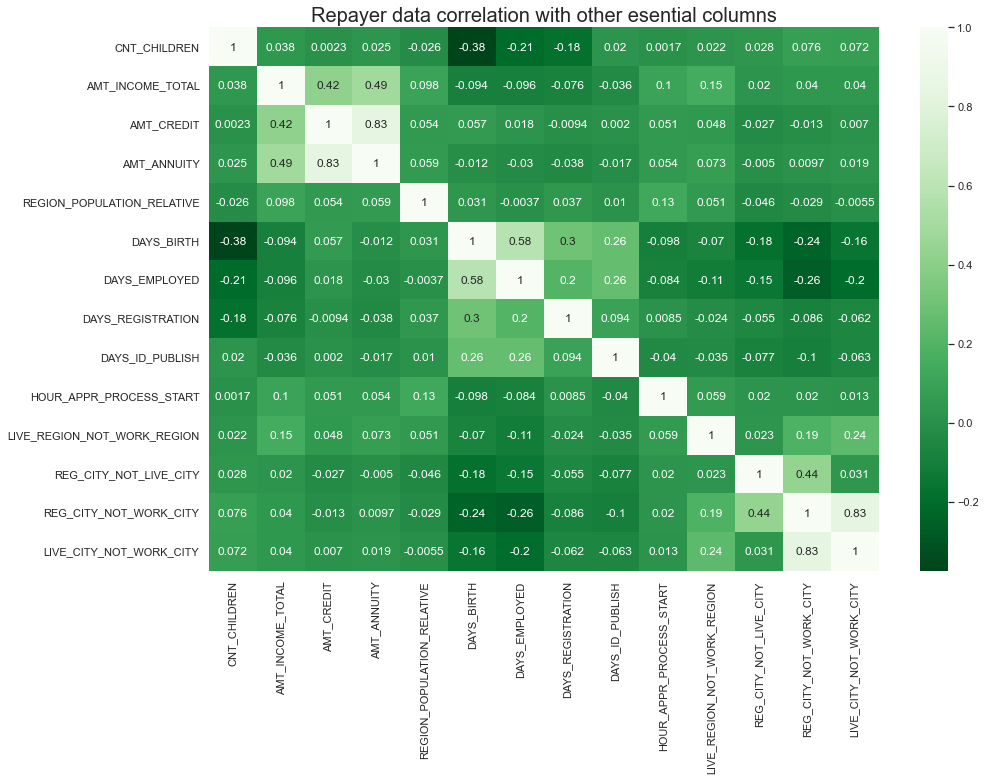

In [188]:
plt.figure(figsize=(15,10))
sns.heatmap(repayer_0, annot=True, cmap='Greens_r',)
plt.title("Repayer data correlation with other esential columns", fontsize='20')
plt.show()

### Defaulters

In [189]:
corr_df_defaulter = defaulter_df.corr()
corr_df_defaulter= corr_df_defaulter.where(np.triu(np.ones(corr_df_defaulter.shape), k=1).astype(np.bool))
corr_df_defaulter= corr_df_defaulter.unstack().reset_index()
corr_df_defaulter.columns= ['Var1','Var2','Correlation']
corr_df_defaulter.dropna(subset=['Correlation'],inplace=True)
corr_df_defaulter['Correlation']= np.round(corr_df_defaulter['Correlation'],2)
corr_df_defaulter['Correlation']= abs(corr_df_defaulter['Correlation'])
corr_df_defaulter= corr_df_defaulter.sort_values(by= ['Correlation'],ascending=False).head(10)
corr_df_defaulter

,Var1,Var2,Correlation
724,OBS_60_CNT_SOCIAL_CIRCLE,OBS_30_CNT_SOCIAL_CIRCLE,1.00
130,AMT_GOODS_PRICE,AMT_CREDIT,0.98
395,REGION_RATING_CLIENT_W_CITY,REGION_RATING_CLIENT,0.96
320,CNT_FAM_MEMBERS,CNT_CHILDREN,0.89
757,DEF_60_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,0.87
527,LIVE_REGION_NOT_WORK_REGION,REG_REGION_NOT_WORK_REGION,0.85
626,LIVE_CITY_NOT_WORK_CITY,REG_CITY_NOT_WORK_CITY,0.78
98,AMT_ANNUITY,AMT_CREDIT,0.75
131,AMT_GOODS_PRICE,AMT_ANNUITY,0.75
230,DAYS_EMPLOYED,DAYS_BIRTH,0.58


In [191]:
Defaulter_corr=repayer_df[['CNT_CHILDREN','AMT_INCOME_TOTAL','AMT_CREDIT','AMT_ANNUITY','REGION_POPULATION_RELATIVE','DAYS_BIRTH',
                'DAYS_EMPLOYED','DAYS_REGISTRATION','DAYS_ID_PUBLISH','HOUR_APPR_PROCESS_START','LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY']]
Defaulter_corr.head()

,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,HOUR_APPR_PROCESS_START,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY
1,0,2.700,12.935025,35698.5,0.003541,16765,1188,1186.0,291,11,0,0,0,0
2,0,0.675,1.350000,6750.0,0.010032,19046,225,4260.0,2531,9,0,0,0,0
3,0,1.350,3.126825,29686.5,0.008019,19005,3039,9833.0,2437,17,0,0,0,0
4,0,1.215,5.130000,21865.5,0.028663,19932,3038,4311.0,3458,11,0,0,1,1
5,0,0.990,4.904955,27517.5,0.035792,16941,1588,4970.0,477,16,0,0,0,0


In [192]:
Defaulter_1= Defaulter_corr.corr(method='spearman')
Defaulter_1

,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,HOUR_APPR_PROCESS_START,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY
CNT_CHILDREN,1.000000,0.038308,0.002315,0.024767,-0.025551,-0.375639,-0.205693,-0.180517,0.019986,0.001725,0.021523,0.027788,0.076212,0.071585
AMT_INCOME_TOTAL,0.038308,1.000000,0.416017,0.485699,0.097772,-0.093515,-0.095898,-0.076387,-0.035931,0.102384,0.148976,0.020368,0.040087,0.040321
AMT_CREDIT,0.002315,0.416017,1.000000,0.831900,0.053570,0.057151,0.017986,-0.009416,0.001982,0.051370,0.047740,-0.026649,-0.012662,0.006972
AMT_ANNUITY,0.024767,0.485699,0.831900,1.000000,0.058591,-0.011740,-0.030195,-0.037717,-0.016569,0.054189,0.073054,-0.004963,0.009717,0.019451
REGION_POPULATION_RELATIVE,-0.025551,0.097772,0.053570,0.058591,1.000000,0.030730,-0.003651,0.036684,0.010463,0.128237,0.051195,-0.045545,-0.029350,-0.005476
DAYS_BIRTH,-0.375639,-0.093515,0.057151,-0.011740,0.030730,1.000000,0.583711,0.298130,0.261979,-0.098444,-0.070065,-0.180952,-0.239113,-0.156588
DAYS_EMPLOYED,-0.205693,-0.095898,0.017986,-0.030195,-0.003651,0.583711,1.000000,0.201306,0.259900,-0.084417,-0.112790,-0.145590,-0.262852,-0.198795
DAYS_REGISTRATION,-0.180517,-0.076387,-0.009416,-0.037717,0.036684,0.298130,0.201306,1.000000,0.094153,0.008471,-0.024163,-0.055307,-0.085865,-0.062442
DAYS_ID_PUBLISH,0.019986,-0.035931,0.001982,-0.016569,0.010463,0.261979,0.259900,0.094153,1.000000,-0.039755,-0.034776,-0.077360,-0.101050,-0.062976
HOUR_APPR_PROCESS_START,0.001725,0.102384,0.051370,0.054189,0.128237,-0.098444,-0.084417,0.008471,-0.039755,1.000000,0.058612,0.019765,0.020448,0.012789


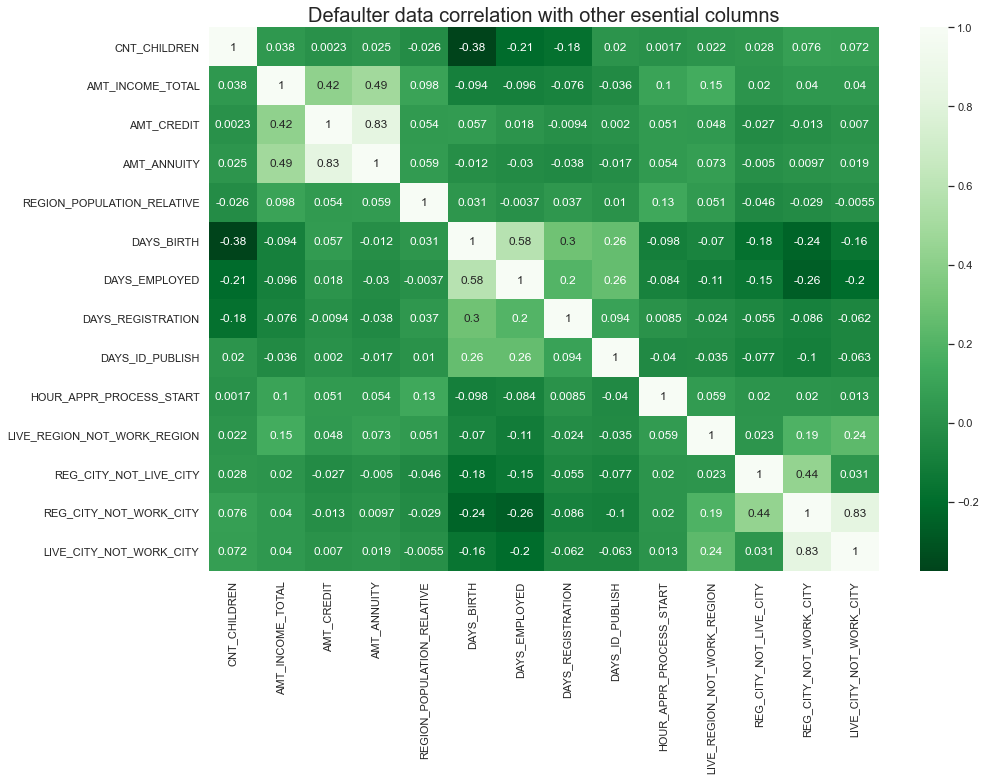

In [193]:
plt.figure(figsize=(15,10))
sns.heatmap(Defaulter_1, annot=True, cmap='Greens_r',)
plt.title("Defaulter data correlation with other esential columns", fontsize='20')
plt.show()

## Merge Data Set

In [194]:
new_df = current_applications.merge(previous_applications, how='inner', on='SK_ID_CURR')
new_df.shape

(1413701, 85)

In [195]:
new_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1413701 entries, 0 to 1413700
Data columns (total 85 columns):
 #   Column                        Non-Null Count    Dtype   
---  ------                        --------------    -----   
 0   SK_ID_CURR                    1413701 non-null  int64   
 1   TARGET                        1413701 non-null  int64   
 2   NAME_CONTRACT_TYPE_x          1413701 non-null  object  
 3   CODE_GENDER                   1413701 non-null  object  
 4   FLAG_OWN_CAR                  1413701 non-null  object  
 5   FLAG_OWN_REALTY               1413701 non-null  object  
 6   CNT_CHILDREN                  1413701 non-null  int64   
 7   AMT_INCOME_TOTAL              1413701 non-null  float64 
 8   AMT_CREDIT_x                  1413701 non-null  float64 
 9   AMT_ANNUITY_x                 1413608 non-null  float64 
 10  AMT_GOODS_PRICE_x             1412493 non-null  float64 
 11  NAME_TYPE_SUITE_x             1410175 non-null  object  
 12  NAME_INCOME_TY

In [196]:
new_df['NAME_CASH_LOAN_PURPOSE'].value_counts()

XAP                                 786937
XNA                                 567351
Repairs                              20117
Other                                13432
Urgent needs                          7236
Buying a used car                     2469
Building a house or an annex          2344
Everyday expenses                     2052
Medicine                              1871
Payments on other loans               1573
Education                             1334
Journey                               1042
Purchase of electronic equipment       934
Buying a new car                       886
Wedding / gift / holiday               801
Buying a home                          701
Car repairs                            691
Furniture                              660
Buying a holiday home / land           463
Business development                   359
Gasification / water supply            251
Buying a garage                        116
Hobby                                   45
Money for a

In [197]:
new_df['NAME_CONTRACT_STATUS'].value_counts()

Approved        886099
Canceled        259441
Refused         245390
Unused offer     22771
Name: NAME_CONTRACT_STATUS, dtype: int64

In [198]:
Repayer = new_df[new_df['TARGET']==0]
Defaulter = new_df[new_df['TARGET']==1]

In [199]:
Repayer.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_x,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,NAME_TYPE_SUITE_x,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START_x,HOUR_APPR_PROCESS_START_x,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_3,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AGE,AGE_GROUP,EMPLOYED_YEARS,EMPLOYED_FOR_YEARS,TOTAL_AMT_INCOME,TOTAL_AMT_CREDIT,TOTAL_AMT_GOODS_PRICE,SK_ID_PREV,NAME_CONTRACT_TYPE_y,AMT_ANNUITY_y,AMT_APPLICATION,AMT_CREDIT_y,AMT_GOODS_PRICE_y,WEEKDAY_APPR_PROCESS_START_y,HOUR_APPR_PROCESS_START_y,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE_y,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
1,100003,0,Cash loans,F,N,N,0,2.700,12.935025,35698.5,11.295,Family,State servant,Higher education,Married,House / apartment,0.003541,16765,1188,1186.0,291,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,1.0,0.0,1.0,0.0,828.0,1,0.0,0.0,0.0,0.0,0.0,0.0,45.931507,45-50,3.254795,30 Above,2L-3L,10L Above,10L Above,1810518,Cash loans,98356.995,900000.0,1035882.0,900000.0,FRIDAY,12,Y,1,XNA,Approved,746,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,low_normal,Cash X-Sell: low,365243.0,716.0,386.0,536.0,527.0,1.0
2,100003,0,Cash loans,F,N,N,0,2.700,12.935025,35698.5,11.295,Family,State servant,Higher education,Married,House / apartment,0.003541,16765,1188,1186.0,291,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,1.0,0.0,1.0,0.0,828.0,1,0.0,0.0,0.0,0.0,0.0,0.0,45.931507,45-50,3.254795,30 Above,2L-3L,10L Above,10L Above,2636178,Consumer loans,64567.665,337500.0,348637.5,337500.0,SUNDAY,17,Y,1,XAP,Approved,828,Cash through the bank,XAP,Family,Refreshed,Furniture,POS,XNA,Stone,1400,Furniture,6.0,middle,POS industry with interest,365243.0,797.0,647.0,647.0,639.0,0.0
3,100003,0,Cash loans,F,N,N,0,2.700,12.935025,35698.5,11.295,Family,State servant,Higher education,Married,House / apartment,0.003541,16765,1188,1186.0,291,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,1.0,0.0,1.0,0.0,828.0,1,0.0,0.0,0.0,0.0,0.0,0.0,45.931507,45-50,3.254795,30 Above,2L-3L,10L Above,10L Above,2396755,Consumer loans,6737.310,68809.5,68053.5,68809.5,SATURDAY,15,Y,1,XAP,Approved,2341,Cash through the bank,XAP,Family,Refreshed,Consumer Electronics,POS,XNA,Country-wide,200,Consumer electronics,12.0,middle,POS household with interest,365243.0,2310.0,1980.0,1980.0,1976.0,1.0
4,100004,0,Revolving loans,M,Y,Y,0,0.675,1.350000,6750.0,1.350,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,19046,225,4260.0,2531,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.0,0.0,0.0,0.0,815.0,0,0.0,0.0,0.0,0.0,0.0,0.0,52.180822,50-55,0.616438,30 Above,0-1L,1L-2L,1L-2L,1564014,Consumer loans,5357.250,24282.0,20106.0,24282.0,FRIDAY,5,Y,1,XAP,Approved,815,Cash through the bank,XAP,Unaccompanied,New,Mobile,POS,XNA,Regional / Local,30,Connectivity,4.0,middle,POS mobile without interest,365243.0,784.0,694.0,724.0,714.0,0.0
5,100006,0,Cash loans,F,N,Y,0,1.350,3.126825,29686.5,2.970,Unaccompanie

## multivariate ANalysis

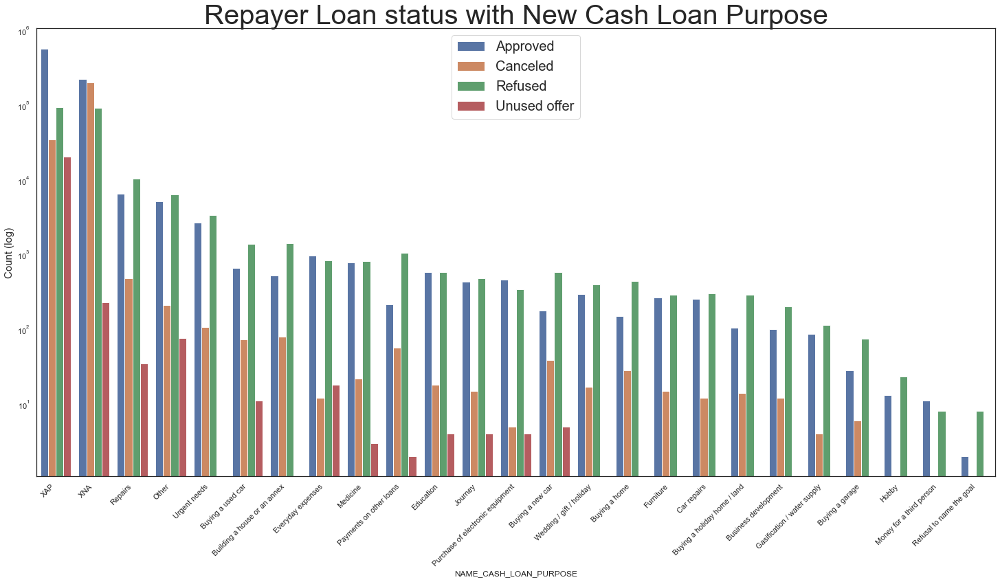

In [200]:
plt.figure(figsize=(25,12))
sns.countplot(data =Repayer ,x='NAME_CASH_LOAN_PURPOSE',hue='NAME_CONTRACT_STATUS', order = Repayer['NAME_CASH_LOAN_PURPOSE'].value_counts().index)
plt.yscale('log')
plt.ylabel("Count (log)",fontsize=15)
plt.xticks(rotation=45, ha='right')
plt.legend(fontsize=20)
plt.title("Repayer Loan status with New Cash Loan Purpose", fontsize=40)
plt.show()

### Observation

1. It would be desirable to reduce the number of unknown values in loan purposes (XAP, XNA)
2. The default rate for loans taken for repairs appears to be the highest
3. Numerous applications for repairs or other services have been rejected by banks or refused by clients. As a result, we can infer that banks consider repair a high risk. Furthermore, either they are rejected or the bank offers them a loan with a high interest rate that the clients cannot afford.

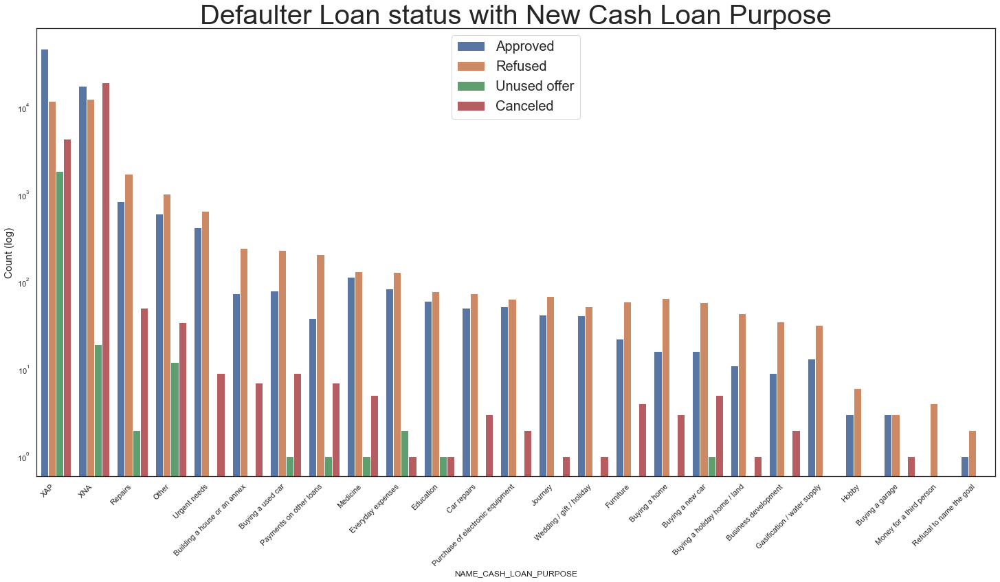

In [201]:
plt.figure(figsize=(25,12))
sns.countplot(data =Defaulter ,x='NAME_CASH_LOAN_PURPOSE',hue='NAME_CONTRACT_STATUS', order = Defaulter['NAME_CASH_LOAN_PURPOSE'].value_counts().index)
plt.yscale('log')
plt.ylabel("Count (log)",fontsize=15)
plt.xticks(rotation=45, ha='right')
plt.legend(fontsize=20)
plt.title("Defaulter Loan status with New Cash Loan Purpose", fontsize=40)
plt.show()

In [202]:
data= new_df.copy()
data.groupby(by='NAME_CONTRACT_STATUS').TARGET.value_counts(normalize=True)*100

NAME_CONTRACT_STATUS  TARGET
Approved              0         92.411345
                      1          7.588655
Canceled              0         90.826431
                      1          9.173569
Refused               0         88.003586
                      1         11.996414
Unused offer          0         91.748276
                      1          8.251724
Name: TARGET, dtype: float64

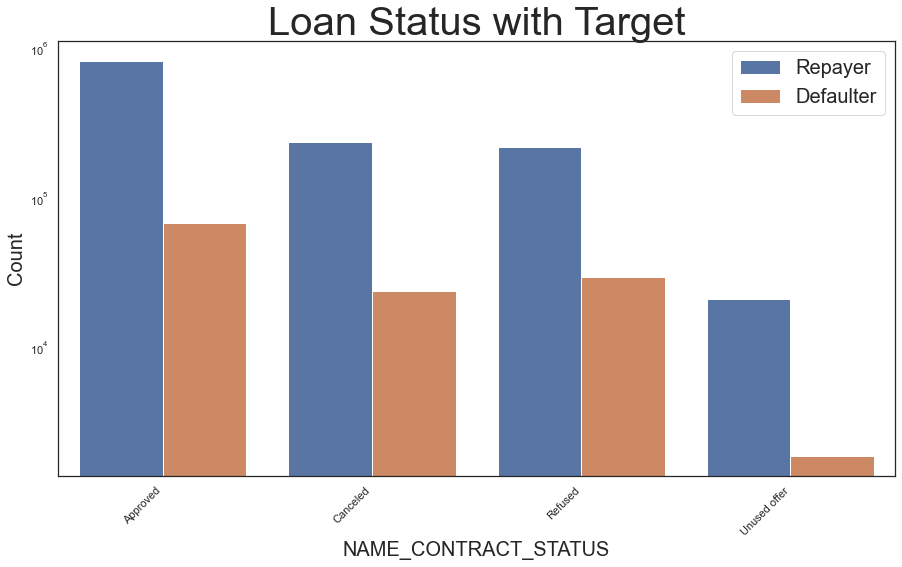

In [203]:
plt.figure(figsize=(15,8))
sns.countplot(data=new_df,x='NAME_CONTRACT_STATUS',hue='TARGET')
plt.legend(['Repayer','Defaulter'], fontsize=20)
plt.xlabel('NAME_CONTRACT_STATUS', fontsize=20)
plt.xticks(rotation=45, ha='right')
plt.ylabel('Count',fontsize=20)
plt.yscale('log')
plt.title("Loan Status with Target", fontsize=40)

plt.show()

### Onservation

1. Previously cancelled clients have actually repaid the loan
2. People who refused the loan have applied and Repaid the Loan